In [1]:
import pandas as pd
import os
from sys import platform
import matplotlib.pyplot as plt
import datetime
import numpy as np
import pickle
import seaborn as sns
from minepy import MINE
%config InlineBackend.figure_format = 'retina'

In [2]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# 1.Raw Data Loading

In [3]:
dir_raw_data = './fitbod_LiYunge_20200807-185509.csv'

In [4]:
raw_data_df = pd.read_csv(dir_raw_data)

In [5]:
raw_data_df.head(n=10)

,Date,workoutId,exerciseId,singleSetId,exerciseName,reps,weight,fake_user_id
0,2018-11-07,HVR6PqUJ1h,G1mxtZtEs5,OEGAjIVQFJ,Back Squat,5,29.483539,fake_id_914
1,2020-03-23,dWFJqrWXSC,ZAIuKpHvue,npHCsmG0eM,Dumbbell Lunge,5,6.803894,fake_id_916
2,2020-02-11,0JcIc38PW7,G1mxtZtEs5,uGei9KiU7y,Back Squat,4,29.483539,fake_id_898
3,2019-04-05,dCzb3hMeTL,mvkMgAdecH,uzMUFki4fS,Dumbbell Shoulder Press,12,18.143716,fake_id_896
4,2019-12-22,S6zuHg6LqC,mnwUcsbS9T,EaWViP9DD3,Barbell Bench Press,10,61.235043,fake_id_899
5,2019-12-03,ICEsgIu03E,dXqYJgUYO6,kwKB4ylYq4,Deadlift,8,88.450617,fake_id_887
6,2020-02-02,mZFHDi9DEg,52vo7F7CLd,gSFeEVi9N4,Close-Grip Bench Press,3,83.914688,fake_id_892
7,2019-09-27,U1T5ed4nX9,dXqYJgUYO6,Jr3oQFAlpM,Deadlift,10,20.411681,fake_id_898
8,2019-02-25,2sFB0MK9tL,h85ZOw37Wc,RvcixTRouP,Dumbbell Bench Press,8,20.411681,fake_id_936
9,2019-12-06,IMFREGfnFB,52vo7F7CLd,owRmy21t3k,Close-Grip Bench Press,6,70.306901,fake_id_879


In [6]:
raw_data_df.shape

(25223, 8)

## 1.1 Data Type Conversion

Check the data type of the original data in the current dataset.

In [7]:
raw_data_df.dtypes

Date             object
workoutId        object
exerciseId       object
singleSetId      object
exerciseName     object
reps              int64
weight          float64
fake_user_id     object
dtype: object

All the features have proper data type, except for the 'Date' feature. 

For 'Date',We need to transform the data type from 'object' to 'datetime' for further processing and analysis.

In [8]:
datetime_series = pd.to_datetime(raw_data_df['Date'], format='%Y-%m-%d')

In [9]:
raw_data_df['Date'] = datetime_series

In [10]:
raw_data_df['Date']

0       2018-11-07
1       2020-03-23
2       2020-02-11
3       2019-04-05
4       2019-12-22
           ...    
25218   2018-04-15
25219   2019-10-02
25220   2019-04-17
25221   2020-04-13
25222   2019-12-02
Name: Date, Length: 25223, dtype: datetime64[ns]

In [11]:
raw_data_df.dtypes

Date            datetime64[ns]
workoutId               object
exerciseId              object
singleSetId             object
exerciseName            object
reps                     int64
weight                 float64
fake_user_id            object
dtype: object

## 1.2 Measuring Unit Conversion

Notice that 'weight' is measured in kg, instead of lb, which make the data badly formatted in infinite decimals.Also, I notice that all the weights of equipments in Fitbod APP are measured in lb.

Convert the weight data to lb.

1 kg = 2.20462262185 lb

Notice that in the Fitbod App, the equipment weights are rounded up to one decimal place. Here we round all the weights in lb to one decimal place.

In [12]:
raw_data_df

,Date,workoutId,exerciseId,singleSetId,exerciseName,reps,weight,fake_user_id
0,2018-11-07,HVR6PqUJ1h,G1mxtZtEs5,OEGAjIVQFJ,Back Squat,5,29.483539,fake_id_914
1,2020-03-23,dWFJqrWXSC,ZAIuKpHvue,npHCsmG0eM,Dumbbell Lunge,5,6.803894,fake_id_916
2,2020-02-11,0JcIc38PW7,G1mxtZtEs5,uGei9KiU7y,Back Squat,4,29.483539,fake_id_898
3,2019-04-05,dCzb3hMeTL,mvkMgAdecH,uzMUFki4fS,Dumbbell Shoulder Press,12,18.143716,fake_id_896
4,2019-12-22,S6zuHg6LqC,mnwUcsbS9T,EaWViP9DD3,Barbell Bench Press,10,61.235043,fake_id_899
...,...,...,...,...,...,...,...,...
25218,2018-04-15,NR6hhhIjCk,ZAIuKpHvue,OVoCEDXE15,Dumbbell Lunge,4,31.751504,fake_id_881
25219,2019-10-02,JacTVkcAEp,mnwUcsbS9T,6skzaeuarT,Barbell Bench Press,3,102.058405,fake_id_946
25220,2019-04-17,GRub4UrSHF,G1mxtZtEs5,f9YkEjKT4k,Back Squat,10,72.574866,fake_id_896
25221,2020-04-13,xgG5taVJQG,bOhZg3HbGM,BlFcBeivzF,Dumbbell Bent Over Row,10,12.000000,fake_id_951


In [13]:
raw_data_df['weight'] = round(raw_data_df['weight'] * 2.20462262185,1)
raw_data_df['weight']

0         65.0
1         15.0
2         65.0
3         40.0
4        135.0
         ...  
25218     70.0
25219    225.0
25220    160.0
25221     26.5
25222    245.0
Name: weight, Length: 25223, dtype: float64

# 2. Data Ingestion

## 2.1 Feature Classification based on Data Type

In [14]:
feature_list = list(raw_data_df.columns)
print('We have',len(feature_list),'features in the raw dataset.')
print('All features in the raw dataset:')
for i,col in enumerate(feature_list):
    print(i+1,'.',col)

We have 8 features in the raw dataset.
All features in the raw dataset:
1 . Date
2 . workoutId
3 . exerciseId
4 . singleSetId
5 . exerciseName
6 . reps
7 . weight
8 . fake_user_id


For this case, the number of features is small, so we could figure out the feature types directly.

In [15]:
raw_nominal_var = ['workoutId','exerciseId','singleSetId','exerciseName','fake_user_id']
raw_ordinal_var = ['Date']
raw_numerical_var = ['reps','weight']

For more complicated case with a huge number of features, we could figure out the feature types by looking at the distribution of the features. Another quicker and easier way is to look at the number and sample values of unqiue values for each features in the following way.

In [16]:
for i,col in enumerate(list(raw_data_df.columns)):
    print(i+1,'.',col,'——Number of unique values',len(raw_data_df[col].unique()))
    print(raw_data_df[col].unique())
    print('\n')

1 . Date ——Number of unique values 881
['2018-11-07T00:00:00.000000000' '2020-03-23T00:00:00.000000000'
 '2020-02-11T00:00:00.000000000' '2019-04-05T00:00:00.000000000'
 '2019-12-22T00:00:00.000000000' '2019-12-03T00:00:00.000000000'
 '2020-02-02T00:00:00.000000000' '2019-09-27T00:00:00.000000000'
 '2019-02-25T00:00:00.000000000' '2019-12-06T00:00:00.000000000'
 '2018-10-26T00:00:00.000000000' '2018-09-18T00:00:00.000000000'
 '2020-03-09T00:00:00.000000000' '2019-06-02T00:00:00.000000000'
 '2019-11-23T00:00:00.000000000' '2020-02-28T00:00:00.000000000'
 '2019-11-07T00:00:00.000000000' '2019-05-07T00:00:00.000000000'
 '2018-06-05T00:00:00.000000000' '2019-08-28T00:00:00.000000000'
 '2018-10-11T00:00:00.000000000' '2020-01-23T00:00:00.000000000'
 '2019-12-09T00:00:00.000000000' '2018-09-14T00:00:00.000000000'
 '2019-11-16T00:00:00.000000000' '2020-05-06T00:00:00.000000000'
 '2019-04-26T00:00:00.000000000' '2018-11-03T00:00:00.000000000'
 '2019-11-06T00:00:00.000000000' '2018-10-17T00:00:

## 2.2 Data Missing (Space & NaN) and Imputing

Some raw data always include 'spaces' for missed data. First, we eliminate these 'spaces' by replacing them with np.NaN

In [164]:
data_df = raw_data_df.replace(' ',np.NaN)

In [165]:
data_df

,Date,workoutId,exerciseId,singleSetId,exerciseName,reps,weight,fake_user_id
0,2018-11-07,HVR6PqUJ1h,G1mxtZtEs5,OEGAjIVQFJ,Back Squat,5,65.0,fake_id_914
1,2020-03-23,dWFJqrWXSC,ZAIuKpHvue,npHCsmG0eM,Dumbbell Lunge,5,15.0,fake_id_916
2,2020-02-11,0JcIc38PW7,G1mxtZtEs5,uGei9KiU7y,Back Squat,4,65.0,fake_id_898
3,2019-04-05,dCzb3hMeTL,mvkMgAdecH,uzMUFki4fS,Dumbbell Shoulder Press,12,40.0,fake_id_896
4,2019-12-22,S6zuHg6LqC,mnwUcsbS9T,EaWViP9DD3,Barbell Bench Press,10,135.0,fake_id_899
...,...,...,...,...,...,...,...,...
25218,2018-04-15,NR6hhhIjCk,ZAIuKpHvue,OVoCEDXE15,Dumbbell Lunge,4,70.0,fake_id_881
25219,2019-10-02,JacTVkcAEp,mnwUcsbS9T,6skzaeuarT,Barbell Bench Press,3,225.0,fake_id_946
25220,2019-04-17,GRub4UrSHF,G1mxtZtEs5,f9YkEjKT4k,Back Squat,10,160.0,fake_id_896
25221,2020-04-13,xgG5taVJQG,bOhZg3HbGM,BlFcBeivzF,Dumbbell Bent Over Row,10,26.5,fake_id_951


In [166]:
data_df.shape

(25223, 8)

Check whether there 's any NaN value in the current dataset.

In [167]:
nan_count=data_df.isnull().sum(axis = 0)
nan_count.sort_values(ascending=False)

fake_user_id    0
weight          0
reps            0
exerciseName    0
singleSetId     0
exerciseId      0
workoutId       0
Date            0
dtype: int64

There is no space or NaN values in our dataset.

## 2.3 Data Duplication and De-duplication

First, we need to be clear about the logic of this raw dataset. Each recording(row) is one recording of the historical workout of one user on one day. The workout is marked by 'workoutId'. Each workout might include one or more exercises. For each exercise in a workout, the user might do one or more sets with different reps. All the 9 exercises involved are strength training with equipment.

The smallest granularity should be one set of exercise in one workout. Assume the primary keys for this dataset are 'workoutId','fake_user_id','Date'and 'singleSetId' together.

In [21]:
user_date_workout_set = data_df[['workoutId','fake_user_id','Date','singleSetId','exerciseName']].groupby(['workoutId','fake_user_id','Date','singleSetId']).exerciseName.nunique()

In [22]:
user_date_workout_set

workoutId   fake_user_id  Date        singleSetId
001BiFvhRT  fake_id_881   2019-05-29  Sv4GXMbyRO     1
                                      bhnmdQLWoQ     1
                                      naVHx327im     1
                                      nfPeeN6shJ     1
                                      rEtCMRGg2w     1
                                                    ..
zxxF8SYdgl  fake_id_948   2020-04-25  e62Rz2W4p4     1
zz6HEWXye1  fake_id_889   2019-04-21  9WxQTuxpi3     1
                                      Qz3w2yGXub     1
                                      lYK8wluuSE     1
                                      r9MUrJ6tEe     1
Name: exerciseName, Length: 25223, dtype: int64

Thus,('workoutId','fake_user_id','Date','singleSetId') could be taken as the primary key marking one record uniquely in the dataset.There is no duplicate in the primary key for the recordings in this dataset.

## 2.4 Outliers and Elimination/Distribution and Visualization for Each Feature

Considering the meaning of each features, only three features are probable to include outliers, including 'Date','exerciseId','exerciseName','reps' and 'weights'.

First, I conduct data visualization to learn about the distribution of each features. Next, I consider the meaning and context of each feature to identify outliers.

Univariate data visualization and descriptive statistical analysis in this part is just a very superficial study on the distribution of the data, so that we could identify and eliminate the outliers for each feature. More integrated, in-depth visualization and analysis would be performed in the following exploration part.

### 2.4.1 Date

#### Descriptive Statistics

In [24]:
data_df['Date'].describe()

count                   25223
unique                    881
top       2019-11-22 00:00:00
freq                      110
first     2017-06-27 00:00:00
last      2020-08-07 00:00:00
Name: Date, dtype: object

There is no date too early (i.e, earlier than the launching date of Fitbod) or too late(i.e., later than the current date).

So, there is no abnormal values in 'Date'.

#### Number of daily recordings

In [24]:
for i in range(len(data_df['Date'].value_counts())):
    print(data_df['Date'].value_counts().index[i],data_df['Date'].value_counts()[i])

2019-11-22 00:00:00 110
2019-10-25 00:00:00 108
2020-02-08 00:00:00 101
2019-11-11 00:00:00 99
2020-01-14 00:00:00 98
2019-10-07 00:00:00 91
2019-10-08 00:00:00 91
2020-02-11 00:00:00 85
2019-11-21 00:00:00 84
2019-12-13 00:00:00 84
2019-12-11 00:00:00 83
2019-12-03 00:00:00 83
2019-10-03 00:00:00 81
2019-11-02 00:00:00 80
2019-07-08 00:00:00 80
2019-09-10 00:00:00 79
2019-11-05 00:00:00 78
2019-06-18 00:00:00 78
2019-11-19 00:00:00 77
2019-11-24 00:00:00 76
2019-09-22 00:00:00 76
2020-01-31 00:00:00 76
2019-10-22 00:00:00 75
2019-09-16 00:00:00 75
2019-10-14 00:00:00 75
2020-01-22 00:00:00 74
2019-10-17 00:00:00 74
2019-09-30 00:00:00 74
2019-11-01 00:00:00 73
2019-11-26 00:00:00 72
2019-05-21 00:00:00 72
2019-09-18 00:00:00 71
2019-11-13 00:00:00 71
2019-11-08 00:00:00 71
2019-09-24 00:00:00 71
2019-12-24 00:00:00 71
2019-10-10 00:00:00 71
2019-09-25 00:00:00 70
2019-08-02 00:00:00 70
2019-12-15 00:00:00 70
2019-11-09 00:00:00 70
2019-12-04 00:00:00 70
2019-12-14 00:00:00 69
2019-11-

In [25]:
date_count = data_df['Date'].value_counts().sort_index()
date_count

2017-06-27     7
2017-06-29    10
2017-07-02     5
2017-09-15     9
2017-09-18     2
              ..
2020-08-03    25
2020-08-04    35
2020-08-05    30
2020-08-06    35
2020-08-07     4
Name: Date, Length: 881, dtype: int64

Text(0.5, 1.0, 'Number of Daily Recordings (2017/06/27 - 2020/08/07)')

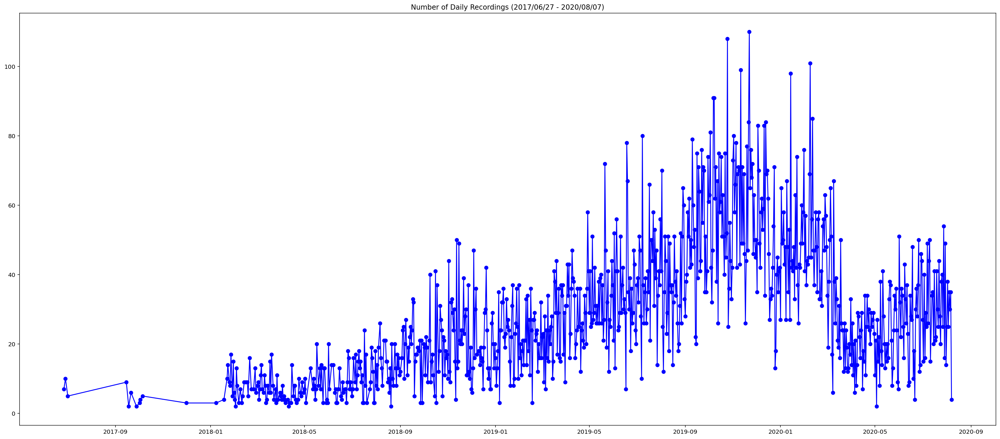

In [26]:
fig,ax = plt.subplots(figsize = (30,13))
plt.plot(date_count.index,date_count,'o-',color = 'b',label='Daily Recordings')
ax.set_title('Number of Daily Recordings (2017/06/27 - 2020/08/07)')

Two highlights:

- The data points in the early stage, i.e., before 2018.1, is very sparse. 

- There is only 4 recordings(rows) on 2020.8.7, which is the date we extract the dataset.

At this stage, we will not eliminate the data from 2020.8.7. Now, let's have a closer look at this part of data.

In [27]:
data_df_early = data_df[[(d <datetime. datetime(2018,1,1)) for d in data_df['Date']]]
data_df_early

,Date,workoutId,exerciseId,singleSetId,exerciseName,reps,weight,fake_user_id
599,2017-10-06,HAF0JBpuSJ,dXqYJgUYO6,D4zibUsBgy,Deadlift,5,44.1,fake_id_913
655,2017-10-06,HAF0JBpuSJ,dXqYJgUYO6,Qbk17mh8ED,Deadlift,6,44.1,fake_id_913
1078,2017-10-06,HAF0JBpuSJ,dXqYJgUYO6,CvFjp6kj7u,Deadlift,6,66.1,fake_id_913
1601,2017-12-01,tJaTU8AYsd,h85ZOw37Wc,AgnD60iDAn,Dumbbell Bench Press,12,33.1,fake_id_913
2075,2017-09-21,wpIzGZGr8B,mnwUcsbS9T,wErZHfWahG,Barbell Bench Press,15,61.7,fake_id_913
3210,2017-09-15,k76h06NQdB,h85ZOw37Wc,ni6FEzs7ox,Dumbbell Bench Press,10,44.1,fake_id_913
3551,2017-09-15,k76h06NQdB,h85ZOw37Wc,fq9ewzkXqH,Dumbbell Bench Press,10,66.1,fake_id_913
3715,2017-06-29,1knnX6mUKp,mnwUcsbS9T,KzhDvMr6TI,Barbell Bench Press,12,66.1,fake_id_931
3766,2017-10-02,o9b4tyFkeN,6REm9Tfqpa,MzTcM9XaoN,Dumbbell Row,8,38.6,fake_id_913
4493,2017-09-28,GCEai84Eiu,mvkMgAdecH,CJQD3cYcdJ,Dumbbell Shoulder Press,20,17.6,fake_id_913


In [28]:
data_df_early['fake_user_id'].unique()

array(['fake_id_913', 'fake_id_931'], dtype=object)

One interesting finding is that the recordings before 2018.1 are all generated from two users, 'fake_id_913' and 'fake_id_931'. Perhaps they are the most loyal and old users for Fitbod. One more probable guess is that Fitbod didn't promote the APP publicly before 2018.1. In this case, they might be internal testers. 

### 2.4.2 ExerciseId and ExerciseName

#### Descriptive Statistics

In [29]:
data_df[['exerciseId','exerciseName']].describe()

,exerciseId,exerciseName
count,25223,25223
unique,9,9
top,mnwUcsbS9T,Barbell Bench Press
freq,4162,4162


In [30]:
data_df['exerciseName'].unique()

array(['Back Squat', 'Dumbbell Lunge', 'Dumbbell Shoulder Press',
       'Barbell Bench Press', 'Deadlift', 'Close-Grip Bench Press',
       'Dumbbell Bench Press', 'Dumbbell Bent Over Row', 'Dumbbell Row'],
      dtype=object)

In [31]:
data_df['exerciseId'].unique()

array(['G1mxtZtEs5', 'ZAIuKpHvue', 'mvkMgAdecH', 'mnwUcsbS9T',
       'dXqYJgUYO6', '52vo7F7CLd', 'h85ZOw37Wc', 'bOhZg3HbGM',
       '6REm9Tfqpa'], dtype=object)

#### Check the match for each exerciseId-exerciseName pair 

In [32]:
data_df[['exerciseId','exerciseName']].drop_duplicates()

,exerciseId,exerciseName
0,G1mxtZtEs5,Back Squat
1,ZAIuKpHvue,Dumbbell Lunge
3,mvkMgAdecH,Dumbbell Shoulder Press
4,mnwUcsbS9T,Barbell Bench Press
5,dXqYJgUYO6,Deadlift
6,52vo7F7CLd,Close-Grip Bench Press
8,h85ZOw37Wc,Dumbbell Bench Press
18,bOhZg3HbGM,Dumbbell Bent Over Row
19,6REm9Tfqpa,Dumbbell Row


For each recordings, 'exerciseId' and 'exerciseName' are paired up correctly. There is no outliers in these two features.

Index the 'exerciseId' for further processing and modeling.

In [25]:
exerciseid_dict = {}
for i, id in enumerate(list(data_df['exerciseId'].unique())):
    exerciseid_dict[id] = i
exerciseid_dict

{'G1mxtZtEs5': 0,
 'ZAIuKpHvue': 1,
 'mvkMgAdecH': 2,
 'mnwUcsbS9T': 3,
 'dXqYJgUYO6': 4,
 '52vo7F7CLd': 5,
 'h85ZOw37Wc': 6,
 'bOhZg3HbGM': 7,
 '6REm9Tfqpa': 8}

In [26]:
for index in data_df.index:
    data_df.loc[index,'exerciseId'] = exerciseid_dict[data_df.loc[index,'exerciseId']]

In [27]:
data_df[['exerciseId','exerciseName']].drop_duplicates()

,exerciseId,exerciseName
0,0,Back Squat
1,1,Dumbbell Lunge
3,2,Dumbbell Shoulder Press
4,3,Barbell Bench Press
5,4,Deadlift
6,5,Close-Grip Bench Press
8,6,Dumbbell Bench Press
18,7,Dumbbell Bent Over Row
19,8,Dumbbell Row


In [35]:
data_df['exerciseId']

0        0
1        1
2        0
3        2
4        3
        ..
25218    1
25219    3
25220    0
25221    7
25222    0
Name: exerciseId, Length: 25223, dtype: object

In [36]:
data_df['exerciseId'].unique()

array([0, 1, 2, 3, 4, 5, 6, 7, 8], dtype=object)

#### Number of recordings  for each exercise

The number or recordings for each exercise could reflect the frequency of usage for each exercise, which represents the popularity of them.

In [37]:
for i in range(len(data_df['exerciseName'].value_counts())):
    print(data_df['exerciseName'].value_counts().index[i],data_df['exerciseName'].value_counts()[i])

Barbell Bench Press 4162
Dumbbell Bench Press 3931
Dumbbell Row 3672
Back Squat 3446
Dumbbell Shoulder Press 2857
Deadlift 2528
Close-Grip Bench Press 2197
Dumbbell Lunge 1381
Dumbbell Bent Over Row 1049


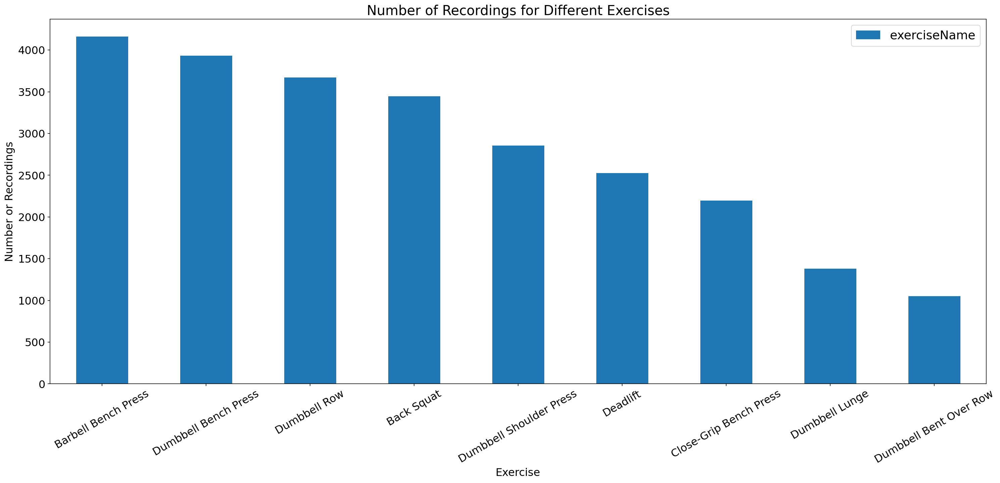

In [38]:
order = data_df['exerciseName'].value_counts()
order.to_dict()

fig,ax = plt.subplots(figsize=(25,10))
order.plot.bar()
ax.set_title('Number of Recordings for Different Exercises',fontsize=20)
plt.xlabel('Exercise', fontsize=16)
plt.ylabel('Number or Recordings', fontsize=16)
ax.tick_params(axis='y', which='major', labelsize=16,rotation = 0)
ax.tick_params(axis='x', which='major', labelsize=16,rotation = 30)
plt.legend(loc='upper right',prop={'size': 18})

In [39]:
order

Barbell Bench Press        4162
Dumbbell Bench Press       3931
Dumbbell Row               3672
Back Squat                 3446
Dumbbell Shoulder Press    2857
Deadlift                   2528
Close-Grip Bench Press     2197
Dumbbell Lunge             1381
Dumbbell Bent Over Row     1049
Name: exerciseName, dtype: int64

In [40]:
order.values

array([4162, 3931, 3672, 3446, 2857, 2528, 2197, 1381, 1049], dtype=int64)

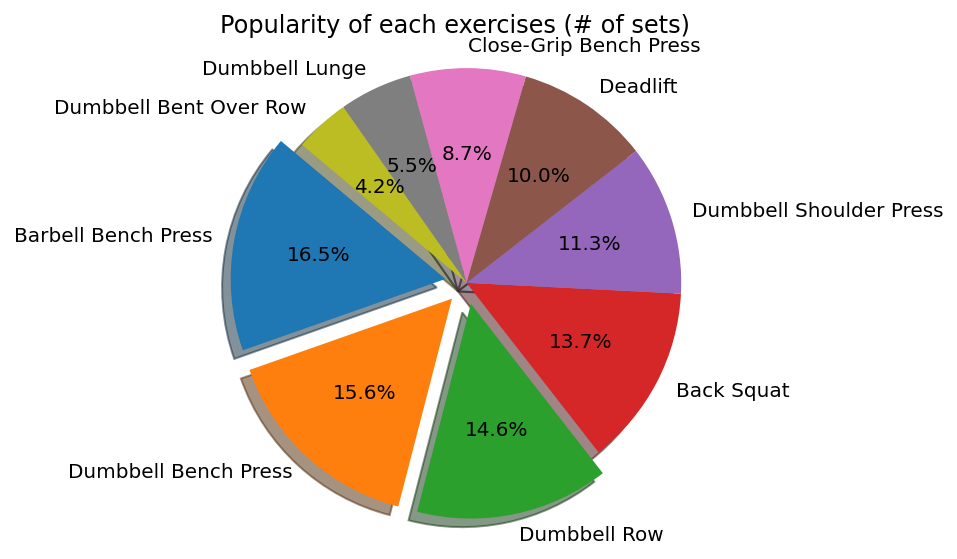

In [41]:
labels = order.index
values = order.values
explode = (0.1, 0.1, 0.1, 0,0,0,0,0,0)
plt.pie(values, explode=explode, labels=labels, autopct='%1.1f%%', shadow=True, startangle=140)
plt.title('Popularity of each exercises (# of sets)')
plt.axis('equal')
plt.tight_layout()
plt.show()

From the pie chart, we could see that the top 3 most popular exercises make up of nearly 1/2 of all the recordings, which is a huge proportion.

This is just a brief glipse on the basic distribution of exercises in the dataset, in order to detect outliers. We would conduct more profound exploration and analysis on the popularity of each exercises in the following part.

### 2.4.3 Reps and Weight

The univariate descriptive statistical analysis and data visualization is just a brief glipse on the basic distribution of reps and weight in the dataset, in order to detect outliers. In the following part, we would conduct more profound exploration and analysis on reps and weight with the combination of exercise, workout and user.

#### Descriptive Statistics

In [42]:
data_df.describe()

,reps,weight
count,25223.000000,25223.000000
mean,8.451770,90.460687
std,3.687871,69.307338
min,1.000000,1.000000
25%,5.000000,35.000000
50%,8.000000,65.000000
75%,10.000000,135.000000
max,29.000000,615.000000


Number of recordings for each reps/weight level

In [43]:
for i,col in enumerate(raw_numerical_var):
    print(i+1,'.',col,':')
    print(data_df[col].value_counts())
    print('\n')

1 . reps :
10    4789
8     4611
12    3400
5     3371
6     2786
15    1633
4     1625
3      906
7      454
2      437
9      278
20     236
11     201
1      120
13     115
25      54
14      50
16      44
24      39
18      38
29      15
21       9
17       9
22       3
Name: reps, dtype: int64


2 . weight :
30.0     1329
135.0    1306
40.0     1181
25.0     1143
45.0      967
35.0      954
20.0      905
185.0     898
50.0      892
65.0      801
225.0     759
15.0      693
55.0      684
60.0      628
155.0     617
95.0      487
115.0     462
75.0      449
205.0     412
70.0      386
44.1      370
85.0      306
175.0     289
125.0     270
165.0     261
145.0     245
105.0     241
30.9      234
100.0     221
55.1      215
80.0      213
10.0      203
245.0     190
33.1      181
120.0     175
110.0     165
35.3      165
195.0     164
66.1      163
110.2     158
160.0     158
140.0     148
275.0     147
90.0      136
132.3     134
150.0     134
26.5      126
11.0      115
22.0      115

#### 1D Distribution —— Bar Chart/Histogram/Box Plot

#### reps

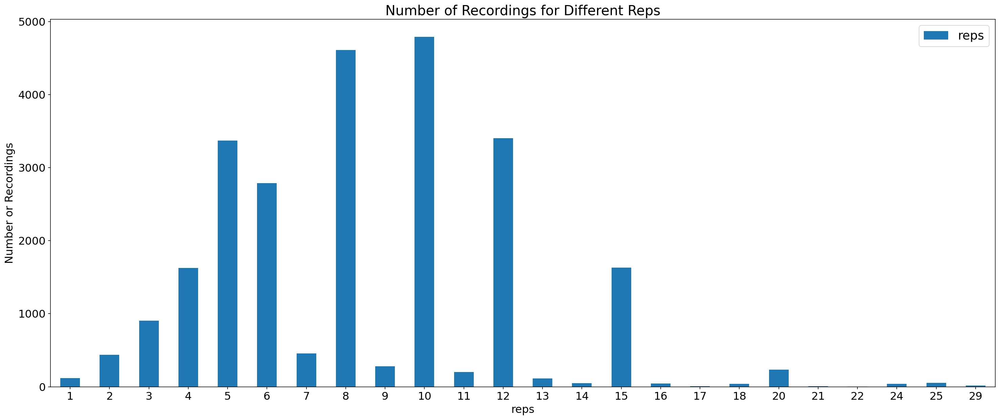

In [44]:
order_index = data_df['reps'].value_counts().sort_index()
order_index.to_dict()

fig,ax = plt.subplots(figsize=(25,10))
order_index.plot.bar()
ax.set_title('Number of Recordings for Different Reps',fontsize = 20)
plt.xlabel('reps', fontsize=16)
plt.ylabel('Number or Recordings', fontsize=16)
ax.tick_params(axis='both', which='major', labelsize=16,rotation = 0)
plt.legend(loc='upper right',prop={'size': 18})

Text(0.5, 1.0, 'Number of Recordings for Reps')

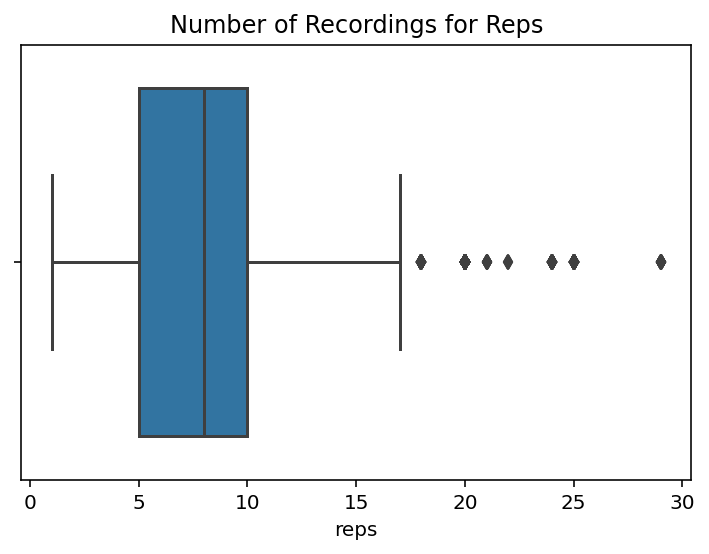

In [46]:
sns.boxplot(data_df['reps'])
plt.title('Number of Recordings for Reps')

Considering 'reps' is the number of repetition of one exercise, the distribution of 'reps' is acceptable. At this stage, we cannot rule out any outliers.



#### weight(lb)

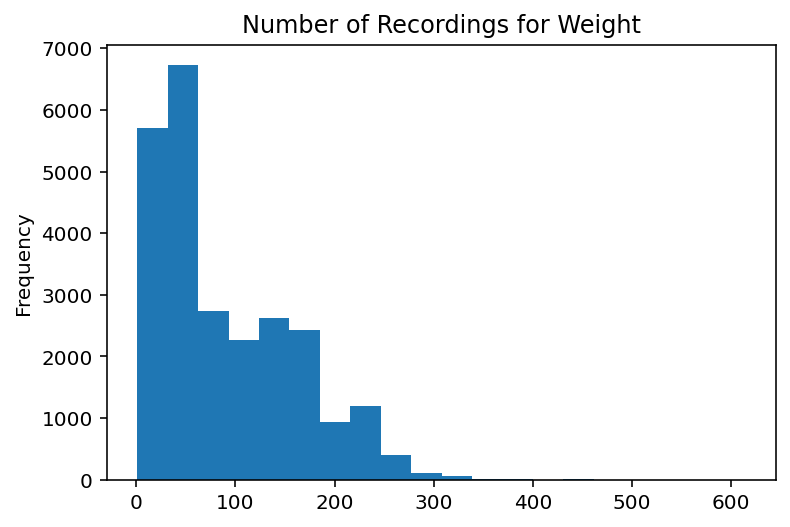

In [47]:
ax = fig.subplots()
plt.title('Number of Recordings for Weight')
data_df['weight'].plot(kind = 'hist',bins = 20)

Text(0.5, 1.0, 'Number of Recordings for Weight - Box Plot')

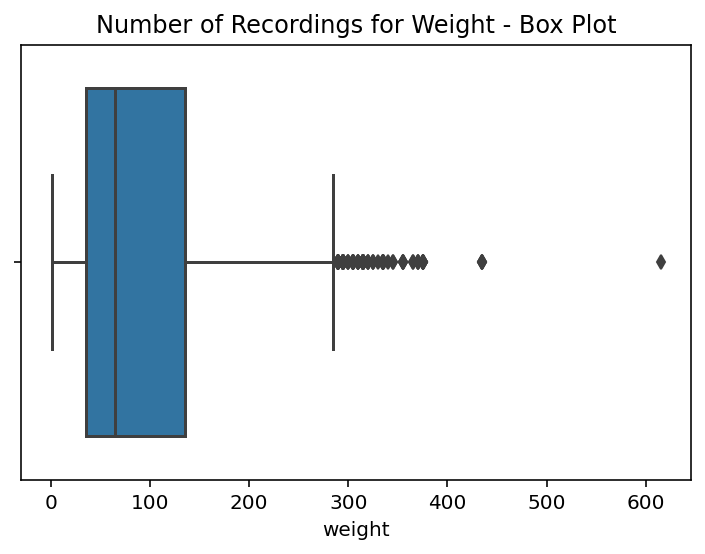

In [48]:
sns.boxplot(data_df['weight'])
plt.title('Number of Recordings for Weight - Box Plot')

Considering 'weight' is the weight of equipment in lb, based on the research of traditional weight of equipment for strength trainers, the data points with weight > 400 might be outliers.


In [168]:
data_df = data_df[data_df['weight']<400]
data_df.shape

(25218, 8)

#### Visualization for weight after outlier elimination

Text(0.5, 1.0, '1D Distribution for Weight (without outliers) - Histogram')

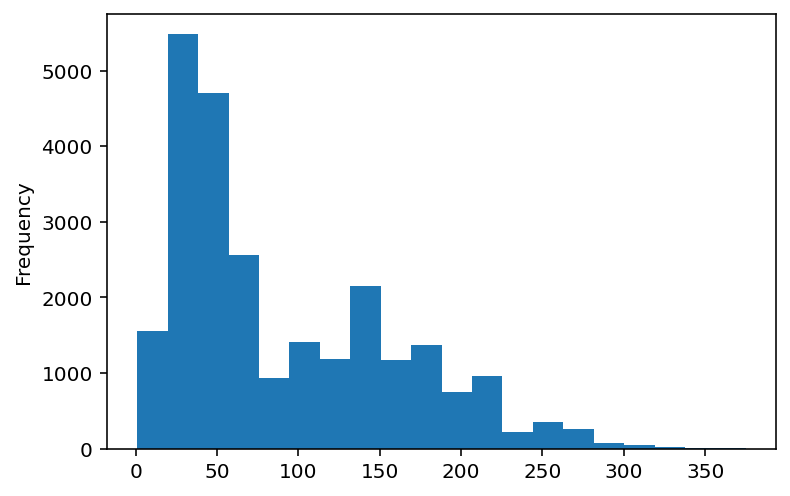

In [50]:
ax = fig.subplots()
data_df['weight'].plot(kind = 'hist',bins = 20)
ax.set_title("1D Distribution for Weight (without outliers) - Histogram")

Text(0.5, 1.0, '1D Distribution for Weight (without outliers)- Box Plot')

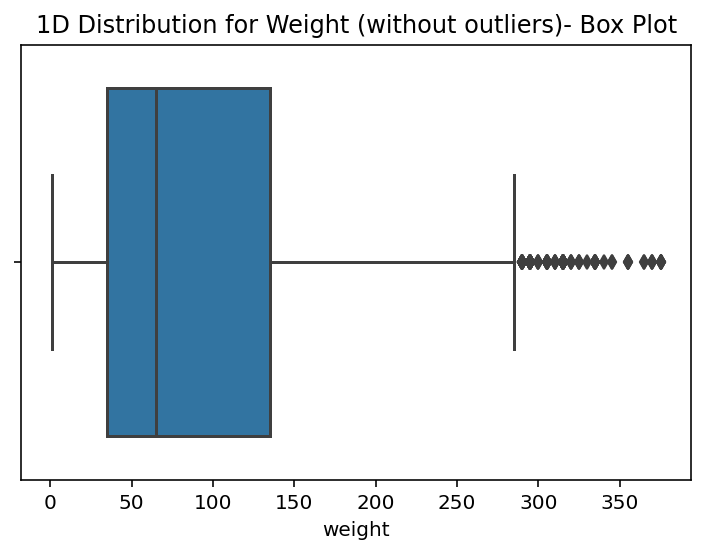

In [52]:
sns.boxplot(data_df['weight'])
plt.title('1D Distribution for Weight (without outliers)- Box Plot')

### 2.4.4 User

#### Descriptive Analysis

In [53]:
data_df['fake_user_id']

0        fake_id_914
1        fake_id_916
2        fake_id_898
3        fake_id_896
4        fake_id_899
            ...     
25218    fake_id_881
25219    fake_id_946
25220    fake_id_896
25221    fake_id_951
25222    fake_id_881
Name: fake_user_id, Length: 25218, dtype: object

In [54]:
data_df['fake_user_id'].describe()

count           25218
unique             92
top       fake_id_889
freq             1681
Name: fake_user_id, dtype: object

#### Check the Format

In [55]:
import re

In [56]:
for id in set(data_df['fake_user_id'].values):
    match = r'fake_id_[1-9]*'
    if match:
        continue
    else:
        print('Format Not Match',id)

All the data for 'fake_user_id' feature are correctly formatted as 'fake_id_xxx'

#### Check the ID Number

In [57]:
numId_list = []
for id in set(data_df['fake_user_id'].values):
    numId = id[len('fake_id_'):]
    numId_list.append(numId)
    
numId_list.sort(reverse = False)
print(numId_list)

['878', '879', '880', '881', '882', '883', '884', '885', '886', '887', '888', '889', '890', '891', '892', '893', '894', '895', '896', '897', '898', '899', '900', '901', '902', '903', '904', '905', '906', '907', '908', '909', '910', '911', '912', '913', '914', '915', '916', '917', '918', '919', '920', '921', '922', '923', '924', '925', '926', '927', '928', '929', '930', '931', '932', '933', '934', '935', '936', '937', '938', '939', '940', '941', '942', '943', '944', '945', '946', '947', '948', '949', '950', '951', '952', '953', '954', '955', '956', '957', '958', '959', '960', '961', '962', '963', '964', '965', '966', '967', '968', '969']


All the ID numbers for 'fake_user_id' feature are in the range [878,969], which means they are indexed correctly.

#### Number of recordings for each user

The number of recordings for each user could reflect the frequency of usage for each user, which represents the retention/preference. 

In [58]:
for i in range(len(data_df['fake_user_id'].value_counts())):
    print(data_df['fake_user_id'].value_counts().index[i],data_df['fake_user_id'].value_counts()[i])

fake_id_889 1681
fake_id_881 1340
fake_id_896 1268
fake_id_905 1121
fake_id_902 998
fake_id_899 831
fake_id_888 684
fake_id_913 588
fake_id_923 553
fake_id_882 546
fake_id_921 536
fake_id_916 536
fake_id_887 535
fake_id_949 492
fake_id_903 466
fake_id_908 464
fake_id_879 444
fake_id_895 430
fake_id_906 430
fake_id_878 414
fake_id_904 404
fake_id_938 384
fake_id_891 379
fake_id_917 366
fake_id_924 350
fake_id_914 338
fake_id_948 336
fake_id_892 328
fake_id_894 324
fake_id_884 303
fake_id_893 303
fake_id_880 302
fake_id_907 295
fake_id_909 289
fake_id_951 282
fake_id_885 277
fake_id_900 263
fake_id_950 256
fake_id_898 250
fake_id_931 247
fake_id_945 240
fake_id_922 237
fake_id_918 232
fake_id_883 223
fake_id_936 220
fake_id_886 180
fake_id_920 178
fake_id_901 175
fake_id_946 172
fake_id_890 161
fake_id_910 157
fake_id_942 149
fake_id_897 130
fake_id_932 127
fake_id_955 125
fake_id_959 119
fake_id_927 117
fake_id_926 117
fake_id_915 112
fake_id_912 110
fake_id_928 109
fake_id_952 89
fake_

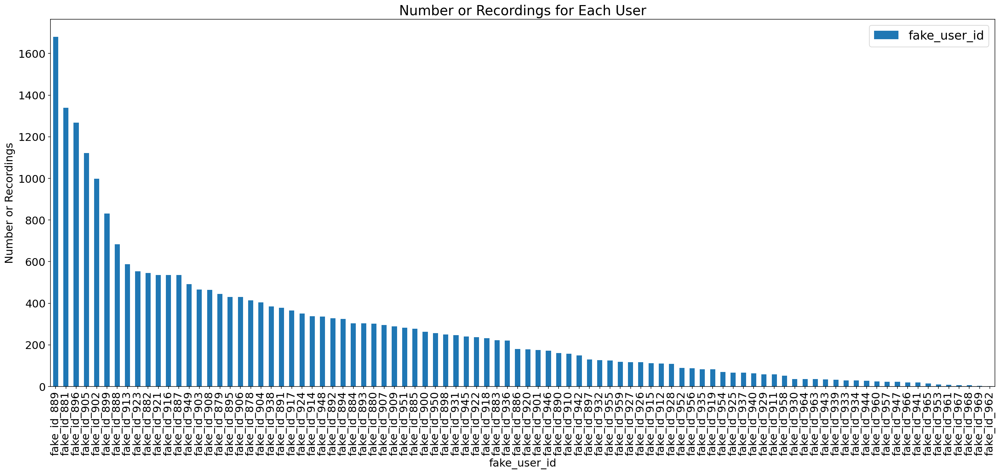

In [59]:
order = data_df['fake_user_id'].value_counts()
order.to_dict()

fig,ax = plt.subplots(figsize=(25,10))
order.plot.bar()
plt.xlabel('fake_user_id', fontsize=16)
plt.ylabel('Number or Recordings', fontsize=16)
ax.set_title('Number or Recordings for Each User',fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=16)
plt.legend(loc='upper right',prop={'size': 18})

# 3. Preliminary Data Exploration

 In this part, we will dive deeply into the behaviour pattern of our users based on the historical data we have in the raw dataset.
 
 Our exploration on users' behaviour pattern basically includes two parts:
 
 - users engagement(i.e. workout frequency) and retention
 - preference on exercise plan

## 3.1 User Engagement and Workout Frequency

In part 3.1, we will build up a table, i.e. dataframe, including features describing the  engagement (i.e., workout frequency)  retention of our users.

We will create several new features as the measurement for users'engagement and retention.

In the real-world case, it would be a lot more helpful to get more features about users, including demographic features (like gender,age, career, annual income, location, etc), physical features (like fitness history, weight, height, etc), Fitbod account features (membership plan, # of contacts on Fitbod, daily online time, etc). 

In [49]:
user_df = data_df[['fake_user_id','workoutId']].groupby(['fake_user_id']).count()
user_df.columns = ['# of Recordings']
user_df = user_df.sort_values(by='# of Recordings',ascending = False)
user_df

,# of Recordings
fake_user_id,
fake_id_889,1681
fake_id_881,1340
fake_id_896,1272
fake_id_905,1121
fake_id_902,998
fake_id_899,831
fake_id_888,684
fake_id_913,588
fake_id_923,553


In [50]:
user_df.describe()

,# of Recordings
count,92.000000
mean,274.163043
std,307.896417
min,2.000000
25%,62.750000
50%,179.000000
75%,369.250000
max,1681.000000


### 3.1.1 Historical Engagement for Each User

Use the number of recordings(workout) for each user to measure the historical engagement of users.

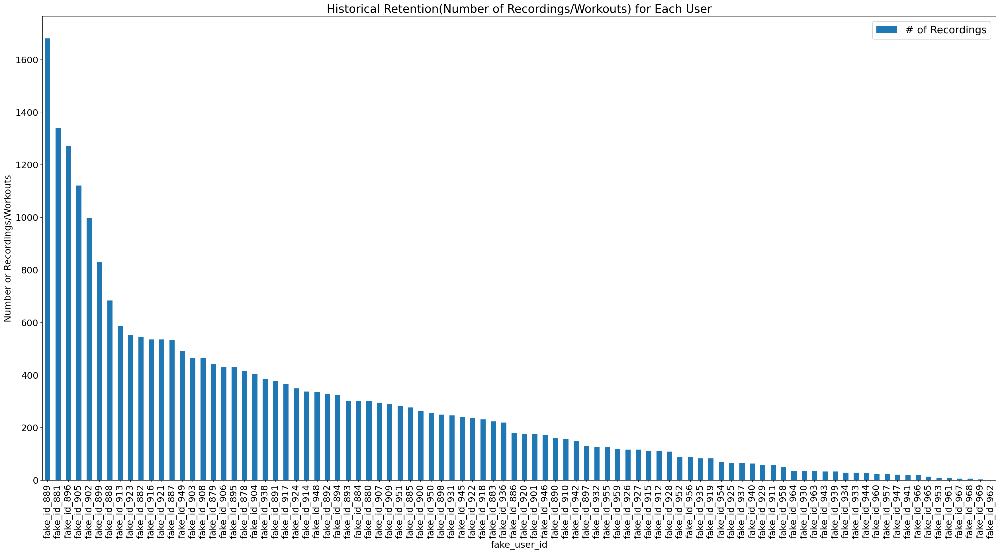

In [51]:
ax = user_df.plot(kind = 'bar',figsize = (30,15))
plt.xlabel('fake_user_id', fontsize=16)
plt.ylabel('Number or Recordings/Workouts', fontsize=16)
ax.set_title('Historical Retention(Number of Recordings/Workouts) for Each User',fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=16)
plt.legend(loc='upper right',prop={'size': 18})

Use histogram with different class intervals to get a high-level insight on the distribution of user retention.

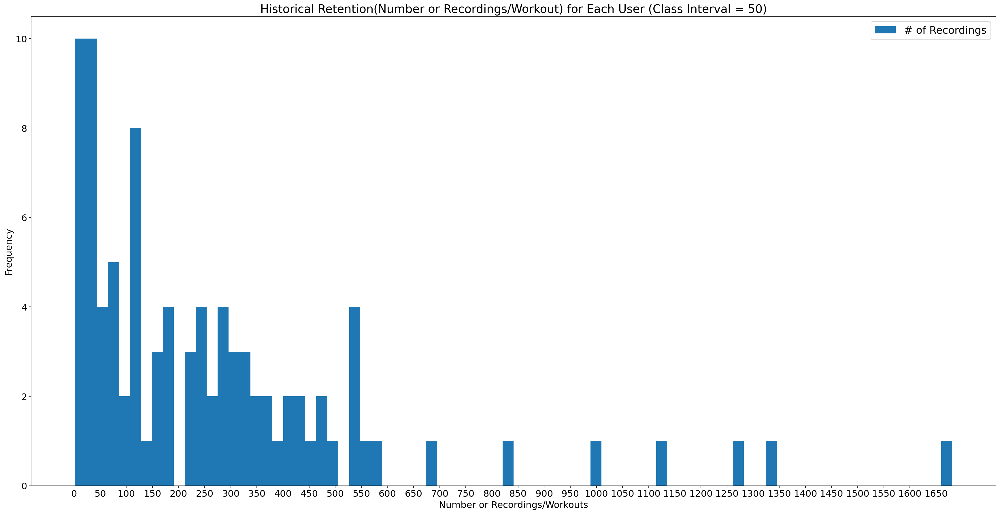

In [52]:
ax = user_df['# of Recordings'].plot(kind = 'hist',bins = 80,figsize = (30,15),xticks = np.arange(0, 1700, step=50))
plt.xlabel('Number or Recordings/Workouts', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
ax.set_title("Historical Retention(Number or Recordings/Workout) for Each User (Class Interval = 50)",fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=16)
plt.legend(loc='upper right',prop={'size': 18})

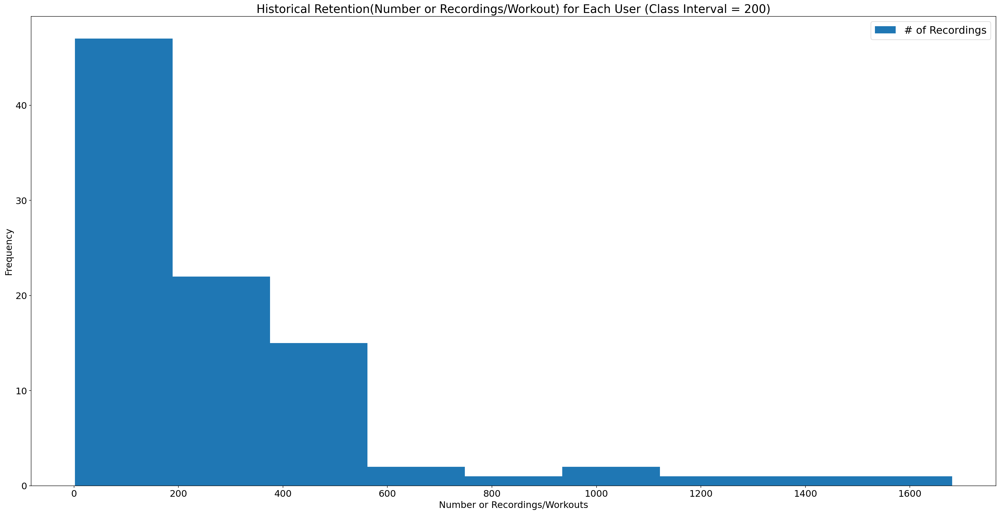

In [53]:
ax = user_df['# of Recordings'].plot(kind = 'hist',bins = 9,figsize = (30,15),xticks = np.arange(0, 1700, step=200))
plt.xlabel('Number or Recordings/Workouts', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
ax.set_title("Historical Retention(Number or Recordings/Workout) for Each User (Class Interval = 200)",fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=16)
plt.legend(loc='upper right',prop={'size': 18})

Number of recordings measures the total number of 'exercise sets' one user completed on Fitbod, which is a general representation of user engagement.


Based on the visualization of bar plot and histograms, we could segment our current users into 3 groups:

- 0 <= '# of Recordings'<= 200: Low engagement 
- 200 < '# of Recordings' <= 600: Medium engagament 
- '# of Recordings' > 600: High engagement

In [54]:
user_engage_dict = {range(0,201):1,range(201,601):2}

In [55]:
user_df['Engagement'] = user_df['# of Recordings'].apply(lambda x: next((v for k, v in user_engage_dict.items() if x in k), 3))

In [56]:
user_df

,# of Recordings,Engagement
fake_user_id,,
fake_id_889,1681,3
fake_id_881,1340,3
fake_id_896,1272,3
fake_id_905,1121,3
fake_id_902,998,3
fake_id_899,831,3
fake_id_888,684,3
fake_id_913,588,2
fake_id_923,553,2


In [57]:
engage_dict = {1:'Low Engagement',2:'Medium Engagement',3:'High Engagement'}

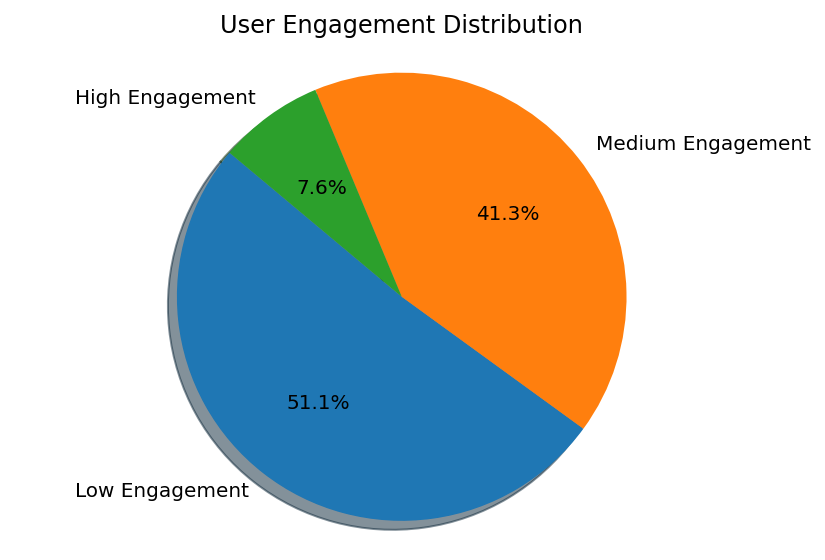

In [58]:
order = user_df['Engagement'].value_counts()
labels = engage_dict.values()
values = order.values
plt.pie(values, labels=labels, autopct='%1.1f%%', shadow=True, startangle=140)
plt.title('User Engagement Distribution')
plt.axis('equal')
plt.tight_layout()
plt.show()

At the current stage, most users are at the low engagement level. The good thing is we have a sufficient number of medium engagement users. Though the number of high engagement users is small, it shows we have users with very consistent engagement and loyalty.

The business potential is :

- Focus on acquisition, activation level to attract new users.
- Improve the engagement of medium level users to convert them into highly-engaging users.



Then, let's have a brief look at the preferred exercises for each of the 3 user segments.

In [59]:
data_user_df = data_df.join(user_df, on='fake_user_id')
data_user_df

,Date,workoutId,exerciseId,singleSetId,exerciseName,reps,weight,fake_user_id,# of Recordings,Engagement
0,2018-11-07,HVR6PqUJ1h,0,OEGAjIVQFJ,Back Squat,5,65.0,fake_id_914,338,2
1,2020-03-23,dWFJqrWXSC,1,npHCsmG0eM,Dumbbell Lunge,5,15.0,fake_id_916,536,2
2,2020-02-11,0JcIc38PW7,0,uGei9KiU7y,Back Squat,4,65.0,fake_id_898,250,2
3,2019-04-05,dCzb3hMeTL,2,uzMUFki4fS,Dumbbell Shoulder Press,12,40.0,fake_id_896,1272,3
4,2019-12-22,S6zuHg6LqC,3,EaWViP9DD3,Barbell Bench Press,10,135.0,fake_id_899,831,3
...,...,...,...,...,...,...,...,...,...,...
25218,2018-04-15,NR6hhhIjCk,1,OVoCEDXE15,Dumbbell Lunge,4,70.0,fake_id_881,1340,3
25219,2019-10-02,JacTVkcAEp,3,6skzaeuarT,Barbell Bench Press,3,225.0,fake_id_946,172,1
25220,2019-04-17,GRub4UrSHF,0,f9YkEjKT4k,Back Squat,10,160.0,fake_id_896,1272,3
25221,2020-04-13,xgG5taVJQG,7,BlFcBeivzF,Dumbbell Bent Over Row,10,26.5,fake_id_951,282,2


In [60]:
pivot = data_user_df.pivot_table(index = 'Engagement',columns = 'exerciseName',values = 'singleSetId',aggfunc=lambda x: len(x.unique()))
pivot

exerciseName,Back Squat,Barbell Bench Press,Close-Grip Bench Press,Deadlift,Dumbbell Bench Press,Dumbbell Bent Over Row,Dumbbell Lunge,Dumbbell Row,Dumbbell Shoulder Press
Engagement,,,,,,,,,
1,336,511,273,311,570,255,256,463,458
2,1589,2111,1178,1319,2222,666,897,2203,1645
3,1517,1523,742,893,1136,128,228,1002,754


In [61]:
from math import pi

In [62]:
values1 = pivot.loc[1,:].values.tolist()
values2 = pivot.loc[2,:].values.tolist()
values3 = pivot.loc[3,:].values.tolist()
values1+=values1[:1]
values2+=values2[:1]
values3+=values3[:1]

In [63]:
categories=pivot.columns
N = len(categories)
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

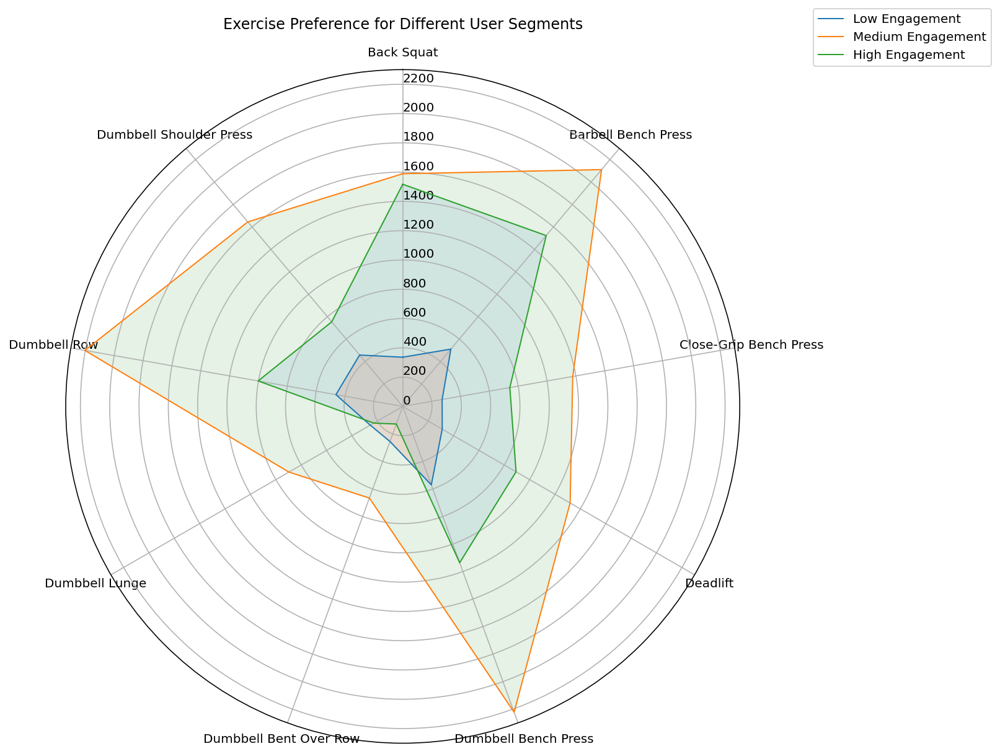

In [64]:
f = plt.figure(figsize=(15,10))
ax = plt.subplot(111, polar=True)
 
ax.set_theta_offset(pi / 2)
ax.set_theta_direction(-1)

plt.xticks(angles[:-1], categories)

ax.set_rlabel_position(0)
plt.yticks(range(0,2300,200), color="black", size=10)
plt.ylim(0,2300)
plt.title('Exercise Preference for Different User Segments')
 

ax.plot(angles, values1, linewidth=1, linestyle='solid', label="Low Engagement")
ax.fill(angles, values1, 'r', alpha=0.1)
 
ax.plot(angles, values2, linewidth=1, linestyle='solid', label="Medium Engagement")
ax.fill(angles, values2, 'g', alpha=0.1)

ax.plot(angles, values3, linewidth=1, linestyle='solid', label="High Engagement")
ax.fill(angles, values3, 'p', alpha=0.1)

plt.legend(loc='upper left', bbox_to_anchor=(1.1, 1.1))

### 3.1.2 Registration Time Span for Each User

Use the time span since the first workout for each user to see whether a user is a new user or an old user.

In [65]:
for id in user_df.index:    
    user_df.loc[id,'first_workout_date'] = (data_df[['fake_user_id','Date']].groupby(['fake_user_id']).min()).loc[id,'Date']
user_df

,# of Recordings,Engagement,first_workout_date
fake_user_id,,,
fake_id_889,1681,3,2018-01-23
fake_id_881,1340,3,2018-01-26
fake_id_896,1272,3,2019-03-28
fake_id_905,1121,3,2018-09-17
fake_id_902,998,3,2018-09-10
fake_id_899,831,3,2019-05-05
fake_id_888,684,3,2018-10-21
fake_id_913,588,2,2017-09-15
fake_id_923,553,2,2018-06-25


In [66]:
current_date = datetime.datetime(2020,8,7)

In [67]:
for id in user_df.index:    
    user_df.loc[id,'time_span(days)'] = (current_date - user_df.loc[id,'first_workout_date']).days
user_df

,# of Recordings,Engagement,first_workout_date,time_span(days)
fake_user_id,,,,
fake_id_889,1681,3,2018-01-23,927.0
fake_id_881,1340,3,2018-01-26,924.0
fake_id_896,1272,3,2019-03-28,498.0
fake_id_905,1121,3,2018-09-17,690.0
fake_id_902,998,3,2018-09-10,697.0
fake_id_899,831,3,2019-05-05,460.0
fake_id_888,684,3,2018-10-21,656.0
fake_id_913,588,2,2017-09-15,1057.0
fake_id_923,553,2,2018-06-25,774.0


We could see that the first workout date for most users are later than 2018.1, which is half a year later than the starting date for our dataset.

So, we could assume that the first workout date is probably the registration date for each user. We use the time span from the first workout to measure the registration time span for each user.

Next, we will create 4 features to measure the recent engagement of users. We select four time windows for observation, which are the typical settings for industrial data analysis.

- 7 days
- 30 day
- 90 days
- 1 yr

### 3.1.3 Times of Workout in the Recent 7 Days

In [68]:
interval_1 = 7

In [69]:
def workouts_recent(interval,current_date):  
    workouts_recent= data_df[[((current_date - d).days < interval) for d in data_df['Date']]][['fake_user_id','workoutId']].groupby(['fake_user_id']).workoutId.nunique()
    workouts_recent= pd.DataFrame(workouts_recent)
    colname = 'workouts_recent_'+str(interval)
    workouts_recent.columns =[colname]
    return workouts_recent

In [70]:
wk_recent_7 = workouts_recent(interval_1,current_date)
wk_recent_7

,workouts_recent_7
fake_user_id,
fake_id_887,2
fake_id_889,3
fake_id_891,2
fake_id_895,2
fake_id_896,4
fake_id_899,2
fake_id_900,1
fake_id_902,2
fake_id_903,2


In [71]:
user_df = user_df.join(wk_recent_7,on = 'fake_user_id').fillna(0)

In [72]:
user_df

,# of Recordings,Engagement,first_workout_date,time_span(days),workouts_recent_7
fake_user_id,,,,,
fake_id_889,1681,3,2018-01-23,927.0,3.0
fake_id_881,1340,3,2018-01-26,924.0,0.0
fake_id_896,1272,3,2019-03-28,498.0,4.0
fake_id_905,1121,3,2018-09-17,690.0,1.0
fake_id_902,998,3,2018-09-10,697.0,2.0
fake_id_899,831,3,2019-05-05,460.0,2.0
fake_id_888,684,3,2018-10-21,656.0,0.0
fake_id_913,588,2,2017-09-15,1057.0,0.0
fake_id_923,553,2,2018-06-25,774.0,2.0


### 3.1.4 Times of Workout in the Recent 30 Days

In [73]:
interval_2 = 30

In [74]:
wk_recent_30 = workouts_recent(interval_2,current_date)
wk_recent_30

,workouts_recent_30
fake_user_id,
fake_id_879,2
fake_id_882,2
fake_id_884,3
fake_id_887,9
fake_id_889,10
fake_id_891,6
fake_id_893,5
fake_id_895,10
fake_id_896,16


In [75]:
user_df = user_df.join(wk_recent_30,on = 'fake_user_id').fillna(0)

In [76]:
user_df

,# of Recordings,Engagement,first_workout_date,time_span(days),workouts_recent_7,workouts_recent_30
fake_user_id,,,,,,
fake_id_889,1681,3,2018-01-23,927.0,3.0,10.0
fake_id_881,1340,3,2018-01-26,924.0,0.0,0.0
fake_id_896,1272,3,2019-03-28,498.0,4.0,16.0
fake_id_905,1121,3,2018-09-17,690.0,1.0,8.0
fake_id_902,998,3,2018-09-10,697.0,2.0,6.0
fake_id_899,831,3,2019-05-05,460.0,2.0,13.0
fake_id_888,684,3,2018-10-21,656.0,0.0,0.0
fake_id_913,588,2,2017-09-15,1057.0,0.0,1.0
fake_id_923,553,2,2018-06-25,774.0,2.0,4.0


### 3.1.5 Times of Workout in the Recent 3 Months (90 days)

In [77]:
interval_3 = 90

In [78]:
wk_recent_90 = workouts_recent(interval_3,current_date)
wk_recent_90 

,workouts_recent_90
fake_user_id,
fake_id_879,2
fake_id_882,2
fake_id_884,15
fake_id_886,7
fake_id_887,19
fake_id_889,26
fake_id_891,25
fake_id_893,12
fake_id_895,29


In [79]:
user_df = user_df.join(wk_recent_90,on = 'fake_user_id').fillna(0)
user_df

,# of Recordings,Engagement,first_workout_date,time_span(days),workouts_recent_7,workouts_recent_30,workouts_recent_90
fake_user_id,,,,,,,
fake_id_889,1681,3,2018-01-23,927.0,3.0,10.0,26.0
fake_id_881,1340,3,2018-01-26,924.0,0.0,0.0,0.0
fake_id_896,1272,3,2019-03-28,498.0,4.0,16.0,40.0
fake_id_905,1121,3,2018-09-17,690.0,1.0,8.0,27.0
fake_id_902,998,3,2018-09-10,697.0,2.0,6.0,25.0
fake_id_899,831,3,2019-05-05,460.0,2.0,13.0,33.0
fake_id_888,684,3,2018-10-21,656.0,0.0,0.0,0.0
fake_id_913,588,2,2017-09-15,1057.0,0.0,1.0,11.0
fake_id_923,553,2,2018-06-25,774.0,2.0,4.0,25.0


### 3.1.6 Times of Workout in the Recent 1 Year(365 days)

In [80]:
interval_4 = 365
workouts_recent_yr = workouts_recent(interval_4,current_date)
workouts_recent_yr

,workouts_recent_365
fake_user_id,
fake_id_878,55
fake_id_879,48
fake_id_880,38
fake_id_881,103
fake_id_882,99
fake_id_883,17
fake_id_884,62
fake_id_885,43
fake_id_886,41


In [81]:
user_df = user_df.join(workouts_recent_yr,on = 'fake_user_id').fillna(0)
user_df

,# of Recordings,Engagement,first_workout_date,time_span(days),workouts_recent_7,workouts_recent_30,workouts_recent_90,workouts_recent_365
fake_user_id,,,,,,,,
fake_id_889,1681,3,2018-01-23,927.0,3.0,10.0,26.0,155.0
fake_id_881,1340,3,2018-01-26,924.0,0.0,0.0,0.0,103.0
fake_id_896,1272,3,2019-03-28,498.0,4.0,16.0,40.0,187.0
fake_id_905,1121,3,2018-09-17,690.0,1.0,8.0,27.0,141.0
fake_id_902,998,3,2018-09-10,697.0,2.0,6.0,25.0,46.0
fake_id_899,831,3,2019-05-05,460.0,2.0,13.0,33.0,138.0
fake_id_888,684,3,2018-10-21,656.0,0.0,0.0,0.0,37.0
fake_id_913,588,2,2017-09-15,1057.0,0.0,1.0,11.0,27.0
fake_id_923,553,2,2018-06-25,774.0,2.0,4.0,25.0,76.0


In the following steps, we will create 3 features to measure the right-after-registration engagement of users. We select three time windows for observation, which are the typical settings for industrial data analysis.

- 7 days
- 30 daysm
- 90 days

These metrics could tell the churn rate and survival rate of our users, which means at which time spot they are losing interest.

### 3.1.7 Times of Workout in 7 days after the First Workout

In [82]:
def workouts_first(interval):
    workouts = data_df[[(data_df.loc[index,'Date'] - user_df.loc[data_df.loc[index,'fake_user_id'],'first_workout_date']).days <= interval for index in data_df.index]]
    workouts_first= workouts[['fake_user_id','workoutId']].groupby(['fake_user_id']).workoutId.nunique()
    workouts_first= pd.DataFrame(workouts_first)
    colname = 'workouts_first_'+str(interval)
    workouts_first.columns =[colname]
    return workouts_first

In [83]:
workouts_first_7 = workouts_first(7)
workouts_first_7

,workouts_first_7
fake_user_id,
fake_id_878,4
fake_id_879,4
fake_id_880,4
fake_id_881,4
fake_id_882,6
fake_id_883,2
fake_id_884,2
fake_id_885,3
fake_id_886,3


In [84]:
user_df = user_df.join(workouts_first_7,on = 'fake_user_id').fillna(0)

In [85]:
user_df

,# of Recordings,Engagement,first_workout_date,time_span(days),workouts_recent_7,workouts_recent_30,workouts_recent_90,workouts_recent_365,workouts_first_7
fake_user_id,,,,,,,,,
fake_id_889,1681,3,2018-01-23,927.0,3.0,10.0,26.0,155.0,3
fake_id_881,1340,3,2018-01-26,924.0,0.0,0.0,0.0,103.0,4
fake_id_896,1272,3,2019-03-28,498.0,4.0,16.0,40.0,187.0,4
fake_id_905,1121,3,2018-09-17,690.0,1.0,8.0,27.0,141.0,4
fake_id_902,998,3,2018-09-10,697.0,2.0,6.0,25.0,46.0,3
fake_id_899,831,3,2019-05-05,460.0,2.0,13.0,33.0,138.0,6
fake_id_888,684,3,2018-10-21,656.0,0.0,0.0,0.0,37.0,6
fake_id_913,588,2,2017-09-15,1057.0,0.0,1.0,11.0,27.0,3
fake_id_923,553,2,2018-06-25,774.0,2.0,4.0,25.0,76.0,2


### 3.1.8 Times of Workout in 30 days after the First Workout

In [86]:
workouts_first_30 = workouts_first(30)
workouts_first_30

,workouts_first_30
fake_user_id,
fake_id_878,11
fake_id_879,10
fake_id_880,6
fake_id_881,9
fake_id_882,21
fake_id_883,7
fake_id_884,3
fake_id_885,10
fake_id_886,11


In [87]:
user_df = user_df.join(workouts_first_30,on = 'fake_user_id').fillna(0)

In [88]:
user_df

,# of Recordings,Engagement,first_workout_date,time_span(days),workouts_recent_7,workouts_recent_30,workouts_recent_90,workouts_recent_365,workouts_first_7,workouts_first_30
fake_user_id,,,,,,,,,,
fake_id_889,1681,3,2018-01-23,927.0,3.0,10.0,26.0,155.0,3,11
fake_id_881,1340,3,2018-01-26,924.0,0.0,0.0,0.0,103.0,4,9
fake_id_896,1272,3,2019-03-28,498.0,4.0,16.0,40.0,187.0,4,16
fake_id_905,1121,3,2018-09-17,690.0,1.0,8.0,27.0,141.0,4,8
fake_id_902,998,3,2018-09-10,697.0,2.0,6.0,25.0,46.0,3,10
fake_id_899,831,3,2019-05-05,460.0,2.0,13.0,33.0,138.0,6,17
fake_id_888,684,3,2018-10-21,656.0,0.0,0.0,0.0,37.0,6,13
fake_id_913,588,2,2017-09-15,1057.0,0.0,1.0,11.0,27.0,3,7
fake_id_923,553,2,2018-06-25,774.0,2.0,4.0,25.0,76.0,2,5


### 3.1.9 Times of Workout in 90 days after the First Workout

In [89]:
workouts_first_90 = workouts_first(90)
workouts_first_90

,workouts_first_90
fake_user_id,
fake_id_878,29
fake_id_879,26
fake_id_880,20
fake_id_881,33
fake_id_882,56
fake_id_883,16
fake_id_884,6
fake_id_885,18
fake_id_886,28


In [90]:
user_df = user_df.join(workouts_first_90,on = 'fake_user_id').fillna(0)
user_df

,# of Recordings,Engagement,first_workout_date,time_span(days),workouts_recent_7,workouts_recent_30,workouts_recent_90,workouts_recent_365,workouts_first_7,workouts_first_30,workouts_first_90
fake_user_id,,,,,,,,,,,
fake_id_889,1681,3,2018-01-23,927.0,3.0,10.0,26.0,155.0,3,11,23
fake_id_881,1340,3,2018-01-26,924.0,0.0,0.0,0.0,103.0,4,9,33
fake_id_896,1272,3,2019-03-28,498.0,4.0,16.0,40.0,187.0,4,16,52
fake_id_905,1121,3,2018-09-17,690.0,1.0,8.0,27.0,141.0,4,8,32
fake_id_902,998,3,2018-09-10,697.0,2.0,6.0,25.0,46.0,3,10,29
fake_id_899,831,3,2019-05-05,460.0,2.0,13.0,33.0,138.0,6,17,36
fake_id_888,684,3,2018-10-21,656.0,0.0,0.0,0.0,37.0,6,13,43
fake_id_913,588,2,2017-09-15,1057.0,0.0,1.0,11.0,27.0,3,7,8
fake_id_923,553,2,2018-06-25,774.0,2.0,4.0,25.0,76.0,2,5,9


At last, we will create 1 feature to measure the time interval since the user's latest workout. This is another dimension to reflect the recent engagement of our users.

### 3.1.10 Most Recent Workout

In [91]:
for id in user_df.index:    
    user_df.loc[id,'most_recent_workout_date'] = (data_df[['fake_user_id','Date']].groupby(['fake_user_id']).max()).loc[id,'Date']
user_df

,# of Recordings,Engagement,first_workout_date,time_span(days),workouts_recent_7,workouts_recent_30,workouts_recent_90,workouts_recent_365,workouts_first_7,workouts_first_30,workouts_first_90,most_recent_workout_date
fake_user_id,,,,,,,,,,,,
fake_id_889,1681,3,2018-01-23,927.0,3.0,10.0,26.0,155.0,3,11,23,2020-08-04
fake_id_881,1340,3,2018-01-26,924.0,0.0,0.0,0.0,103.0,4,9,33,2020-02-24
fake_id_896,1272,3,2019-03-28,498.0,4.0,16.0,40.0,187.0,4,16,52,2020-08-05
fake_id_905,1121,3,2018-09-17,690.0,1.0,8.0,27.0,141.0,4,8,32,2020-08-02
fake_id_902,998,3,2018-09-10,697.0,2.0,6.0,25.0,46.0,3,10,29,2020-08-06
fake_id_899,831,3,2019-05-05,460.0,2.0,13.0,33.0,138.0,6,17,36,2020-08-06
fake_id_888,684,3,2018-10-21,656.0,0.0,0.0,0.0,37.0,6,13,43,2020-03-08
fake_id_913,588,2,2017-09-15,1057.0,0.0,1.0,11.0,27.0,3,7,8,2020-07-25
fake_id_923,553,2,2018-06-25,774.0,2.0,4.0,25.0,76.0,2,5,9,2020-08-06


In [92]:
for id in user_df.index:    
    user_df.loc[id,'most_recent_workout(days)'] = (current_date - user_df.loc[id,'most_recent_workout_date']).days
user_df

,# of Recordings,Engagement,first_workout_date,time_span(days),workouts_recent_7,workouts_recent_30,workouts_recent_90,workouts_recent_365,workouts_first_7,workouts_first_30,workouts_first_90,most_recent_workout_date,most_recent_workout(days)
fake_user_id,,,,,,,,,,,,,
fake_id_889,1681,3,2018-01-23,927.0,3.0,10.0,26.0,155.0,3,11,23,2020-08-04,3.0
fake_id_881,1340,3,2018-01-26,924.0,0.0,0.0,0.0,103.0,4,9,33,2020-02-24,165.0
fake_id_896,1272,3,2019-03-28,498.0,4.0,16.0,40.0,187.0,4,16,52,2020-08-05,2.0
fake_id_905,1121,3,2018-09-17,690.0,1.0,8.0,27.0,141.0,4,8,32,2020-08-02,5.0
fake_id_902,998,3,2018-09-10,697.0,2.0,6.0,25.0,46.0,3,10,29,2020-08-06,1.0
fake_id_899,831,3,2019-05-05,460.0,2.0,13.0,33.0,138.0,6,17,36,2020-08-06,1.0
fake_id_888,684,3,2018-10-21,656.0,0.0,0.0,0.0,37.0,6,13,43,2020-03-08,152.0
fake_id_913,588,2,2017-09-15,1057.0,0.0,1.0,11.0,27.0,3,7,8,2020-07-25,13.0
fake_id_923,553,2,2018-06-25,774.0,2.0,4.0,25.0,76.0,2,5,9,2020-08-06,1.0


At this stage, we finish feature engineering/creation for the user engagement table. We store all these features in a dataframe, in which each record is for one user.

In the next step, we will perform statistical analysis and visualization on these features, in order to learn more about our currenr users' engagement and retention.

### 3.1.11 Decriptive Statistics based on the Newly Created User Engagement Table

Before performing exploration, I add three derived features:

- The # of workouts in the most recent 7-30 days
- The # of workouts in the most recent 30-90 days
- The # of workouts in the first 7-30 days after the first usage
- The # of workouts in the first 30-90 days after the first usage

In [93]:
user_df['workouts_7_30'] = user_df['workouts_first_30']-user_df['workouts_first_7']
user_df['workouts_30_90'] = user_df['workouts_first_90']-user_df['workouts_first_30']
user_df['workouts_recent_7_30'] = user_df['workouts_recent_30']-user_df['workouts_recent_7']
user_df['workouts_recent_30_90'] = user_df['workouts_recent_90']-user_df['workouts_recent_30']

In [94]:
user_df.describe()

,# of Recordings,Engagement,time_span(days),workouts_recent_7,workouts_recent_30,workouts_recent_90,workouts_recent_365,workouts_first_7,workouts_first_30,workouts_first_90,most_recent_workout(days),workouts_7_30,workouts_30_90,workouts_recent_7_30,workouts_recent_30_90
count,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000
mean,274.163043,1.565217,528.684783,0.445652,2.163043,5.956522,33.945652,2.597826,5.793478,14.402174,172.760870,3.195652,8.608696,1.717391,3.793478
std,307.896417,0.634266,241.734935,0.918242,3.653321,9.798983,37.941356,1.326482,4.050609,12.025668,188.295908,3.149181,8.613759,2.932673,6.575910
min,2.000000,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,62.750000,1.000000,352.500000,0.000000,0.000000,0.000000,4.750000,1.000000,2.000000,5.000000,9.750000,0.750000,1.000000,0.000000,0.000000
50%,179.000000,1.000000,494.000000,0.000000,0.000000,0.000000,23.000000,3.000000,5.000000,10.500000,148.000000,3.000000,6.000000,0.000000,0.000000
75%,369.250000,2.000000,697.750000,0.000000,4.000000,11.000000,48.500000,3.000000,8.000000,22.000000,232.750000,5.000000,15.000000,2.250000,5.000000
max,1681.000000,3.000000,1137.000000,4.000000,16.000000,40.000000,187.000000,6.000000,21.000000,56.000000,859.000000,15.000000,36.000000,12.000000,24.000000


### 3.1.12 Feature Classification based on Data Type

In [95]:
user_df.columns

Index(['# of Recordings', 'Engagement', 'first_workout_date', 'time_span(days)', 'workouts_recent_7', 'workouts_recent_30', 'workouts_recent_90', 'workouts_recent_365', 'workouts_first_7', 'workouts_first_30', 'workouts_first_90', 'most_recent_workout_date', 'most_recent_workout(days)', 'workouts_7_30', 'workouts_30_90', 'workouts_recent_7_30', 'workouts_recent_30_90'], dtype='object')

In [96]:
user_df.dtypes

# of Recordings                       int64
Engagement                            int64
first_workout_date           datetime64[ns]
time_span(days)                     float64
workouts_recent_7                   float64
workouts_recent_30                  float64
workouts_recent_90                  float64
workouts_recent_365                 float64
workouts_first_7                      int64
workouts_first_30                     int64
workouts_first_90                     int64
most_recent_workout_date     datetime64[ns]
most_recent_workout(days)           float64
workouts_7_30                         int64
workouts_30_90                        int64
workouts_recent_7_30                float64
workouts_recent_30_90               float64
dtype: object

In [97]:
date_features = ['first_workout_date','most_recent_workout_date']
ordinal_features = ['Engagement']
numerical_features = ['workouts_recent_90',
 'workouts_recent_7_30',
 '# of Recordings',
 'workouts_first_30',
 'most_recent_workout(days)',
 'workouts_recent_30',
 'workouts_first_7',
 'workouts_7_30',
 'workouts_recent_7',
 'time_span(days)',
 'workouts_recent_365',
 'workouts_30_90',
 'workouts_recent_30_90',
 'workouts_first_90']

### 3.1.12 Feature Distribution

In [98]:
features = [ 'time_span(days)', 'workouts_recent_7', 'workouts_recent_30', 'workouts_recent_90', 'workouts_recent_365', 'workouts_first_7', 'workouts_first_30', 'workouts_first_90','most_recent_workout(days)', 'workouts_7_30', 'workouts_30_90', 'workouts_recent_7_30', 'workouts_recent_30_90']

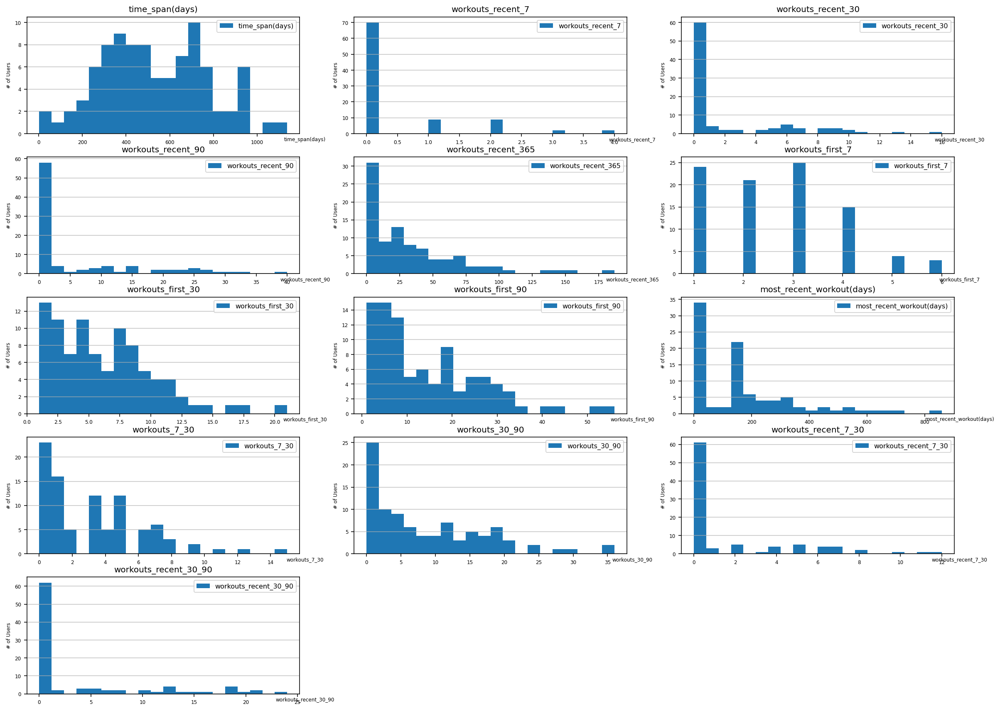

In [99]:
fig = plt.figure(figsize = (500,300))
count = 1
for feature in features:
    ax=fig.add_subplot(5,3,count)
    user_df[feature].plot.hist(bins = 20,figsize = (20,15))
    plt.grid(axis='y', alpha=0.75)  
    plt.xlabel(feature, fontsize=6)
    plt.ylabel('# of Users', fontsize=6)
    title = feature
    ax.set_title(title,fontsize=10)
    ax.xaxis.set_label_coords(1.02, -0.025)
    ax.tick_params(axis='both', which='major', labelsize=6,rotation = 0)
    plt.legend(loc='upper right',prop={'size': 8})
    count +=1

### 3.1.13 Churn Rate Visualization (fit Beta Distribution)

Visualize the tendency lines for # of workouts in the first 7 days, 7-30 days, 30-90 days. This could reflect the churning of our users after registration.

Use beta distribution to fit the tendency lines.

In [100]:
from scipy import stats
sns.set(font_scale=2)

In [103]:
feature_first = ['workouts_first_7', 'workouts_7_30', 'workouts_30_90']

C:\Users\Yunge Li\AppData\Roaming\Python\Python37\site-packages\scipy\stats\_continuous_distns.py:621: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\Yunge Li\AppData\Roaming\Python\Python37\site-packages\scipy\stats\_continuous_distns.py:621: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)


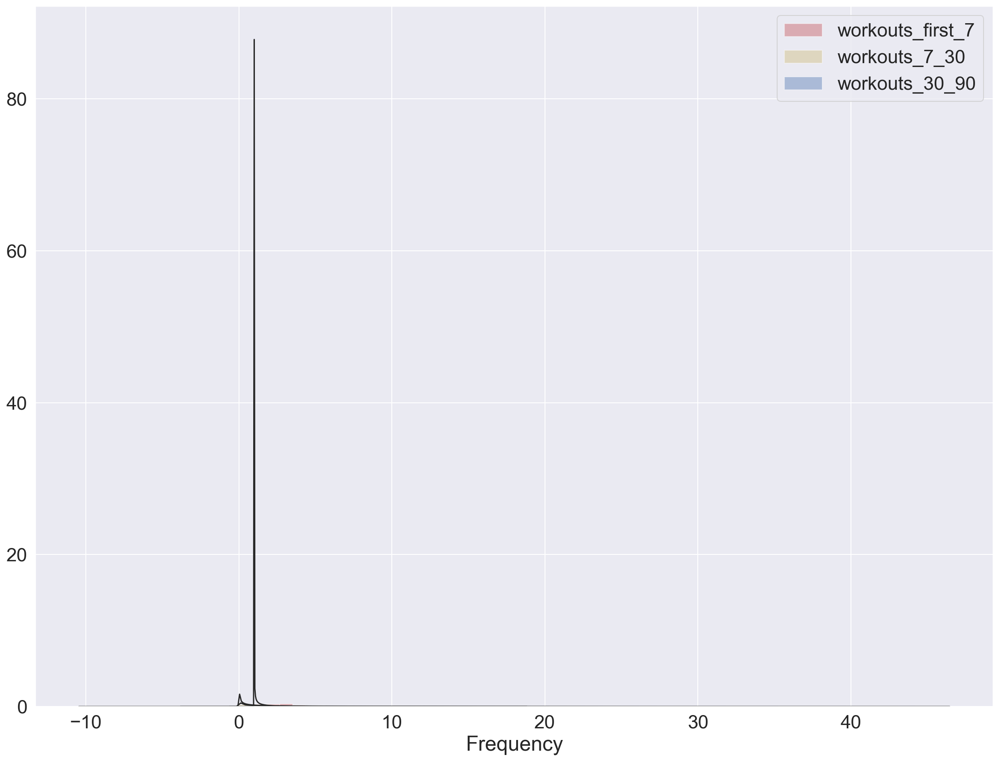

In [104]:
fig = plt.figure(figsize = (20,15))
colors = ['r','y','b']
count=0
plt.xlabel('Frequency')
for feature in feature_first:   
    sns.distplot(user_df[feature],color = colors[count],kde=False, fit=stats.beta,label = feature)
    count +=1
plt.xlabel('Frequency')
plt.legend()

### 3.1.14 Inter-Feature Correlation using Pearson Corr

In [106]:
user_df_corr = user_df[features].corr('pearson')
user_df_corr.style.background_gradient(cmap='coolwarm')

,time_span(days),workouts_recent_7,workouts_recent_30,workouts_recent_90,workouts_recent_365,workouts_first_7,workouts_first_30,workouts_first_90,most_recent_workout(days),workouts_7_30,workouts_30_90,workouts_recent_7_30,workouts_recent_30_90
time_span(days),1.000000,0.031482,-0.001372,0.054560,0.090208,-0.045808,-0.014298,0.013411,0.238126,0.000905,0.025446,-0.011567,0.082064
workouts_recent_7,0.031482,1.000000,0.833079,0.807011,0.626180,0.166808,0.214104,0.270196,-0.444909,0.205127,0.276539,0.724685,0.739727
workouts_recent_30,-0.001372,0.833079,1.000000,0.923553,0.771528,0.294864,0.303793,0.366429,-0.536673,0.266550,0.368713,0.984887,0.820656
workouts_recent_90,0.054560,0.807011,0.923553,1.000000,0.801292,0.265795,0.289365,0.341460,-0.545862,0.260236,0.340639,0.897817,0.977043
workouts_recent_365,0.090208,0.626180,0.771528,0.801292,1.000000,0.428392,0.552789,0.625305,-0.564986,0.530575,0.613039,0.765055,0.765401
workouts_first_7,-0.045808,0.166808,0.294864,0.265795,0.428392,1.000000,0.767685,0.710849,-0.278754,0.566214,0.631413,0.315092,0.232255
workouts_first_30,-0.014298,0.214104,0.303793,0.289365,0.552789,0.767685,1.000000,0.891244,-0.255876,0.962881,0.774017,0.311407,0.262417
workouts_first_90,0.013411,0.270196,0.366429,0.341460,0.625305,0.710849,0.891244,1.000000,-0.266643,0.846935,0.976994,0.371871,0.305248
most_recent_workout(days),0.238126,-0.444909,-0.536673,-0.545862,-0.564986,-0.278754,-0.255876,-0.266643,1.000000,-0.211703,-0.251935,-0.529246,-0.515253
workouts_7_30,0.000905,0.205127,0.266550,0.260236,0.530575,0.566214,0.962881,0.846935,-0.211703,1.000000,0.729613,0.267823,0.239702


In [107]:
user_df_corr[user_df_corr >= 0.6].style.applymap(lambda x: 'color: red' if pd.notnull(x) else "")

,time_span(days),workouts_recent_7,workouts_recent_30,workouts_recent_90,workouts_recent_365,workouts_first_7,workouts_first_30,workouts_first_90,most_recent_workout(days),workouts_7_30,workouts_30_90,workouts_recent_7_30,workouts_recent_30_90
time_span(days),1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
workouts_recent_7,nan,1.000000,0.833079,0.807011,0.626180,nan,nan,nan,nan,nan,nan,0.724685,0.739727
workouts_recent_30,nan,0.833079,1.000000,0.923553,0.771528,nan,nan,nan,nan,nan,nan,0.984887,0.820656
workouts_recent_90,nan,0.807011,0.923553,1.000000,0.801292,nan,nan,nan,nan,nan,nan,0.897817,0.977043
workouts_recent_365,nan,0.626180,0.771528,0.801292,1.000000,nan,nan,0.625305,nan,nan,0.613039,0.765055,0.765401
workouts_first_7,nan,nan,nan,nan,nan,1.000000,0.767685,0.710849,nan,nan,0.631413,nan,nan
workouts_first_30,nan,nan,nan,nan,nan,0.767685,1.000000,0.891244,nan,0.962881,0.774017,nan,nan
workouts_first_90,nan,nan,nan,nan,0.625305,0.710849,0.891244,1.000000,nan,0.846935,0.976994,nan,nan
most_recent_workout(days),nan,nan,nan,nan,nan,nan,nan,nan,1.000000,nan,nan,nan,nan
workouts_7_30,nan,nan,nan,nan,nan,nan,0.962881,0.846935,nan,1.000000,0.729613,nan,nan


## 3.2 Users' Preference on Exercise

### 3.2.1 Popularity of Exercises

We use three dimensions to measure the popularity of each exercise:
 
- Number of sets completed in total
- Number of workouts which include this exercise
- Number of users who has completed this exercise

#### Sets

In [121]:
exer_counts = data_df['exerciseName'].value_counts()

In [122]:
plt.rcParams['font.size'] = 14

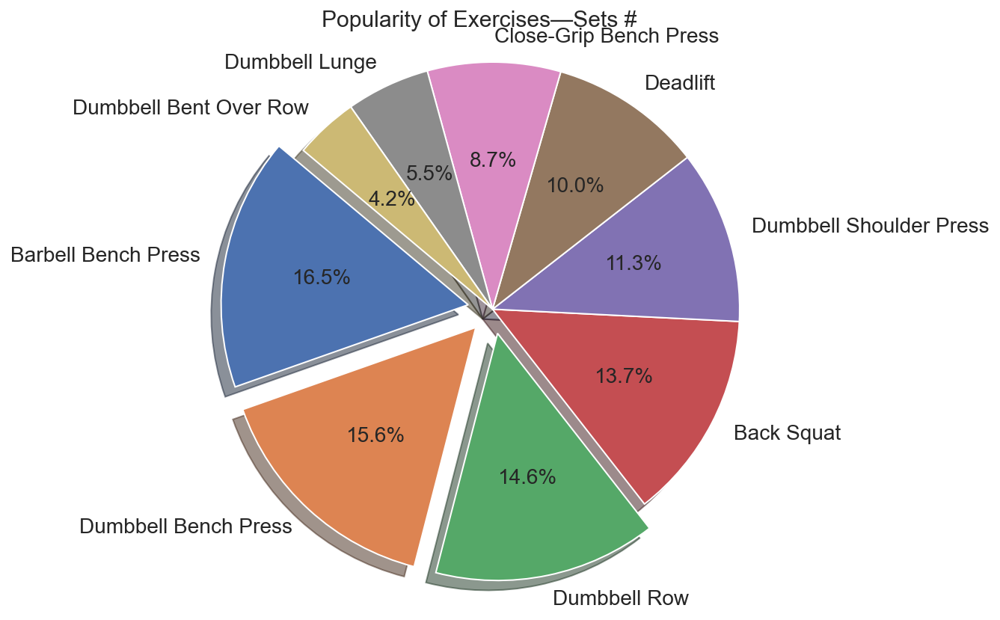

In [123]:
labels = exer_counts.index
values = exer_counts.values
explode = (0.1, 0.1, 0.1, 0,0,0,0,0,0)
fig = plt.figure(figsize = (8,6))
plt.pie(exer_counts, explode=explode, labels=labels, autopct='%1.1f%%', shadow=True, startangle=140,textprops={'fontsize': 14})
plt.title('Popularity of Exercises—Sets #',fontsize = 15)
plt.axis('equal')
plt.tight_layout()
plt.show()

#### Workout

In [124]:
exer_workout_counts = data_df[['workoutId','exerciseName']].groupby(['exerciseName']).workoutId.nunique()
exer_workout_counts = pd.DataFrame(exer_workout_counts)
exer_workout_counts.columns = ['count']
exer_workout_counts = exer_workout_counts.sort_values(by = 'count',ascending = False)
exer_workout_counts

,count
exerciseName,
Dumbbell Bench Press,1038
Barbell Bench Press,1019
Dumbbell Row,1012
Back Squat,860
Dumbbell Shoulder Press,802
Deadlift,644
Close-Grip Bench Press,584
Dumbbell Lunge,407
Dumbbell Bent Over Row,316


C:\Users\Yunge Li\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Non-1D inputs to pie() are currently squeeze()d, but this behavior is deprecated since 3.1 and will be removed in 3.3; pass a 1D array instead.
  """


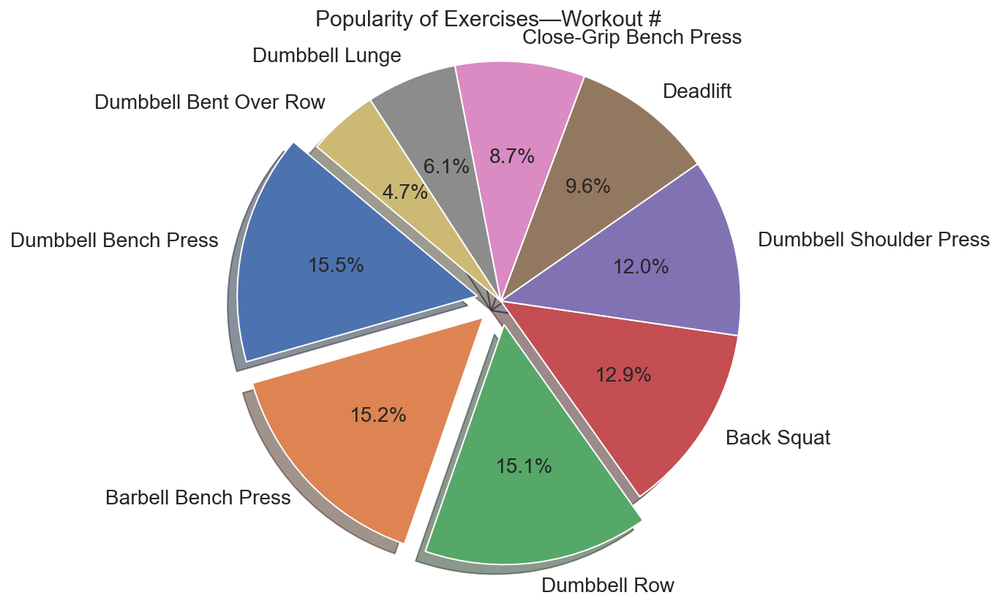

In [125]:
labels = exer_workout_counts.index
values = exer_workout_counts.values
explode = (0.1, 0.1, 0.1, 0,0,0,0,0,0)
fig = plt.figure(figsize = (8,6))
plt.pie(exer_workout_counts, explode=explode, labels=labels, autopct='%1.1f%%', shadow=True, startangle=140,textprops={'fontsize': 14})
plt.title('Popularity of Exercises—Workout #',fontsize = 15)
plt.axis('equal')
plt.tight_layout()
plt.show()

#### User

In [126]:
exer_user_counts = data_df[['fake_user_id','exerciseName']].groupby(['exerciseName']).fake_user_id.nunique()
exer_user_counts = pd.DataFrame(exer_user_counts)
exer_user_counts.columns = ['count']
exer_user_counts = exer_user_counts.sort_values(by = 'count',ascending = False)
exer_user_counts

,count
exerciseName,
Dumbbell Shoulder Press,83
Dumbbell Bench Press,81
Dumbbell Row,80
Dumbbell Lunge,76
Barbell Bench Press,72
Dumbbell Bent Over Row,72
Back Squat,64
Deadlift,64
Close-Grip Bench Press,61


C:\Users\Yunge Li\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Non-1D inputs to pie() are currently squeeze()d, but this behavior is deprecated since 3.1 and will be removed in 3.3; pass a 1D array instead.
  """


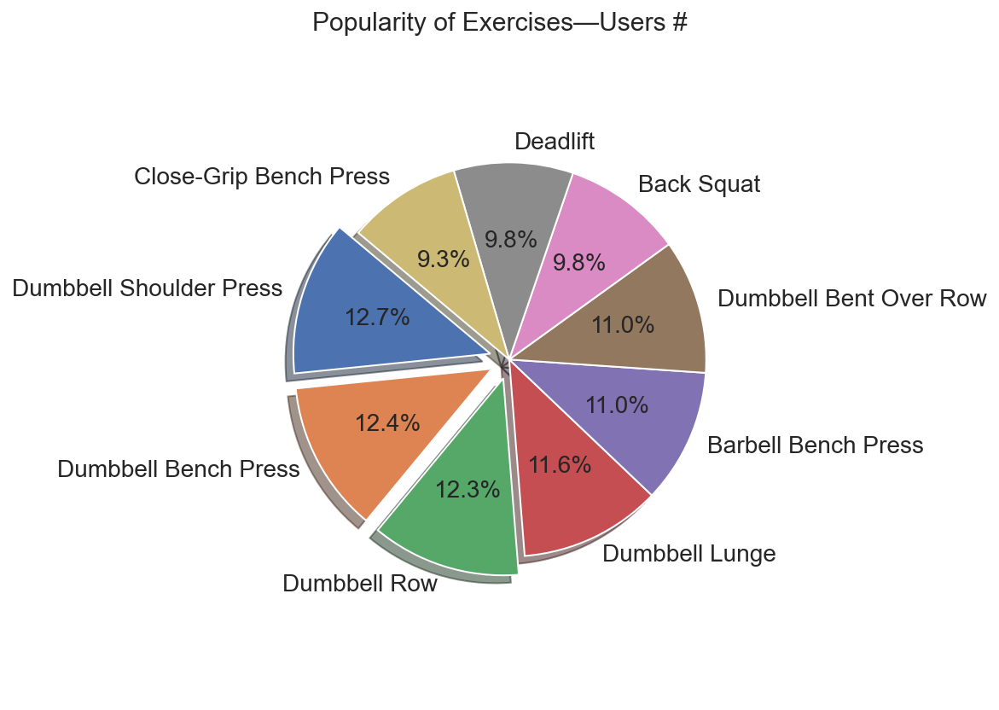

In [127]:
labels = exer_user_counts.index
values = exer_user_counts.values
explode = (0.1, 0.1, 0.1, 0,0,0,0,0,0)
fig = plt.figure(figsize = (8,6))
plt.pie(exer_user_counts, explode=explode, labels=labels, autopct='%1.1f%%', shadow=True, startangle=140,textprops={'fontsize': 14})
plt.title('Popularity of Exercises—Users #',fontsize = 15)
plt.axis('equal')
plt.tight_layout()
plt.show()

### 3.2.2 Exercise pattern in the first 7 days after registration

Learn about the most popular exercises in the first 7 days after the first workout. This could help with the recommendation for new users, which is the most important user segments for our business improvement.


Here, we use the number of users who completed the exercise in the first 7 days to measure popularity. 

####  Popularity of Exercises in 7 Days after the First Workout

In [108]:
def exer_counts_first(interval):
    workouts =  data_df[[(data_df.loc[index,'Date'] - user_df.loc[data_df.loc[index,'fake_user_id'],'first_workout_date']).days <= interval for index in data_df.index]]
    exer_counts = workouts[['fake_user_id','exerciseName']].groupby(['exerciseName']).fake_user_id.nunique()
    exer_counts = pd.DataFrame(exer_counts)
    exer_counts.columns = ['count']
    exer_counts = exer_counts.sort_values(by = 'count',ascending = False)
    return workouts,exer_counts

In [109]:
workouts_7,exer_counts_7 = exer_counts_first(7)
exer_counts_7

,count
exerciseName,
Dumbbell Row,59
Dumbbell Bench Press,49
Barbell Bench Press,43
Dumbbell Lunge,39
Back Squat,37
Deadlift,34
Dumbbell Shoulder Press,28
Close-Grip Bench Press,22
Dumbbell Bent Over Row,20


C:\Users\Yunge Li\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Non-1D inputs to pie() are currently squeeze()d, but this behavior is deprecated since 3.1 and will be removed in 3.3; pass a 1D array instead.
  """


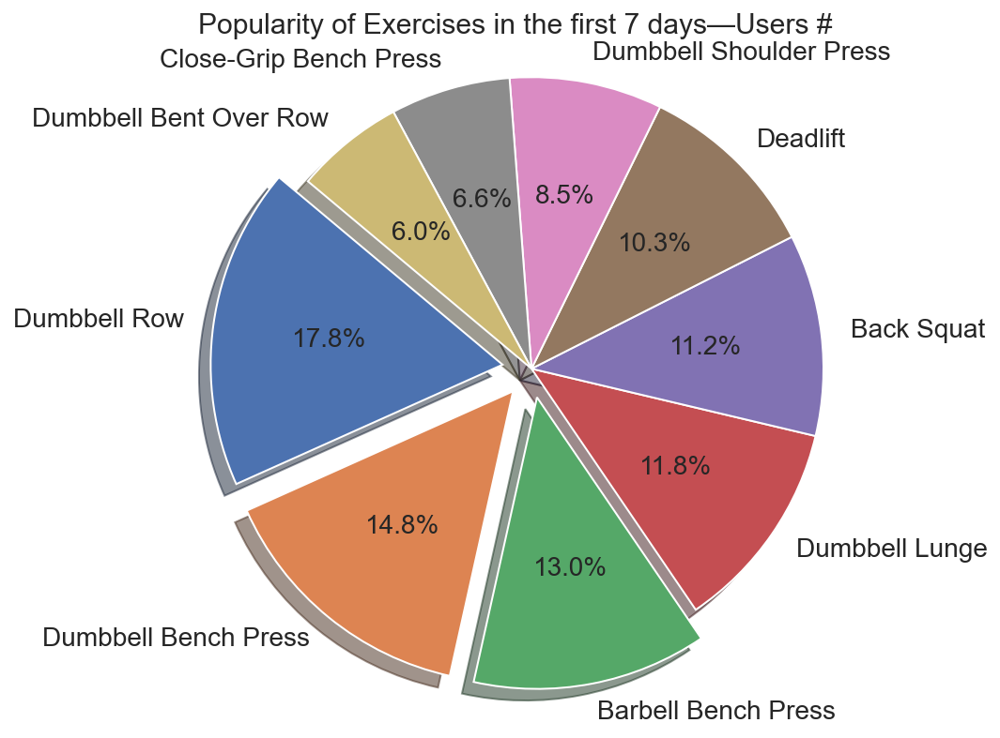

In [110]:
labels = exer_counts_7.index
values = exer_counts_7.values
explode = (0.1, 0.1, 0.1, 0,0,0,0,0,0)
fig = plt.figure(figsize = (8,6))
plt.pie(exer_counts_7, explode=explode, labels=labels, autopct='%1.1f%%', shadow=True, startangle=140,textprops={'fontsize': 14})
plt.title('Popularity of Exercises in the first 7 days—Users #',fontsize = 15)
plt.axis('equal')
plt.tight_layout()
plt.show()

#### Reps distribution for each exercises

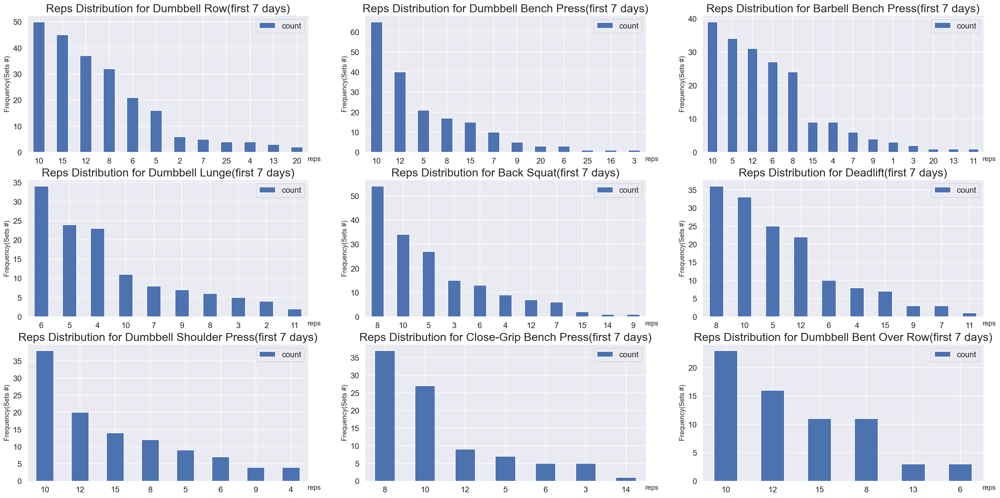

In [131]:
fig = plt.figure(figsize = (120,200))
count = 1
for exercise in list(exer_counts_7.index):
    ax = fig.add_subplot(3, 3, count)
    count_series = workouts_7[[(i == exercise) for i in workouts_7['exerciseName']]]['reps'].value_counts()
    count_df = pd.DataFrame(count_series)
    count_df.columns = ['count']
    count_df['count'].plot(kind = 'bar',figsize = (30,15))
    plt.xlabel('reps', fontsize=12)
    plt.ylabel('Frequency(Sets #)', fontsize=12)
    title = "Reps Distribution for " + exercise + "(first 7 days)"
    ax.set_title(title,fontsize=20)
    ax.xaxis.set_label_coords(1.02, -0.025)
    ax.tick_params(axis='both', which='major', labelsize=14,rotation = 0)
    plt.legend(loc='upper right',prop={'size': 14})
    count +=1

#### Weights distribution for each exercises 

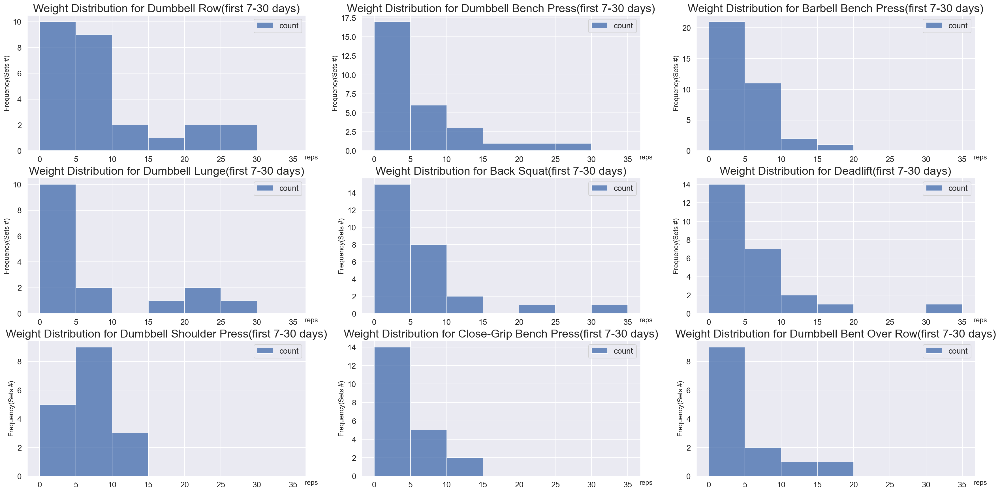

In [132]:
fig = plt.figure(figsize = (120,200))
count = 1
for exercise in list(exer_counts_7.index):
    ax = fig.add_subplot(3, 3, count)
    count_series = workouts_7[[(i == exercise) for i in workouts_7['exerciseName']]]['weight'].value_counts()
    count_df = pd.DataFrame(count_series)
    count_df.columns = ['count']
    scope = int((count_df.index.max()-count_df.index.min())/2.5)
    count_df['count'].plot.hist(bins = range(0,40,5),figsize = (30,15),color = 'b',alpha = 0.8)
    plt.xlabel('reps', fontsize=12)
    plt.ylabel('Frequency(Sets #)', fontsize=12)
    title = "Weight Distribution for " + exercise + "(first 7-30 days)"
    ax.set_title(title,fontsize=20)
    ax.xaxis.set_label_coords(1.02, -0.025)
    ax.tick_params(axis='both', which='major', labelsize=14,rotation = 0)
    plt.legend(loc='upper right',prop={'size': 14})
    count +=1

#### Number of sets per workout for each exercises 

In [112]:
workouts_7_exer_set = workouts_7[['fake_user_id','exerciseName','singleSetId']].groupby(['fake_user_id','exerciseName']).singleSetId.nunique()
workouts_7_exer_set = pd.DataFrame(workouts_7_exer_set)
workouts_7_exer_set.columns = ['sets']
workouts_7_exer_set

sets
fake_user_id exerciseName                 
fake_id_878  Back Squat                  5
             Barbell Bench Press         4
             Deadlift                    9
             Dumbbell Bench Press        3
fake_id_879  Back Squat                  4
             Barbell Bench Press         3
             Deadlift                    4
             Dumbbell Bench Press        4
             Dumbbell Row                4
fake_id_880  Back Squat                  3
             Barbell Bench Press         4
             Deadlift                    3
             Dumbbell Bench Press        5
             Dumbbell Lunge              4
             Dumbbell Row                5
fake_id_881  Back Squat                  4
             Barbell Bench Press         4
             Deadlift                    8
             Dumbbell Bench Press        4
             Dumbbell Lunge              3
             Dumbbell Row                4
fake_id_882  Back Squat                  8
             Barbell Bench Press         8
             Close-Grip Bench Press      8
             Dumbbell Row                7
fake_id_883  Back Squat                  3
             Close-Grip Bench Press      4
             Dumbbell Bench Press        5
             Dumbbell Lunge              3
             Dumbbell Row                5
fake_id_884  Back Squat                  4
             Dumbbell Row                4
fake_id_885  Back Squat                  9
             Dumbbell Bent Over Row      3
             Dumbbell Row                5
fake_id_886  Back Squat                  4
             Barbell Bench Press         4
             Close-Grip Bench Press      4
             Deadlift                    5
             Dumbbell Bench Press        3
fake_id_887  Barbell Bench Press         7
             Deadlift                    3
             Dumbbell Bench Press        6
fake_id_888  Back Squat                  3
             Barbell Bench Press         3
             Close-Grip Bench Press      3
             Deadlift                    3
             Dumbbell Bench Press        3
             Dumbbell Lunge              3
             Dumbbell Row                3
             Dumbbell Shoulder Press     4
fake_id_889  Dumbbell Bench Press        5
             Dumbbell Lunge              4
             Dumbbell Shoulder Press     4
fake_id_890  Back Squat                  5
             Barbell Bench Press         4
             Close-Grip Bench Press      4
             Deadlift                    5
             Dumbbell Row                6
             Dumbbell Shoulder Press     4
fake_id_891  Dumbbell Row                3
fake_id_892  Back Squat                  3
             Barbell Bench Press         3
             Close-Grip Bench Press      4
             Deadlift                    8
             Dumbbell Bench Press        4
             Dumbbell Lunge              3
             Dumbbell Row                5
             Dumbbell Shoulder Press     4
fake_id_893  Back Squat                  4
             Deadlift                    3
             Dumbbell Bench Press        5
             Dumbbell Row                3
fake_id_894  Dumbbell Bench Press        4
fake_id_895  Barbell Bench Press         3
             Close-Grip Bench Press      5
             Deadlift                    4
             Dumbbell Bench Press        3
             Dumbbell Lunge              2
             Dumbbell Row                4
             Dumbbell Shoulder Press     5
fake_id_896  Back Squat                  3
             Barbell Bench Press         4
             Deadlift                    5
             Dumbbell Bench Press        2
             Dumbbell Lunge              4
             Dumbbell Row                5
fake_id_897  Barbell Bench Press         3
             Deadlift                    5
             Dumbbell Bench Press        3
fake_id_898  Dumbbell Row                3
             Dumbbell Shoulder Press   

In [113]:
workouts_7_exer_freq = workouts_7[['fake_user_id','exerciseName','workoutId']].groupby(['fake_user_id','exerciseName']).workoutId.nunique()
workouts_7_exer_freq = pd.DataFrame(workouts_7_exer_freq)
workouts_7_exer_freq.columns = ['freq']
workouts_7_exer_freq

freq
fake_user_id exerciseName                 
fake_id_878  Back Squat                  1
             Barbell Bench Press         1
             Deadlift                    2
             Dumbbell Bench Press        1
fake_id_879  Back Squat                  1
             Barbell Bench Press         1
             Deadlift                    1
             Dumbbell Bench Press        1
             Dumbbell Row                1
fake_id_880  Back Squat                  1
             Barbell Bench Press         1
             Deadlift                    1
             Dumbbell Bench Press        1
             Dumbbell Lunge              1
             Dumbbell Row                1
fake_id_881  Back Squat                  1
             Barbell Bench Press         1
             Deadlift                    2
             Dumbbell Bench Press        1
             Dumbbell Lunge              1
             Dumbbell Row                1
fake_id_882  Back Squat                  2
             Barbell Bench Press         2
             Close-Grip Bench Press      2
             Dumbbell Row                2
fake_id_883  Back Squat                  1
             Close-Grip Bench Press      1
             Dumbbell Bench Press        1
             Dumbbell Lunge              1
             Dumbbell Row                1
fake_id_884  Back Squat                  1
             Dumbbell Row                1
fake_id_885  Back Squat                  2
             Dumbbell Bent Over Row      1
             Dumbbell Row                1
fake_id_886  Back Squat                  1
             Barbell Bench Press         1
             Close-Grip Bench Press      1
             Deadlift                    1
             Dumbbell Bench Press        1
fake_id_887  Barbell Bench Press         1
             Deadlift                    1
             Dumbbell Bench Press        1
fake_id_888  Back Squat                  1
             Barbell Bench Press         1
             Close-Grip Bench Press      1
             Deadlift                    1
             Dumbbell Bench Press        1
             Dumbbell Lunge              1
             Dumbbell Row                1
             Dumbbell Shoulder Press     1
fake_id_889  Dumbbell Bench Press        1
             Dumbbell Lunge              1
             Dumbbell Shoulder Press     1
fake_id_890  Back Squat                  1
             Barbell Bench Press         1
             Close-Grip Bench Press      1
             Deadlift                    1
             Dumbbell Row                1
             Dumbbell Shoulder Press     1
fake_id_891  Dumbbell Row                1
fake_id_892  Back Squat                  1
             Barbell Bench Press         1
             Close-Grip Bench Press      1
             Deadlift                    2
             Dumbbell Bench Press        1
             Dumbbell Lunge              1
             Dumbbell Row                1
             Dumbbell Shoulder Press     1
fake_id_893  Back Squat                  1
             Deadlift                    1
             Dumbbell Bench Press        1
             Dumbbell Row                1
fake_id_894  Dumbbell Bench Press        1
fake_id_895  Barbell Bench Press         1
             Close-Grip Bench Press      1
             Deadlift                    1
             Dumbbell Bench Press        1
             Dumbbell Lunge              1
             Dumbbell Row                1
             Dumbbell Shoulder Press     1
fake_id_896  Back Squat                  1
             Barbell Bench Press         1
             Deadlift                    1
             Dumbbell Bench Press        1
             Dumbbell Lunge              1
             Dumbbell Row                1
fake_id_897  Barbell Bench Press         1
             Deadlift                    1
             Dumbbell Bench Press        1
fake_id_898  Dumbbell Row                1
             Dumbbell Shoulder Press   

In [114]:
workouts_7_exer_set_freq = pd.merge(workouts_7_exer_set,workouts_7_exer_freq,right_on=('fake_user_id','exerciseName'),left_index=True,how='outer')
workouts_7_exer_set_freq

sets  freq
fake_user_id exerciseName                       
fake_id_878  Back Squat                  5     1
             Barbell Bench Press         4     1
             Deadlift                    9     2
             Dumbbell Bench Press        3     1
fake_id_879  Back Squat                  4     1
             Barbell Bench Press         3     1
             Deadlift                    4     1
             Dumbbell Bench Press        4     1
             Dumbbell Row                4     1
fake_id_880  Back Squat                  3     1
             Barbell Bench Press         4     1
             Deadlift                    3     1
             Dumbbell Bench Press        5     1
             Dumbbell Lunge              4     1
             Dumbbell Row                5     1
fake_id_881  Back Squat                  4     1
             Barbell Bench Press         4     1
             Deadlift                    8     2
             Dumbbell Bench Press        4     1
             Dumbbell Lunge              3     1
             Dumbbell Row                4     1
fake_id_882  Back Squat                  8     2
             Barbell Bench Press         8     2
             Close-Grip Bench Press      8     2
             Dumbbell Row                7     2
fake_id_883  Back Squat                  3     1
             Close-Grip Bench Press      4     1
             Dumbbell Bench Press        5     1
             Dumbbell Lunge              3     1
             Dumbbell Row                5     1
fake_id_884  Back Squat                  4     1
             Dumbbell Row                4     1
fake_id_885  Back Squat                  9     2
             Dumbbell Bent Over Row      3     1
             Dumbbell Row                5     1
fake_id_886  Back Squat                  4     1
             Barbell Bench Press         4     1
             Close-Grip Bench Press      4     1
             Deadlift                    5     1
             Dumbbell Bench Press        3     1
fake_id_887  Barbell Bench Press         7     1
             Deadlift                    3     1
             Dumbbell Bench Press        6     1
fake_id_888  Back Squat                  3     1
             Barbell Bench Press         3     1
             Close-Grip Bench Press      3     1
             Deadlift                    3     1
             Dumbbell Bench Press        3     1
             Dumbbell Lunge              3     1
             Dumbbell Row                3     1
             Dumbbell Shoulder Press     4     1
fake_id_889  Dumbbell Bench Press        5     1
             Dumbbell Lunge              4     1
             Dumbbell Shoulder Press     4     1
fake_id_890  Back Squat                  5     1
             Barbell Bench Press         4     1
             Close-Grip Bench Press      4     1
             Deadlift                    5     1
             Dumbbell Row                6     1
             Dumbbell Shoulder Press     4     1
fake_id_891  Dumbbell Row                3     1
fake_id_892  Back Squat                  3     1
             Barbell Bench Press         3     1
             Close-Grip Bench Press      4     1
             Deadlift                    8     2
             Dumbbell Bench Press        4     1
             Dumbbell Lunge              3     1
             Dumbbell Row                5     1
             Dumbbell Shoulder Press     4     1
fake_id_893  Back Squat                  4     1
             Deadlift                    3     1
             Dumbbell Bench Press        5     1
             Dumbbell Row                3     1
fake_id_894  Dumbbell Bench Press        4     1
fake_id_895  Barbell Bench Press         3     1
             Close-Grip Bench Press      5     1
             Deadlift                    4     1
             Dumbbell Bench Press        3     1
             Dumbbell Lunge              2     1
             Dumbbell Row                4     1
             Dumbbel

In [115]:
workouts_7_exer_set_freq['sets_per_workout'] = workouts_7_exer_set_freq['sets']/workouts_7_exer_set_freq['freq']
workouts_7_exer_set_freq

sets  freq  sets_per_workout
fake_user_id exerciseName                                         
fake_id_878  Back Squat                  5     1               5.0
             Barbell Bench Press         4     1               4.0
             Deadlift                    9     2               4.5
             Dumbbell Bench Press        3     1               3.0
fake_id_879  Back Squat                  4     1               4.0
             Barbell Bench Press         3     1               3.0
             Deadlift                    4     1               4.0
             Dumbbell Bench Press        4     1               4.0
             Dumbbell Row                4     1               4.0
fake_id_880  Back Squat                  3     1               3.0
             Barbell Bench Press         4     1               4.0
             Deadlift                    3     1               3.0
             Dumbbell Bench Press        5     1               5.0
             Dumbbell Lunge              4     1               4.0
             Dumbbell Row                5     1               5.0
fake_id_881  Back Squat                  4     1               4.0
             Barbell Bench Press         4     1               4.0
             Deadlift                    8     2               4.0
             Dumbbell Bench Press        4     1               4.0
             Dumbbell Lunge              3     1               3.0
             Dumbbell Row                4     1               4.0
fake_id_882  Back Squat                  8     2               4.0
             Barbell Bench Press         8     2               4.0
             Close-Grip Bench Press      8     2               4.0
             Dumbbell Row                7     2               3.5
fake_id_883  Back Squat                  3     1               3.0
             Close-Grip Bench Press      4     1               4.0
             Dumbbell Bench Press        5     1               5.0
             Dumbbell Lunge              3     1               3.0
             Dumbbell Row                5     1               5.0
fake_id_884  Back Squat                  4     1               4.0
             Dumbbell Row                4     1               4.0
fake_id_885  Back Squat                  9     2               4.5
             Dumbbell Bent Over Row      3     1               3.0
             Dumbbell Row                5     1               5.0
fake_id_886  Back Squat                  4     1               4.0
             Barbell Bench Press         4     1               4.0
             Close-Grip Bench Press      4     1               4.0
             Deadlift                    5     1               5.0
             Dumbbell Bench Press        3     1               3.0
fake_id_887  Barbell Bench Press         7     1               7.0
             Deadlift                    3     1               3.0
             Dumbbell Bench Press        6     1               6.0
fake_id_888  Back Squat                  3     1               3.0
             Barbell Bench Press         3     1               3.0
             Close-Grip Bench Press      3     1               3.0
             Deadlift                    3     1               3.0
             Dumbbell Bench Press        3     1               3.0
             Dumbbell Lunge              3     1               3.0
             Dumbbell Row                3     1               3.0
             Dumbbell Shoulder Press     4     1               4.0
fake_id_889  Dumbbell Bench Press        5     1               5.0
             Dumbbell Lunge              4     1               4.0
             Dumbbell Shoulder Press     4     1               4.0
fake_id_890  Back Squat                  5     1               5.0
             Barbell Bench Press         4     1               4.0
             Close-Grip Bench Press      4     1               4.0
             Deadlift                    5     1               5.0
             Dumbb

In [116]:
workouts_7_exer_set_freq=workouts_7_exer_set_freq.reset_index()
workouts_7_exer_set_freq

,fake_user_id,exerciseName,sets,freq,sets_per_workout
0,fake_id_878,Back Squat,5,1,5.0
1,fake_id_878,Barbell Bench Press,4,1,4.0
2,fake_id_878,Deadlift,9,2,4.5
3,fake_id_878,Dumbbell Bench Press,3,1,3.0
4,fake_id_879,Back Squat,4,1,4.0
5,fake_id_879,Barbell Bench Press,3,1,3.0
6,fake_id_879,Deadlift,4,1,4.0
7,fake_id_879,Dumbbell Bench Press,4,1,4.0
8,fake_id_879,Dumbbell Row,4,1,4.0
9,fake_id_880,Back Squat,3,1,3.0


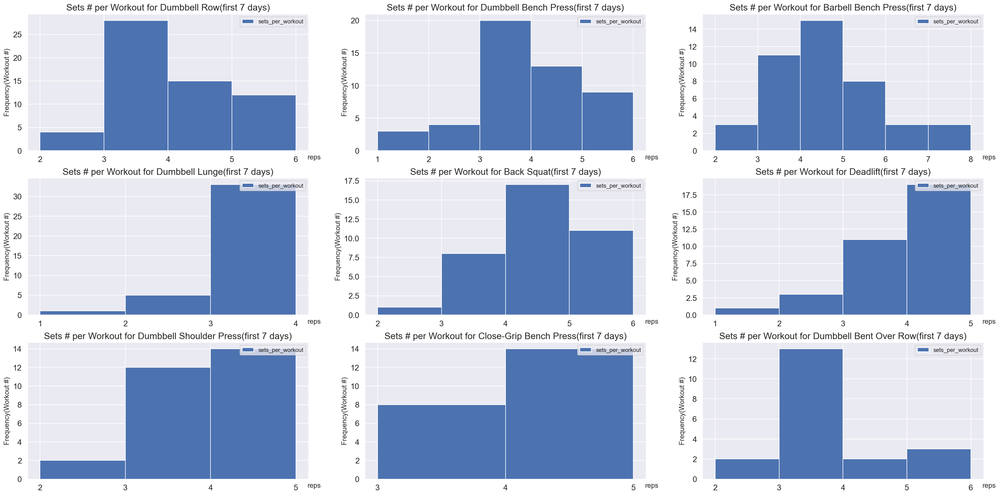

In [117]:
fig = plt.figure(figsize = (120,160))
count = 1
for exercise in list(exer_counts_7.index):
    ax = fig.add_subplot(3, 3, count) 
    count_df = workouts_7_exer_set_freq[workouts_7_exer_set_freq['exerciseName']==exercise]
    r = count_df['sets_per_workout'].max() - count_df['sets_per_workout'].min()
    count_df['sets_per_workout'].plot.hist(bins = int(r),figsize = (30,15))
    plt.xlabel('reps', fontsize=12)
    plt.ylabel('Frequency(Workout #)', fontsize=12)
    plt.xticks(np.arange(count_df['sets_per_workout'].min(), count_df['sets_per_workout'].max()+1, 1.0))
    ax.xaxis.set_label_coords(1.02, -0.025)
    ax.tick_params(axis='both', which='major', labelsize=14,rotation = 0)
    title = "Sets # per Workout for " + exercise + "(first 7 days)"   
    ax.set_title(title,fontsize=16)
    plt.legend(loc='upper right',prop={'size': 10})
    count +=1

####  Number of sets completed by each user for each exercise

In [118]:
user_exer_7 = pd.DataFrame(workouts_7['fake_user_id'].value_counts())
user_exer_7.columns = ['# of Recordings']
user_exer_7

,# of Recordings
fake_id_892,34
fake_id_899,32
fake_id_917,31
fake_id_882,31
fake_id_925,29
fake_id_890,28
fake_id_939,28
fake_id_907,27
fake_id_881,27
fake_id_910,27


In [119]:
for exercise in  list(exer_counts_7.index): 
    exer_df = workouts_7[workouts_7['exerciseName']==exercise]
    for id in user_exer_7.index:
        exer_df = workouts_7[workouts_7['exerciseName']==exercise]
        colname = exercise+str(7)
        user_exer_7.loc[id,colname] = exer_df[exer_df['fake_user_id']==id].shape[0]

In [120]:
user_exer_7.astype(int)
user_exer_7

,# of Recordings,Dumbbell Row7,Dumbbell Bench Press7,Barbell Bench Press7,Dumbbell Lunge7,Back Squat7,Deadlift7,Dumbbell Shoulder Press7,Close-Grip Bench Press7,Dumbbell Bent Over Row7
fake_id_892,34,5.0,4.0,3.0,3.0,3.0,8.0,4.0,4.0,0.0
fake_id_899,32,3.0,4.0,3.0,0.0,15.0,7.0,0.0,0.0,0.0
fake_id_917,31,7.0,3.0,8.0,3.0,5.0,0.0,5.0,0.0,0.0
fake_id_882,31,7.0,0.0,8.0,0.0,8.0,0.0,0.0,8.0,0.0
fake_id_925,29,4.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,0.0
fake_id_890,28,6.0,0.0,4.0,0.0,5.0,5.0,4.0,4.0,0.0
fake_id_939,28,3.0,5.0,6.0,3.0,4.0,4.0,0.0,3.0,0.0
fake_id_907,27,3.0,3.0,4.0,3.0,6.0,4.0,0.0,4.0,0.0
fake_id_881,27,4.0,4.0,4.0,3.0,4.0,8.0,0.0,0.0,0.0
fake_id_910,27,4.0,2.0,6.0,3.0,5.0,3.0,0.0,4.0,0.0


####  Correlation between Different Exercises

In [121]:
user_exer_7_corr = user_exer_7.corr('pearson')

In [122]:
user_exer_7_corr.style.background_gradient(cmap='coolwarm')

,# of Recordings,Dumbbell Row7,Dumbbell Bench Press7,Barbell Bench Press7,Dumbbell Lunge7,Back Squat7,Deadlift7,Dumbbell Shoulder Press7,Close-Grip Bench Press7,Dumbbell Bent Over Row7
# of Recordings,1.000000,0.488121,0.315542,0.554371,0.343939,0.654664,0.571983,0.253093,0.611853,-0.237257
Dumbbell Row7,0.488121,1.000000,-0.022032,0.051294,0.144211,0.285563,0.045385,0.173580,0.231139,-0.046920
Dumbbell Bench Press7,0.315542,-0.022032,1.000000,0.030445,0.195074,0.020124,0.157801,0.039639,-0.013170,-0.339775
Barbell Bench Press7,0.554371,0.051294,0.030445,1.000000,-0.060070,0.360189,0.259303,0.017849,0.347170,-0.242780
Dumbbell Lunge7,0.343939,0.144211,0.195074,-0.060070,1.000000,0.096019,0.111631,-0.029479,0.141008,-0.128746
Back Squat7,0.654664,0.285563,0.020124,0.360189,0.096019,1.000000,0.391902,-0.157938,0.312128,-0.196462
Deadlift7,0.571983,0.045385,0.157801,0.259303,0.111631,0.391902,1.000000,-0.068483,0.235256,-0.315856
Dumbbell Shoulder Press7,0.253093,0.173580,0.039639,0.017849,-0.029479,-0.157938,-0.068483,1.000000,0.180127,-0.053190
Close-Grip Bench Press7,0.611853,0.231139,-0.013170,0.347170,0.141008,0.312128,0.235256,0.180127,1.000000,-0.167235
Dumbbell Bent Over Row7,-0.237257,-0.046920,-0.339775,-0.242780,-0.128746,-0.196462,-0.315856,-0.053190,-0.167235,1.000000


In [123]:
user_exer_7_corr[user_exer_7_corr >= 0.6].style.applymap(lambda x: 'color: red' if pd.notnull(x) else "")

,# of Recordings,Dumbbell Row7,Dumbbell Bench Press7,Barbell Bench Press7,Dumbbell Lunge7,Back Squat7,Deadlift7,Dumbbell Shoulder Press7,Close-Grip Bench Press7,Dumbbell Bent Over Row7
# of Recordings,1.000000,nan,nan,nan,nan,0.654664,nan,nan,0.611853,nan
Dumbbell Row7,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan
Dumbbell Bench Press7,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,nan
Barbell Bench Press7,nan,nan,nan,1.000000,nan,nan,nan,nan,nan,nan
Dumbbell Lunge7,nan,nan,nan,nan,1.000000,nan,nan,nan,nan,nan
Back Squat7,0.654664,nan,nan,nan,nan,1.000000,nan,nan,nan,nan
Deadlift7,nan,nan,nan,nan,nan,nan,1.000000,nan,nan,nan
Dumbbell Shoulder Press7,nan,nan,nan,nan,nan,nan,nan,1.000000,nan,nan
Close-Grip Bench Press7,0.611853,nan,nan,nan,nan,nan,nan,nan,1.000000,nan
Dumbbell Bent Over Row7,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000


### 3.2.3 Exercise pattern for users in 7-30 days after  registration

#### Popularity of Exercises in 7-30 Days after the First Workout

In [145]:
workouts_7_30,exer_counts_7_30 = exer_counts_first(30)
exer_counts_7_30

,count
exerciseName,
Dumbbell Bench Press,68
Dumbbell Row,68
Dumbbell Shoulder Press,58
Barbell Bench Press,54
Dumbbell Lunge,48
Back Squat,47
Deadlift,46
Close-Grip Bench Press,40
Dumbbell Bent Over Row,34


C:\Users\Yunge Li\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Non-1D inputs to pie() are currently squeeze()d, but this behavior is deprecated since 3.1 and will be removed in 3.3; pass a 1D array instead.
  """


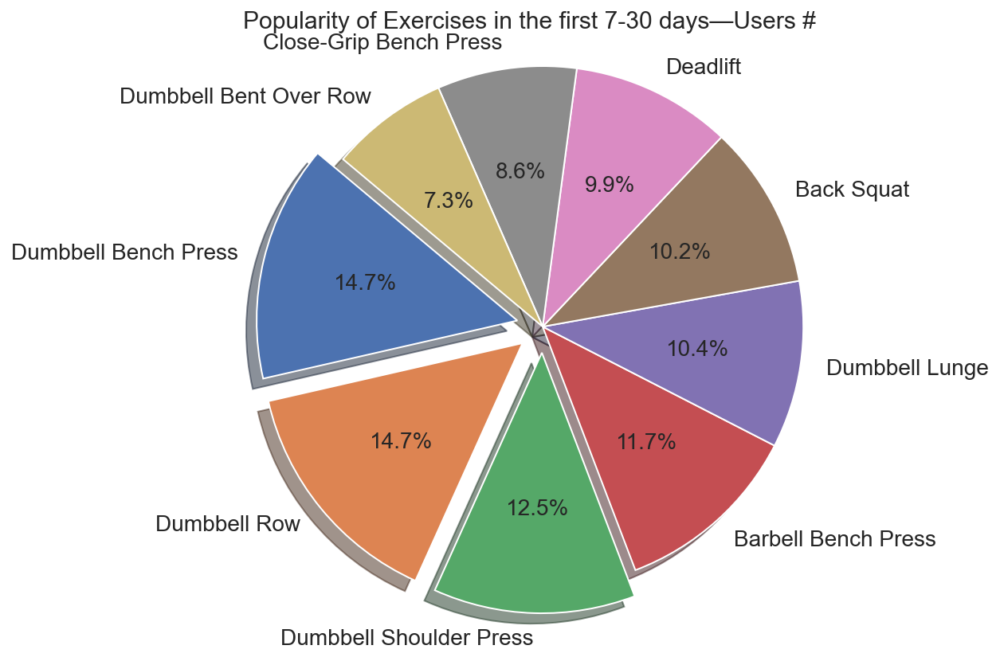

In [146]:
labels = exer_counts_7_30.index
values = exer_counts_7_30 .values
explode = (0.1, 0.1, 0.1, 0,0,0,0,0,0)
fig = plt.figure(figsize=(8,6))
plt.pie(exer_counts_7_30, explode=explode, labels=labels, autopct='%1.1f%%', shadow=True, startangle=140,textprops={'fontsize': 14})
plt.title('Popularity of Exercises in the first 7-30 days—Users #',fontsize = 15)
plt.axis('equal')
plt.tight_layout()
plt.show()

#### Reps Distribution for Each Exercise

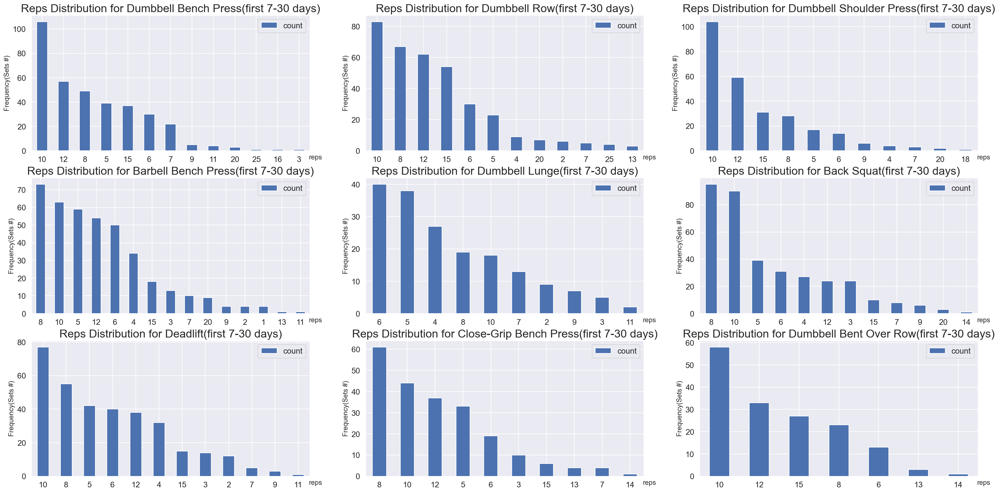

In [147]:
fig = plt.figure(figsize = (120,200))
count = 1
for exercise in list(exer_counts_7_30.index):
    ax = fig.add_subplot(3, 3, count)
    count_series = workouts_7_30[[(i == exercise) for i in workouts_7_30['exerciseName']]]['reps'].value_counts()
    count_df = pd.DataFrame(count_series)
    count_df.columns = ['count']
    count_df['count'].plot(kind = 'bar',figsize = (30,15))
    plt.xlabel('reps', fontsize=12)
    plt.ylabel('Frequency(Sets #)', fontsize=12)
    title = "Reps Distribution for " + exercise + "(first 7-30 days)"
    ax.set_title(title,fontsize=20)
    ax.xaxis.set_label_coords(1.02, -0.025)
    ax.tick_params(axis='both', which='major', labelsize=14,rotation = 0)
    plt.legend(loc='upper right',prop={'size': 14})
    count +=1

#### Weights Distribution for Each Exercise

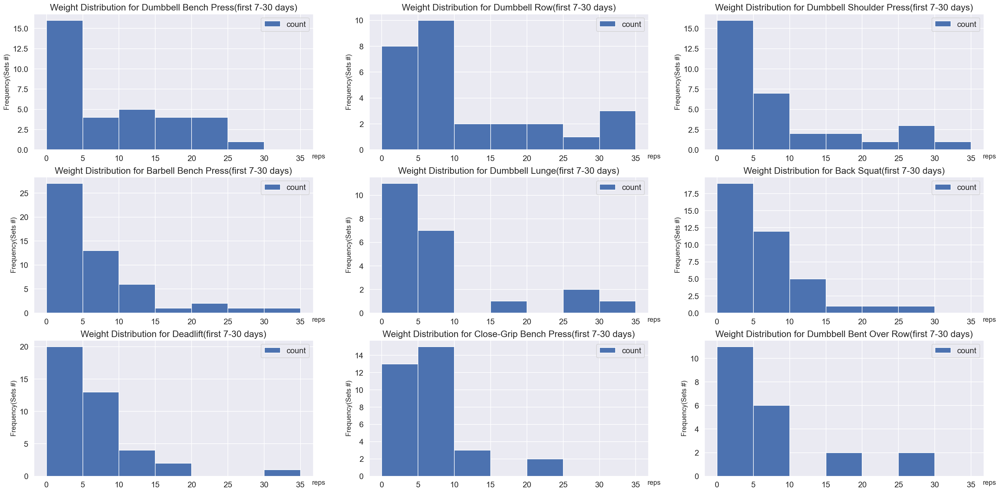

In [148]:
fig = plt.figure(figsize = (120,200))
count = 1
for exercise in list(exer_counts_7_30.index):
    ax = fig.add_subplot(3, 3, count)
    count_series = workouts_7_30[[(i == exercise) for i in workouts_7_30['exerciseName']]]['weight'].value_counts()
    count_df = pd.DataFrame(count_series)
    count_df.columns = ['count']
    scope = int(float(count_df.index.max())- float(count_df.index.min())/2.5)
    count_df['count'].plot.hist(bins = [0,5,10,15,20,25,30,35] ,figsize = (30,15))
    plt.xlabel('reps', fontsize=12)
    plt.ylabel('Frequency(Sets #)', fontsize=12)
    title = "Weight Distribution for " + exercise + "(first 7-30 days)"
    ax.set_title(title,fontsize=16)
    ax.xaxis.set_label_coords(1.02, -0.025)
    ax.tick_params(axis='both', which='major', labelsize=14,rotation = 0)    
    plt.legend(loc='upper right',prop={'size': 14})
    count +=1

#### Number of sets in each workout for each exercise

In [149]:
workouts_7_30_exer_set = workouts_7_30[['fake_user_id','exerciseName','singleSetId']].groupby(['fake_user_id','exerciseName']).singleSetId.nunique()
workouts_7_30_exer_set = pd.DataFrame(workouts_7_30_exer_set)
workouts_7_30_exer_set.columns = ['sets']
workouts_7_30_exer_set

sets
fake_user_id exerciseName                 
fake_id_878  Back Squat                 12
             Barbell Bench Press         9
             Close-Grip Bench Press      4
             Deadlift                   12
             Dumbbell Bench Press        3
             Dumbbell Bent Over Row      3
             Dumbbell Row                4
fake_id_879  Back Squat                 10
             Barbell Bench Press        11
             Deadlift                    4
             Dumbbell Bench Press        9
             Dumbbell Row                7
             Dumbbell Shoulder Press     4
fake_id_880  Back Squat                  3
             Barbell Bench Press         8
             Deadlift                    3
             Dumbbell Bench Press        5
             Dumbbell Bent Over Row      5
             Dumbbell Lunge              4
             Dumbbell Row                5
fake_id_881  Back Squat                  9
             Barbell Bench Press         8
             Close-Grip Bench Press      3
             Deadlift                   13
             Dumbbell Bench Press        9
             Dumbbell Lunge              5
             Dumbbell Row                4
fake_id_882  Back Squat                 18
             Barbell Bench Press        23
             Close-Grip Bench Press     12
             Deadlift                   22
             Dumbbell Bench Press        4
             Dumbbell Row               23
             Dumbbell Shoulder Press     7
fake_id_883  Back Squat                  6
             Barbell Bench Press         7
             Close-Grip Bench Press      4
             Deadlift                    5
             Dumbbell Bench Press        5
             Dumbbell Bent Over Row      5
             Dumbbell Lunge              3
             Dumbbell Row                5
fake_id_884  Back Squat                  4
             Dumbbell Row                4
             Dumbbell Shoulder Press     3
fake_id_885  Back Squat                 12
             Barbell Bench Press        13
             Close-Grip Bench Press      8
             Deadlift                    4
             Dumbbell Bent Over Row      3
             Dumbbell Row                5
             Dumbbell Shoulder Press     3
fake_id_886  Back Squat                  4
             Barbell Bench Press        12
             Close-Grip Bench Press      7
             Deadlift                   19
             Dumbbell Bench Press        3
             Dumbbell Bent Over Row      3
             Dumbbell Row                3
             Dumbbell Shoulder Press     7
fake_id_887  Barbell Bench Press         7
             Deadlift                    3
             Dumbbell Bench Press        6
fake_id_888  Back Squat                  9
             Barbell Bench Press         8
             Close-Grip Bench Press      3
             Deadlift                    7
             Dumbbell Bench Press       14
             Dumbbell Lunge              3
             Dumbbell Row                3
             Dumbbell Shoulder Press     9
fake_id_889  Dumbbell Bench Press       12
             Dumbbell Lunge              8
             Dumbbell Row                9
             Dumbbell Shoulder Press    12
fake_id_890  Back Squat                 10
             Barbell Bench Press         4
             Close-Grip Bench Press      7
             Deadlift                    5
             Dumbbell Bench Press        3
             Dumbbell Bent Over Row      3
             Dumbbell Lunge              4
             Dumbbell Row                6
             Dumbbell Shoulder Press     4
fake_id_891  Dumbbell Row                3
             Dumbbell Shoulder Press     1
fake_id_892  Back Squat                  7
             Barbell Bench Press         6
             Close-Grip Bench Press      7
             Deadlift                   13
             Dumbbell Bench Press        9
             Dumbbell Lunge            

In [150]:
workouts_7_30_exer_freq = workouts_7_30[['fake_user_id','exerciseName','workoutId']].groupby(['fake_user_id','exerciseName']).workoutId.nunique()
workouts_7_30_exer_freq = pd.DataFrame(workouts_7_30_exer_freq)
workouts_7_30_exer_freq.columns = ['freq']
workouts_7_30_exer_freq

freq
fake_user_id exerciseName                 
fake_id_878  Back Squat                  3
             Barbell Bench Press         2
             Close-Grip Bench Press      1
             Deadlift                    3
             Dumbbell Bench Press        1
             Dumbbell Bent Over Row      1
             Dumbbell Row                1
fake_id_879  Back Squat                  3
             Barbell Bench Press         3
             Deadlift                    1
             Dumbbell Bench Press        2
             Dumbbell Row                2
             Dumbbell Shoulder Press     1
fake_id_880  Back Squat                  1
             Barbell Bench Press         2
             Deadlift                    1
             Dumbbell Bench Press        1
             Dumbbell Bent Over Row      1
             Dumbbell Lunge              1
             Dumbbell Row                1
fake_id_881  Back Squat                  2
             Barbell Bench Press         2
             Close-Grip Bench Press      1
             Deadlift                    3
             Dumbbell Bench Press        2
             Dumbbell Lunge              2
             Dumbbell Row                1
fake_id_882  Back Squat                  5
             Barbell Bench Press         5
             Close-Grip Bench Press      3
             Deadlift                    5
             Dumbbell Bench Press        1
             Dumbbell Row                6
             Dumbbell Shoulder Press     2
fake_id_883  Back Squat                  2
             Barbell Bench Press         3
             Close-Grip Bench Press      1
             Deadlift                    2
             Dumbbell Bench Press        1
             Dumbbell Bent Over Row      1
             Dumbbell Lunge              1
             Dumbbell Row                1
fake_id_884  Back Squat                  1
             Dumbbell Row                1
             Dumbbell Shoulder Press     1
fake_id_885  Back Squat                  3
             Barbell Bench Press         3
             Close-Grip Bench Press      2
             Deadlift                    1
             Dumbbell Bent Over Row      1
             Dumbbell Row                1
             Dumbbell Shoulder Press     1
fake_id_886  Back Squat                  1
             Barbell Bench Press         3
             Close-Grip Bench Press      2
             Deadlift                    4
             Dumbbell Bench Press        1
             Dumbbell Bent Over Row      1
             Dumbbell Row                1
             Dumbbell Shoulder Press     2
fake_id_887  Barbell Bench Press         1
             Deadlift                    1
             Dumbbell Bench Press        1
fake_id_888  Back Squat                  3
             Barbell Bench Press         2
             Close-Grip Bench Press      1
             Deadlift                    2
             Dumbbell Bench Press        4
             Dumbbell Lunge              1
             Dumbbell Row                1
             Dumbbell Shoulder Press     2
fake_id_889  Dumbbell Bench Press        3
             Dumbbell Lunge              2
             Dumbbell Row                3
             Dumbbell Shoulder Press     3
fake_id_890  Back Squat                  2
             Barbell Bench Press         1
             Close-Grip Bench Press      2
             Deadlift                    1
             Dumbbell Bench Press        1
             Dumbbell Bent Over Row      1
             Dumbbell Lunge              1
             Dumbbell Row                1
             Dumbbell Shoulder Press     1
fake_id_891  Dumbbell Row                1
             Dumbbell Shoulder Press     1
fake_id_892  Back Squat                  2
             Barbell Bench Press         2
             Close-Grip Bench Press      2
             Deadlift                    3
             Dumbbell Bench Press        3
             Dumbbell Lunge            

In [151]:
workouts_7_30_exer_set_freq = pd.merge(workouts_7_30_exer_set,workouts_7_30_exer_freq,right_on=('fake_user_id','exerciseName'),left_index=True,how='outer')
workouts_7_30_exer_set_freq

sets  freq
fake_user_id exerciseName                       
fake_id_878  Back Squat                 12     3
             Barbell Bench Press         9     2
             Close-Grip Bench Press      4     1
             Deadlift                   12     3
             Dumbbell Bench Press        3     1
             Dumbbell Bent Over Row      3     1
             Dumbbell Row                4     1
fake_id_879  Back Squat                 10     3
             Barbell Bench Press        11     3
             Deadlift                    4     1
             Dumbbell Bench Press        9     2
             Dumbbell Row                7     2
             Dumbbell Shoulder Press     4     1
fake_id_880  Back Squat                  3     1
             Barbell Bench Press         8     2
             Deadlift                    3     1
             Dumbbell Bench Press        5     1
             Dumbbell Bent Over Row      5     1
             Dumbbell Lunge              4     1
             Dumbbell Row                5     1
fake_id_881  Back Squat                  9     2
             Barbell Bench Press         8     2
             Close-Grip Bench Press      3     1
             Deadlift                   13     3
             Dumbbell Bench Press        9     2
             Dumbbell Lunge              5     2
             Dumbbell Row                4     1
fake_id_882  Back Squat                 18     5
             Barbell Bench Press        23     5
             Close-Grip Bench Press     12     3
             Deadlift                   22     5
             Dumbbell Bench Press        4     1
             Dumbbell Row               23     6
             Dumbbell Shoulder Press     7     2
fake_id_883  Back Squat                  6     2
             Barbell Bench Press         7     3
             Close-Grip Bench Press      4     1
             Deadlift                    5     2
             Dumbbell Bench Press        5     1
             Dumbbell Bent Over Row      5     1
             Dumbbell Lunge              3     1
             Dumbbell Row                5     1
fake_id_884  Back Squat                  4     1
             Dumbbell Row                4     1
             Dumbbell Shoulder Press     3     1
fake_id_885  Back Squat                 12     3
             Barbell Bench Press        13     3
             Close-Grip Bench Press      8     2
             Deadlift                    4     1
             Dumbbell Bent Over Row      3     1
             Dumbbell Row                5     1
             Dumbbell Shoulder Press     3     1
fake_id_886  Back Squat                  4     1
             Barbell Bench Press        12     3
             Close-Grip Bench Press      7     2
             Deadlift                   19     4
             Dumbbell Bench Press        3     1
             Dumbbell Bent Over Row      3     1
             Dumbbell Row                3     1
             Dumbbell Shoulder Press     7     2
fake_id_887  Barbell Bench Press         7     1
             Deadlift                    3     1
             Dumbbell Bench Press        6     1
fake_id_888  Back Squat                  9     3
             Barbell Bench Press         8     2
             Close-Grip Bench Press      3     1
             Deadlift                    7     2
             Dumbbell Bench Press       14     4
             Dumbbell Lunge              3     1
             Dumbbell Row                3     1
             Dumbbell Shoulder Press     9     2
fake_id_889  Dumbbell Bench Press       12     3
             Dumbbell Lunge              8     2
             Dumbbell Row                9     3
             Dumbbell Shoulder Press    12     3
fake_id_890  Back Squat                 10     2
             Barbell Bench Press         4     1
             Close-Grip Bench Press      7     2
             Deadlift                    5     1
             Dumbbell Bench Press        3     1
             Dumbbel

In [152]:
workouts_7_30_exer_set_freq['sets_per_workout'] = round(workouts_7_30_exer_set_freq['sets']/workouts_7_30_exer_set_freq['freq'],1)
workouts_7_30_exer_set_freq

sets  freq  sets_per_workout
fake_user_id exerciseName                                         
fake_id_878  Back Squat                 12     3               4.0
             Barbell Bench Press         9     2               4.5
             Close-Grip Bench Press      4     1               4.0
             Deadlift                   12     3               4.0
             Dumbbell Bench Press        3     1               3.0
             Dumbbell Bent Over Row      3     1               3.0
             Dumbbell Row                4     1               4.0
fake_id_879  Back Squat                 10     3               3.3
             Barbell Bench Press        11     3               3.7
             Deadlift                    4     1               4.0
             Dumbbell Bench Press        9     2               4.5
             Dumbbell Row                7     2               3.5
             Dumbbell Shoulder Press     4     1               4.0
fake_id_880  Back Squat                  3     1               3.0
             Barbell Bench Press         8     2               4.0
             Deadlift                    3     1               3.0
             Dumbbell Bench Press        5     1               5.0
             Dumbbell Bent Over Row      5     1               5.0
             Dumbbell Lunge              4     1               4.0
             Dumbbell Row                5     1               5.0
fake_id_881  Back Squat                  9     2               4.5
             Barbell Bench Press         8     2               4.0
             Close-Grip Bench Press      3     1               3.0
             Deadlift                   13     3               4.3
             Dumbbell Bench Press        9     2               4.5
             Dumbbell Lunge              5     2               2.5
             Dumbbell Row                4     1               4.0
fake_id_882  Back Squat                 18     5               3.6
             Barbell Bench Press        23     5               4.6
             Close-Grip Bench Press     12     3               4.0
             Deadlift                   22     5               4.4
             Dumbbell Bench Press        4     1               4.0
             Dumbbell Row               23     6               3.8
             Dumbbell Shoulder Press     7     2               3.5
fake_id_883  Back Squat                  6     2               3.0
             Barbell Bench Press         7     3               2.3
             Close-Grip Bench Press      4     1               4.0
             Deadlift                    5     2               2.5
             Dumbbell Bench Press        5     1               5.0
             Dumbbell Bent Over Row      5     1               5.0
             Dumbbell Lunge              3     1               3.0
             Dumbbell Row                5     1               5.0
fake_id_884  Back Squat                  4     1               4.0
             Dumbbell Row                4     1               4.0
             Dumbbell Shoulder Press     3     1               3.0
fake_id_885  Back Squat                 12     3               4.0
             Barbell Bench Press        13     3               4.3
             Close-Grip Bench Press      8     2               4.0
             Deadlift                    4     1               4.0
             Dumbbell Bent Over Row      3     1               3.0
             Dumbbell Row                5     1               5.0
             Dumbbell Shoulder Press     3     1               3.0
fake_id_886  Back Squat                  4     1               4.0
             Barbell Bench Press        12     3               4.0
             Close-Grip Bench Press      7     2               3.5
             Deadlift                   19     4               4.8
             Dumbbell Bench Press        3     1               3.0
             Dumbbell Bent Over Row      3     1               3.0
             Dumbb

In [153]:
workouts_7_30_exer_set_freq=workouts_7_30_exer_set_freq.reset_index()
workouts_7_30_exer_set_freq

,fake_user_id,exerciseName,sets,freq,sets_per_workout
0,fake_id_878,Back Squat,12,3,4.0
1,fake_id_878,Barbell Bench Press,9,2,4.5
2,fake_id_878,Close-Grip Bench Press,4,1,4.0
3,fake_id_878,Deadlift,12,3,4.0
4,fake_id_878,Dumbbell Bench Press,3,1,3.0
5,fake_id_878,Dumbbell Bent Over Row,3,1,3.0
6,fake_id_878,Dumbbell Row,4,1,4.0
7,fake_id_879,Back Squat,10,3,3.3
8,fake_id_879,Barbell Bench Press,11,3,3.7
9,fake_id_879,Deadlift,4,1,4.0


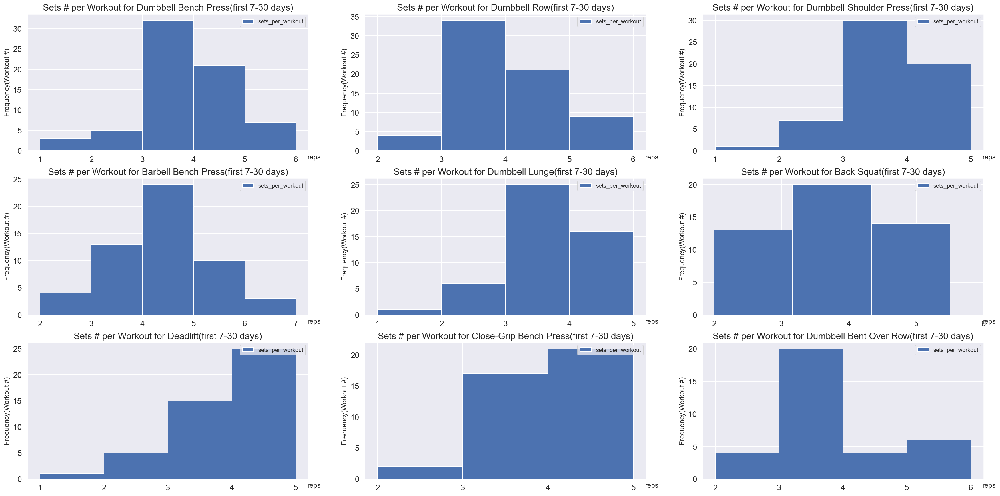

In [154]:
fig = plt.figure(figsize = (120,160))
count = 1
for exercise in list(exer_counts_7_30.index):
    ax = fig.add_subplot(3, 3, count) 
    count_df = workouts_7_30_exer_set_freq[workouts_7_30_exer_set_freq['exerciseName']==exercise]
    r = count_df['sets_per_workout'].max() - count_df['sets_per_workout'].min()
    count_df['sets_per_workout'].plot.hist(bins = int(r),figsize = (30,15))
    plt.xlabel('reps', fontsize=12)
    plt.ylabel('Frequency(Workout #)', fontsize=12)
    plt.xticks(np.arange(count_df['sets_per_workout'].min(), count_df['sets_per_workout'].max()+1, 1.0))
    ax.xaxis.set_label_coords(1.02, -0.025)
    ax.tick_params(axis='both', which='major', labelsize=14,rotation = 0)
    title = "Sets # per Workout for " + exercise + "(first 7-30 days)"   
    ax.set_title(title,fontsize=16)
    plt.legend(loc='upper right',prop={'size': 10})
    count +=1

#### Number of sets completed by each user for each exercise

In [155]:
user_exer_7_30 = pd.DataFrame(workouts_7_30['fake_user_id'].value_counts())
user_exer_7_30.columns = ['# of Recordings']
user_exer_7_30

,# of Recordings
fake_id_882,109
fake_id_902,75
fake_id_899,69
fake_id_896,69
fake_id_893,64
fake_id_892,64
fake_id_917,62
fake_id_886,58
fake_id_928,58
fake_id_888,56


In [156]:
for exercise in  list(exer_counts_7_30.index): 
    exer_df = workouts_7_30[workouts_7_30['exerciseName']==exercise]
    for id in user_exer_7_30.index:
        exer_df = workouts_7_30[workouts_7_30['exerciseName']==exercise]
        colname = exercise + str('7_30')
        user_exer_7_30.loc[id,colname] = exer_df[exer_df['fake_user_id']==id].shape[0]

In [157]:
user_exer_7_30=user_exer_7_30.astype(int)
user_exer_7_30

,# of Recordings,Dumbbell Bench Press7_30,Dumbbell Row7_30,Dumbbell Shoulder Press7_30,Barbell Bench Press7_30,Dumbbell Lunge7_30,Back Squat7_30,Deadlift7_30,Close-Grip Bench Press7_30,Dumbbell Bent Over Row7_30
fake_id_882,109,4,23,7,23,0,18,22,12,0
fake_id_902,75,3,4,22,21,3,9,9,0,4
fake_id_899,69,4,6,3,12,0,29,7,8,0
fake_id_896,69,2,11,3,7,4,17,16,9,0
fake_id_893,64,9,9,3,4,3,12,16,8,0
fake_id_892,64,9,12,7,6,3,7,13,7,0
fake_id_917,62,11,13,9,15,3,11,0,0,0
fake_id_886,58,3,3,7,12,0,4,19,7,3
fake_id_928,58,4,7,5,0,0,19,10,13,0
fake_id_888,56,14,3,9,8,3,9,7,3,0


#### Correlation between Different Exercises

In [158]:
user_exer_7_30_corr = user_exer_7_30.corr('pearson')

In [159]:
user_exer_7_30_corr.style.background_gradient(cmap='coolwarm')

,# of Recordings,Dumbbell Bench Press7_30,Dumbbell Row7_30,Dumbbell Shoulder Press7_30,Barbell Bench Press7_30,Dumbbell Lunge7_30,Back Squat7_30,Deadlift7_30,Close-Grip Bench Press7_30,Dumbbell Bent Over Row7_30
# of Recordings,1.000000,0.369148,0.642628,0.547208,0.686269,0.241816,0.767505,0.772277,0.658471,0.014104
Dumbbell Bench Press7_30,0.369148,1.000000,0.367161,0.311020,-0.014359,0.253463,0.069883,0.049811,0.035562,-0.093595
Dumbbell Row7_30,0.642628,0.367161,1.000000,0.319921,0.274484,0.118593,0.381982,0.344918,0.373766,-0.092394
Dumbbell Shoulder Press7_30,0.547208,0.311020,0.319921,1.000000,0.343908,0.146892,0.197575,0.218237,0.132538,0.159181
Barbell Bench Press7_30,0.686269,-0.014359,0.274484,0.343908,1.000000,-0.083046,0.570147,0.552819,0.372443,-0.127053
Dumbbell Lunge7_30,0.241816,0.253463,0.118593,0.146892,-0.083046,1.000000,0.039634,0.112828,0.042075,0.069293
Back Squat7_30,0.767505,0.069883,0.381982,0.197575,0.570147,0.039634,1.000000,0.638347,0.533723,-0.145624
Deadlift7_30,0.772277,0.049811,0.344918,0.218237,0.552819,0.112828,0.638347,1.000000,0.617294,-0.142292
Close-Grip Bench Press7_30,0.658471,0.035562,0.373766,0.132538,0.372443,0.042075,0.533723,0.617294,1.000000,-0.039517
Dumbbell Bent Over Row7_30,0.014104,-0.093595,-0.092394,0.159181,-0.127053,0.069293,-0.145624,-0.142292,-0.039517,1.000000


In [160]:
user_exer_7_30_corr[user_exer_7_30_corr >= 0.68].style.applymap(lambda x: 'color: red' if pd.notnull(x) else "")

,# of Recordings,Dumbbell Bench Press7_30,Dumbbell Row7_30,Dumbbell Shoulder Press7_30,Barbell Bench Press7_30,Dumbbell Lunge7_30,Back Squat7_30,Deadlift7_30,Close-Grip Bench Press7_30,Dumbbell Bent Over Row7_30
# of Recordings,1.000000,nan,nan,nan,0.686269,nan,0.767505,0.772277,nan,nan
Dumbbell Bench Press7_30,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan
Dumbbell Row7_30,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,nan
Dumbbell Shoulder Press7_30,nan,nan,nan,1.000000,nan,nan,nan,nan,nan,nan
Barbell Bench Press7_30,0.686269,nan,nan,nan,1.000000,nan,nan,nan,nan,nan
Dumbbell Lunge7_30,nan,nan,nan,nan,nan,1.000000,nan,nan,nan,nan
Back Squat7_30,0.767505,nan,nan,nan,nan,nan,1.000000,nan,nan,nan
Deadlift7_30,0.772277,nan,nan,nan,nan,nan,nan,1.000000,nan,nan
Close-Grip Bench Press7_30,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,nan
Dumbbell Bent Over Row7_30,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000


### 3.2.4 Overall Reps/Weights Distribution for Each Exercise

In [161]:
def violinplt(x,y,title):
    exercises_list = list(data_df[x].unique())
    fig,ax = plt.subplots(figsize = (25,10))
    sns.violinplot(x = x, y=y,data = data_df[[y,x]],order = exercises_list)
    ax.set_title(title)
    plt.xticks(rotation = 30)

In [162]:
def boxplt(x,y,title):
    fig,ax=plt.subplots(figsize = (25,10))
    sns.boxplot(x =x, y=y,data=data_df[[y,x]])
    ax.set_title(title)
    plt.xticks(rotation = 30)

#### reps

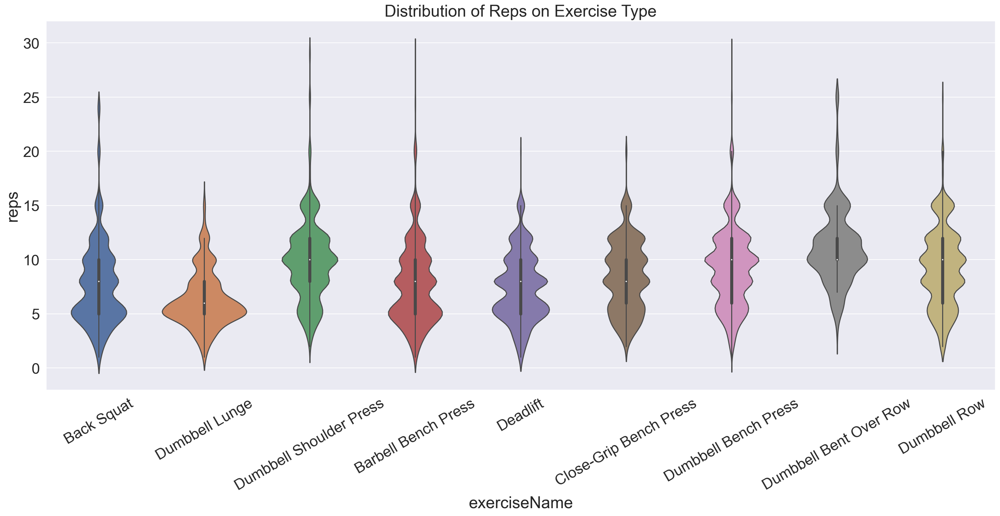

In [163]:
violinplt(x = 'exerciseName', y='reps',title = 'Distribution of Reps on Exercise Type')

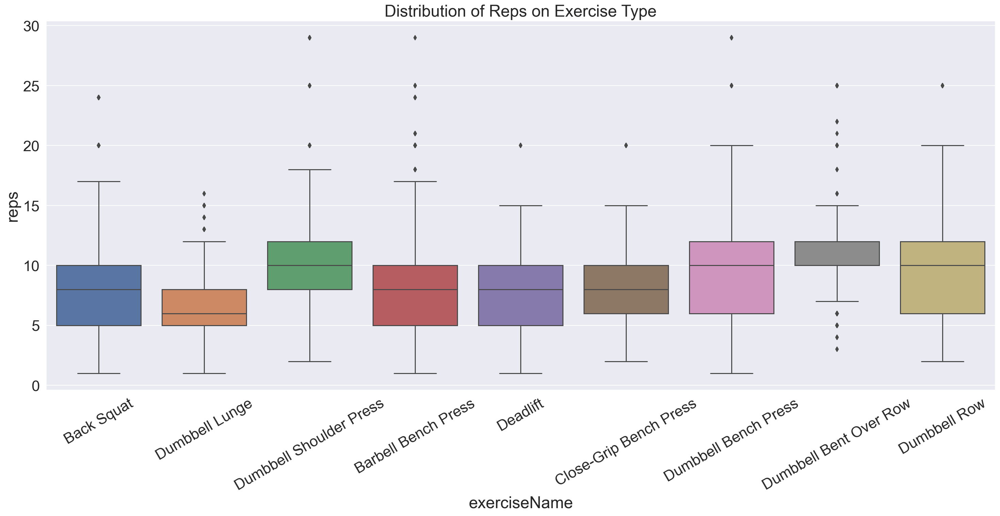

In [164]:
boxplt(x = 'exerciseName', y='reps',title = 'Distribution of Reps on Exercise Type')

#### weights

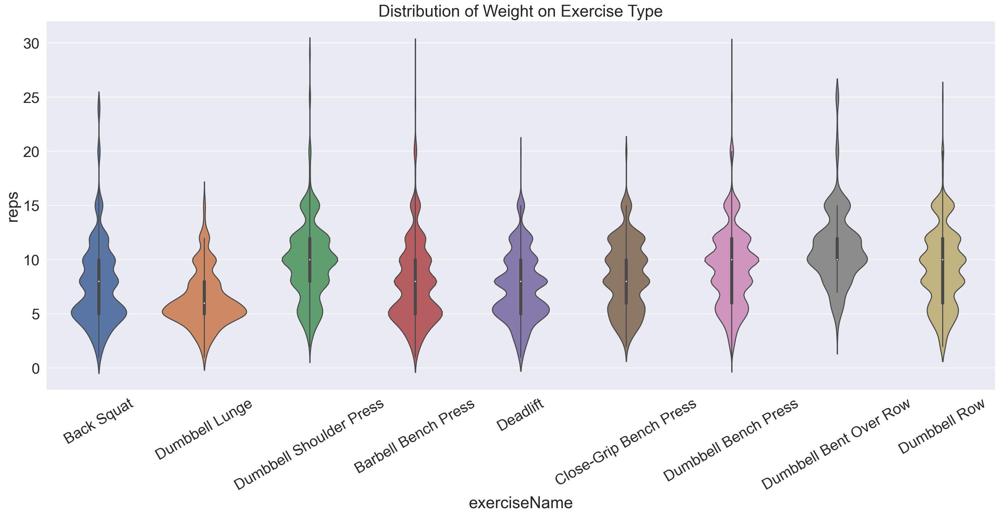

In [166]:
violinplt(x = 'exerciseName', y='reps',title = 'Distribution of Weight on Exercise Type')

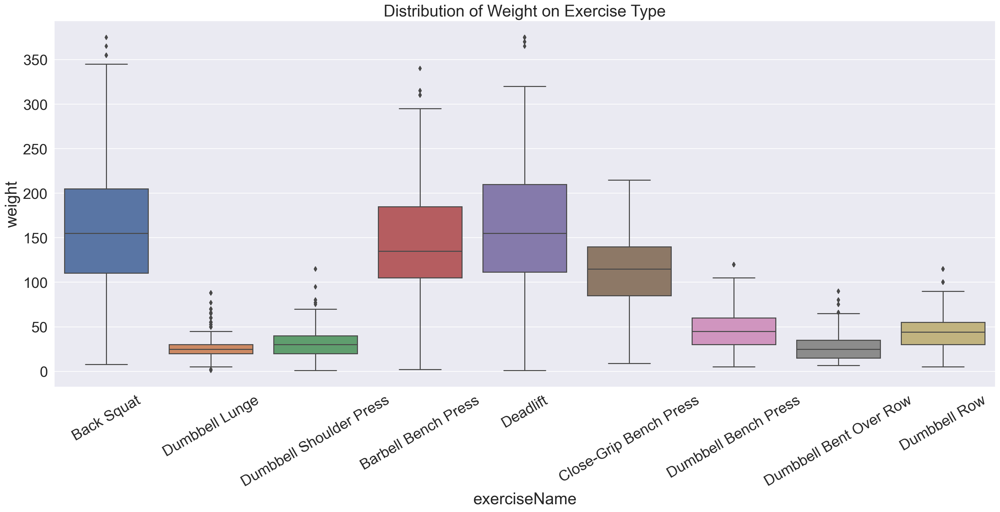

In [165]:
boxplt(x = 'exerciseName', y='weight',title = 'Distribution of Weight on Exercise Type')

## 3.3 DAU Fluctuation

### Distribution on the whole time window (2017/06/27 -  2020/08/07)

In [130]:
user_count = data_df[['Date','fake_user_id']].groupby(['Date']).count().sort_index()
user_count.columns = ['DAU']
user_count

,DAU
Date,
2017-06-27,7
2017-06-29,10
2017-07-02,5
2017-09-15,9
2017-09-18,2
...,...
2020-08-03,25
2020-08-04,35
2020-08-05,30


Text(0.5, 1.0, 'DAU (2017/06/27 - 2020/08/07)')

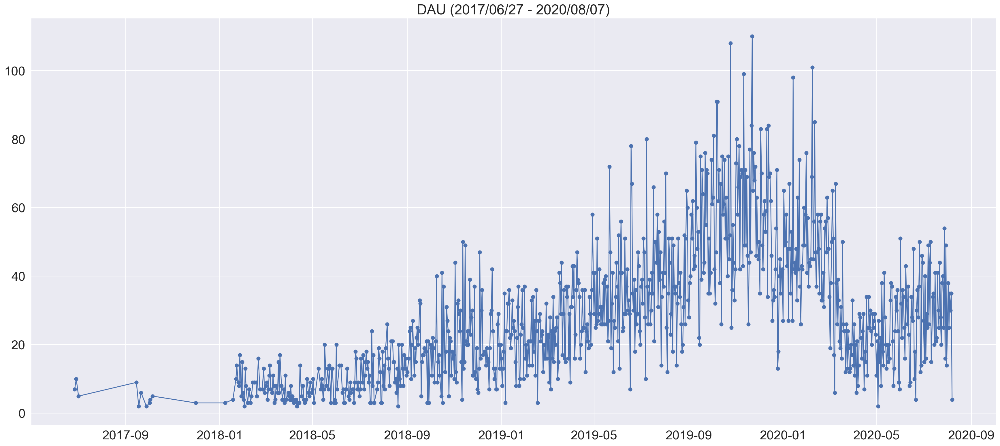

In [168]:
fig,ax = plt.subplots(figsize = (30,13))
plt.plot(user_count.index,user_count,'o-',color = 'b',label="DAU")
ax.set_title('DAU (2017/06/27 - 2020/08/07)')

### Distribution on each year 

Try to check whether there is any seasonality.

Text(0.5, 1.0, 'DAU (2017/06/27 - 2018/06/26)')

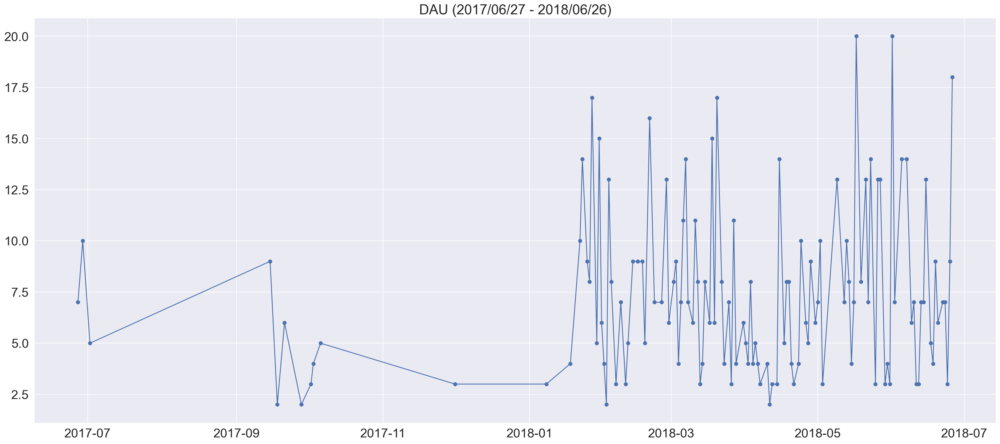

In [169]:
data_17_18 = user_count[user_count.index <'2018-06-27 00:00:00' ]
fig,ax = plt.subplots(figsize = (30,13))
plt.plot(data_17_18.index,data_17_18,'o-',color = 'b',label="DAU")
ax.set_title('DAU (2017/06/27 - 2018/06/26)')

Text(0.5, 1.0, 'DAU (2018/06/27 - 2019/06/26)')

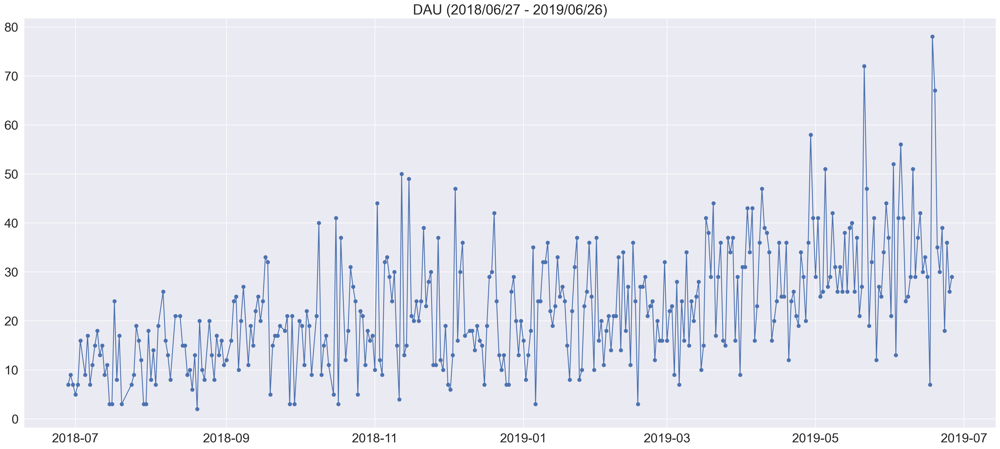

In [170]:
data_18_19 = user_count[(user_count.index <'2019-06-27 00:00:00')&(user_count.index >'2018-06-27 00:00:00' )]
fig,ax = plt.subplots(figsize = (30,13))
plt.plot(data_18_19.index,data_18_19,'o-',color = 'b',label="DAU")
ax.set_title('DAU (2018/06/27 - 2019/06/26)')

Text(0.5, 1.0, 'DAU (2019/06/27 - 2020/06/26)')

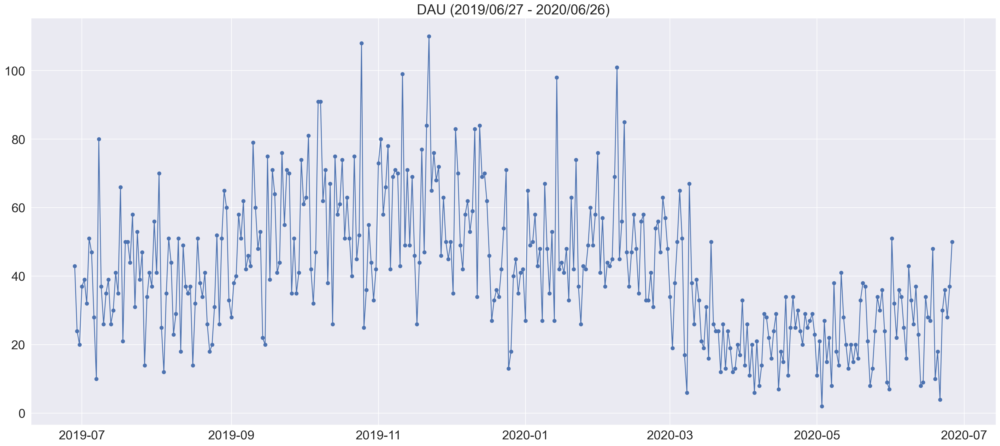

In [171]:
data_19_20 = user_count[(user_count.index <'2020-06-27 00:00:00')&(user_count.index >'2019-06-27 00:00:00' )]
fig,ax = plt.subplots(figsize = (30,13))
plt.plot(data_19_20.index,data_19_20,'o-',color = 'b',label="DAU")
ax.set_title('DAU (2019/06/27 - 2020/06/26)')

On the general level, there is no significant seasonal tendency on the usage of Fitbod based on the yearly distribution.

#### Based on the domain knowledge and industrial practices, 'holiday' has a strong factor on the usage of fitness app like Fitbod, especially the usage for the strength training exercises with equipments.

In [125]:
from datetime import date as date
import holidays 
holidays.US(years = [2017,2018,2019,2020])
valid_dates = []
for date, holiday in holidays.US(years = [2017,2018,2019,2020]).items():
    if (date> datetime.date(2017,6,26)) and (date < datetime.date(2020,8,8)):
        valid_dates.append(date)

In [126]:
valid_dates

[datetime.date(2017, 7, 4),
 datetime.date(2017, 9, 4),
 datetime.date(2017, 10, 9),
 datetime.date(2017, 11, 11),
 datetime.date(2017, 11, 10),
 datetime.date(2017, 11, 23),
 datetime.date(2017, 12, 25),
 datetime.date(2018, 1, 1),
 datetime.date(2018, 1, 15),
 datetime.date(2018, 2, 19),
 datetime.date(2018, 5, 28),
 datetime.date(2018, 7, 4),
 datetime.date(2018, 9, 3),
 datetime.date(2018, 10, 8),
 datetime.date(2018, 11, 11),
 datetime.date(2018, 11, 12),
 datetime.date(2018, 11, 22),
 datetime.date(2018, 12, 25),
 datetime.date(2019, 1, 1),
 datetime.date(2019, 1, 21),
 datetime.date(2019, 2, 18),
 datetime.date(2019, 5, 27),
 datetime.date(2019, 7, 4),
 datetime.date(2019, 9, 2),
 datetime.date(2019, 10, 14),
 datetime.date(2019, 11, 11),
 datetime.date(2019, 11, 28),
 datetime.date(2019, 12, 25),
 datetime.date(2020, 1, 1),
 datetime.date(2020, 1, 20),
 datetime.date(2020, 2, 17),
 datetime.date(2020, 5, 25),
 datetime.date(2020, 7, 4),
 datetime.date(2020, 7, 3)]

In [127]:
holiday_df = data_df[[(i.date() in valid_dates) for i in data_df['Date']]]

In [128]:
holiday_user_count = holiday_df[['Date','fake_user_id']].groupby(['Date']).count()
holiday_user_count.columns =['Holiday DAU']
holiday_user_count

,Holiday DAU
Date,
2018-09-03,16
2018-10-08,21
2018-11-11,4
2018-11-12,50
2018-11-22,23
2018-12-25,7
2019-01-01,16
2019-01-21,22
2019-02-18,27


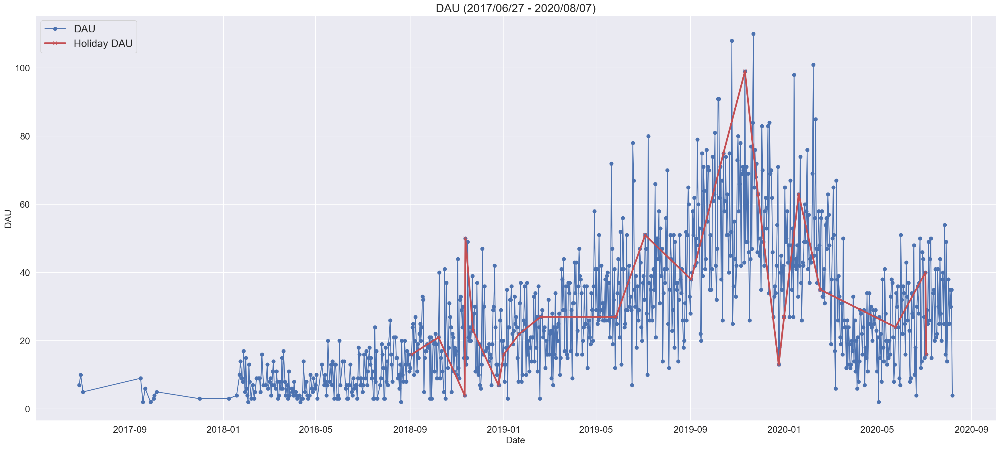

In [131]:
fig,ax = plt.subplots(figsize = (30,13))
plt.plot(user_count.index,user_count,'o-',color = 'b',label="DAU")
plt.plot(holiday_user_count.index,holiday_user_count,'x-',color = 'r',label="Holiday DAU",linewidth=3)
plt.xlabel('Date', fontsize=16)
plt.ylabel('DAU', fontsize=16)
ax.set_title('DAU (2017/06/27 - 2020/08/07)',fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=16)
plt.legend(loc='upper left',prop={'size': 18})

In the primary visualization work, we could see that the tendency and changepoints of DAU on holidays are significantly overlapping with the overall tendency and changepoints of DAU on the whole dataset. Thus, we could infer 'holiday' is a strong factor to take into consideration while studying the users' behaviour on Fitbod.

Next, do some statistical analysis on the relationship between holiday and DAU to learn the correlation quantitatively.

#### Kendall-Tau Correlation between holiday and DAU

In [132]:
user_count_corr = user_count

In [133]:
for d in user_count_corr.index:
    if d in holiday_user_count.index:
        user_count_corr.loc[d,'holiday'] = 1
    else:
        user_count_corr.loc[d,'holiday'] = 0

In [134]:
user_count_corr['holiday'] = user_count_corr['holiday'].astype('int')
user_count_corr

,DAU,holiday
Date,,
2017-06-27,7,0
2017-06-29,10,0
2017-07-02,5,0
2017-09-15,9,0
2017-09-18,2,0
...,...,...
2020-08-03,25,0
2020-08-04,35,0
2020-08-05,30,0


Text(0.5, 1.0, 'Normal Days vs. Holidays')

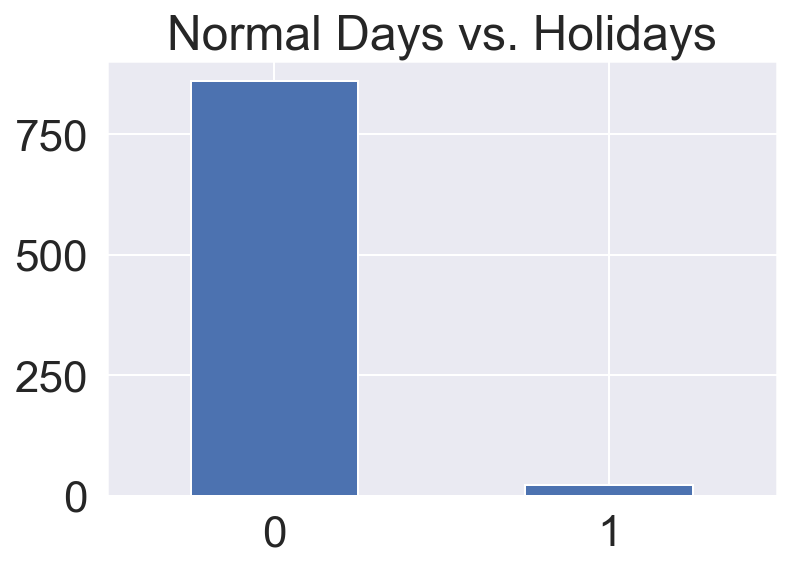

In [137]:
user_count_corr['holiday'].value_counts().plot(kind = 'bar')
plt.xticks(rotation = 0)
plt.title('Normal Days vs. Holidays')

In [181]:
from scipy.stats import kendalltau

In [182]:
X = user_count_corr['holiday']
y = user_count_corr['DAU']

In [183]:
corr,pvalue = kendalltau(X,y)
print('Correlation between "holiday" and "DAU"',corr,' pvalue = ',pvalue)

Correlation between "holiday" and "DAU" 0.031072397081626783  pvalue =  0.2633323678634528


Fix the imbalance issue via under-resampling.

In [184]:
from imblearn.under_sampling import RandomUnderSampler

Using TensorFlow backend.


In [185]:
X = np.array(X)
X = X.reshape(-1,1)
X.shape

(881, 1)

In [187]:
y = np.array(y)
y = y.reshape(-1,1)
y.shape

(881, 1)

In [188]:
X = pd.DataFrame(X)
X.columns = ['holiday']
y = pd.DataFrame(y)
y.columns = ['DAU']

In [189]:
rus = RandomUnderSampler(random_state=0)
y_rus,X_rus = rus.fit_sample(y, X)

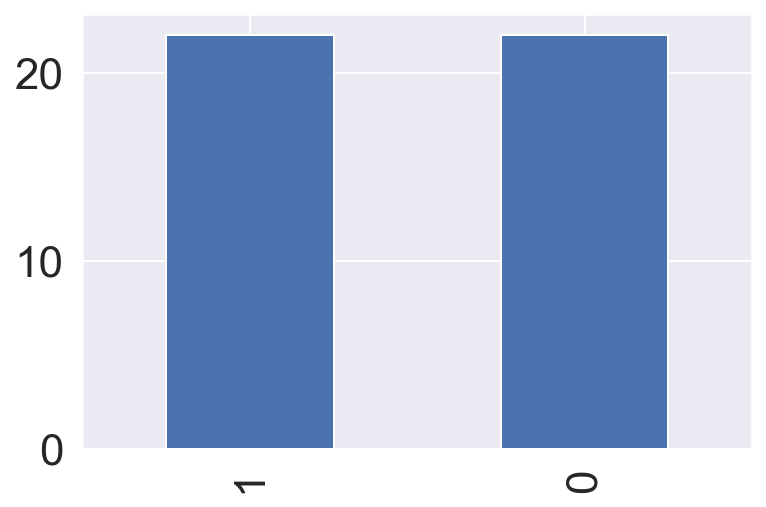

In [190]:
X_rus['holiday'].value_counts().plot(kind = 'bar')


In [191]:
corr,pvalue = kendalltau(X_rus,y_rus)
print('Correlation between "holiday" and "DAU"',corr,' pvalue = ',pvalue)

Correlation between "holiday" and "DAU" 0.04618108928563257  pvalue =  0.715825272025102


#### Dive deeply into the recordings on holidays.

In [192]:
holiday_df 

,Date,workoutId,exerciseId,singleSetId,exerciseName,reps,weight,fake_user_id
78,2019-01-01,MJMVGPxr6J,3,zAYlZtK1p8,Barbell Bench Press,10,135.0,fake_id_908
119,2019-07-04,fALUw7KvaB,6,kQl5fDSAy5,Dumbbell Bench Press,8,70.0,fake_id_888
140,2019-07-04,pZ0vwSFTGN,4,0EQ5YJESrd,Deadlift,12,165.0,fake_id_924
148,2019-05-27,fM5ivmCDu9,6,R3uwYhiRD1,Dumbbell Bench Press,6,70.0,fake_id_888
245,2019-07-04,v2Rn8sppfw,0,ZAI92e4fit,Back Squat,4,185.0,fake_id_896
...,...,...,...,...,...,...,...,...
25006,2019-07-04,AC6NNGDMp6,6,e6ZX86i71Y,Dumbbell Bench Press,12,17.5,fake_id_880
25019,2020-01-20,3ZVscE3ALb,4,MdhwBYniuw,Deadlift,5,135.0,fake_id_878
25037,2018-11-11,lgU8KcC6rC,0,DjrA0RCxIj,Back Squat,16,30.0,fake_id_905
25059,2019-11-11,T0X9TGBEkr,2,AA26xLsweB,Dumbbell Shoulder Press,3,24.0,fake_id_895


In [193]:
holiday_df.shape


(757, 8)

In [194]:
holiday_df['fake_user_id'].value_counts().describe()

count    57.000000
mean     13.280702
std      10.468924
min       2.000000
25%       5.000000
50%      11.000000
75%      18.000000
max      43.000000
Name: fake_user_id, dtype: float64

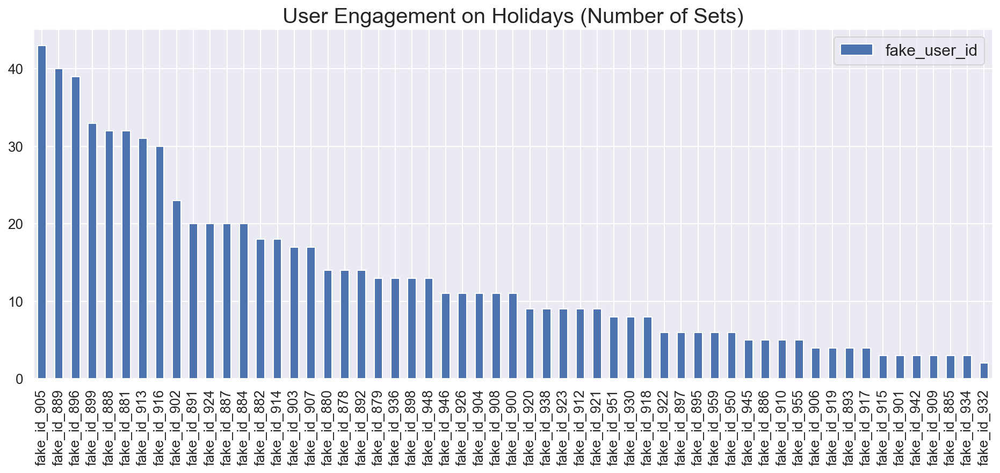

In [195]:
ax = holiday_df['fake_user_id'].value_counts().plot(kind  = 'bar',figsize=(16,6))
ax.set_title('User Engagement on Holidays (Number of Sets)',fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=13)
plt.legend(loc='upper right',prop={'size': 15})

In [196]:
user_holiday_engagement = len(holiday_df['fake_user_id'].unique())/len(data_df['fake_user_id'].unique())
print('The ratio of users who workout on holidays:',user_holiday_engagement)

The ratio of users who workout on holidays: 0.6195652173913043


In [197]:
holiday_users =set(holiday_df['fake_user_id'].unique())

In [198]:
holiday_user_df = data_df[[i in holiday_users for i in data_df['fake_user_id']]]
holiday_user_df

,Date,workoutId,exerciseId,singleSetId,exerciseName,reps,weight,fake_user_id
0,2018-11-07,HVR6PqUJ1h,0,OEGAjIVQFJ,Back Squat,5,65.0,fake_id_914
1,2020-03-23,dWFJqrWXSC,1,npHCsmG0eM,Dumbbell Lunge,5,15.0,fake_id_916
2,2020-02-11,0JcIc38PW7,0,uGei9KiU7y,Back Squat,4,65.0,fake_id_898
3,2019-04-05,dCzb3hMeTL,2,uzMUFki4fS,Dumbbell Shoulder Press,12,40.0,fake_id_896
4,2019-12-22,S6zuHg6LqC,3,EaWViP9DD3,Barbell Bench Press,10,135.0,fake_id_899
...,...,...,...,...,...,...,...,...
25218,2018-04-15,NR6hhhIjCk,1,OVoCEDXE15,Dumbbell Lunge,4,70.0,fake_id_881
25219,2019-10-02,JacTVkcAEp,3,6skzaeuarT,Barbell Bench Press,3,225.0,fake_id_946
25220,2019-04-17,GRub4UrSHF,0,f9YkEjKT4k,Back Squat,10,160.0,fake_id_896
25221,2020-04-13,xgG5taVJQG,7,BlFcBeivzF,Dumbbell Bent Over Row,10,26.5,fake_id_951


In [199]:
holiday_user_df['fake_user_id'].value_counts()

fake_id_889    1681
fake_id_881    1340
fake_id_896    1268
fake_id_905    1121
fake_id_902     998
fake_id_899     831
fake_id_888     684
fake_id_913     588
fake_id_923     553
fake_id_882     546
fake_id_916     536
fake_id_921     536
fake_id_887     535
fake_id_903     466
fake_id_908     464
fake_id_879     444
fake_id_906     430
fake_id_895     430
fake_id_878     414
fake_id_904     404
fake_id_938     384
fake_id_891     379
fake_id_917     366
fake_id_924     350
fake_id_914     338
fake_id_948     336
fake_id_892     328
fake_id_884     303
fake_id_893     303
fake_id_880     302
fake_id_907     295
fake_id_909     289
fake_id_951     282
fake_id_885     277
fake_id_900     263
fake_id_950     256
fake_id_898     250
fake_id_945     240
fake_id_922     237
fake_id_918     232
fake_id_936     220
fake_id_886     180
fake_id_920     178
fake_id_901     175
fake_id_946     172
fake_id_910     157
fake_id_942     149
fake_id_897     130
fake_id_932     127
fake_id_955     125


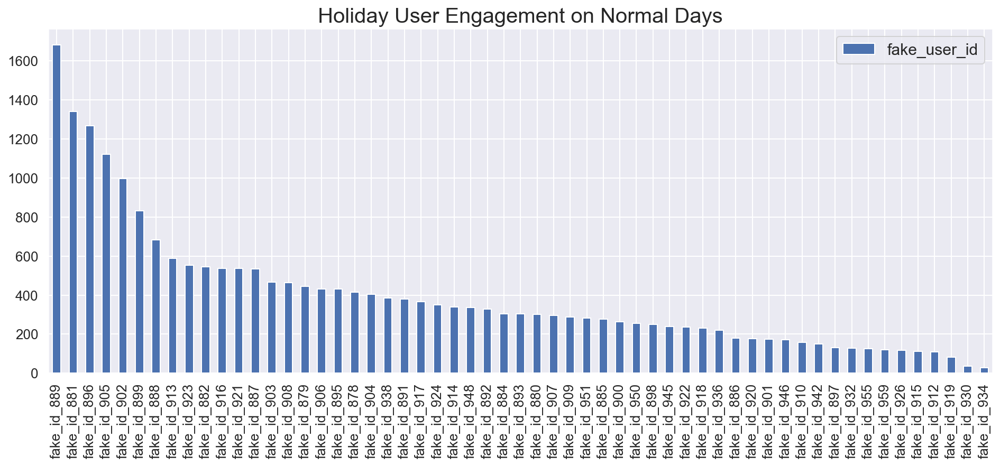

In [200]:
ax = holiday_user_df['fake_user_id'].value_counts().plot(kind = 'bar',figsize =(16,6))
ax.set_title('Holiday User Engagement on Normal Days',fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=13)
plt.legend(loc='upper right',prop={'size': 15})

In [201]:
not_holiday_users = set(data_df['fake_user_id'].values) - set(holiday_df['fake_user_id'].values)
not_holiday_users

{'fake_id_883',
 'fake_id_890',
 'fake_id_894',
 'fake_id_911',
 'fake_id_925',
 'fake_id_927',
 'fake_id_928',
 'fake_id_929',
 'fake_id_931',
 'fake_id_933',
 'fake_id_935',
 'fake_id_937',
 'fake_id_939',
 'fake_id_940',
 'fake_id_941',
 'fake_id_943',
 'fake_id_944',
 'fake_id_947',
 'fake_id_949',
 'fake_id_952',
 'fake_id_953',
 'fake_id_954',
 'fake_id_956',
 'fake_id_957',
 'fake_id_958',
 'fake_id_960',
 'fake_id_961',
 'fake_id_962',
 'fake_id_963',
 'fake_id_964',
 'fake_id_965',
 'fake_id_966',
 'fake_id_967',
 'fake_id_968',
 'fake_id_969'}

In [202]:
not_holiday_user_df = data_df[[i in not_holiday_users for i in data_df['fake_user_id']]]
not_holiday_user_df 

,Date,workoutId,exerciseId,singleSetId,exerciseName,reps,weight,fake_user_id
10,2019-09-27,vp0wHKXDL8,6,OO7KQATjLz,Dumbbell Bench Press,10,40.0,fake_id_927
14,2019-06-02,FIcqi6srvj,4,vQd8KQJYVO,Deadlift,6,225.0,fake_id_894
17,2019-11-07,UW4OMccfCh,6,RKXSBvXvAR,Dumbbell Bench Press,15,35.0,fake_id_968
30,2018-10-17,5gEhhyorTr,8,FN8PBYGNwh,Dumbbell Row,10,25.0,fake_id_931
43,2018-06-07,c3M3GoSwld,6,QiqLv8JcWS,Dumbbell Bench Press,10,90.0,fake_id_894
...,...,...,...,...,...,...,...,...
25162,2020-06-05,P7rFCYFYB4,2,1BcVYwO1wD,Dumbbell Shoulder Press,10,15.0,fake_id_960
25191,2019-07-20,KbfSTcGX7V,0,rKi6jEgSHu,Back Squat,20,63.0,fake_id_883
25196,2019-04-12,iObn2K7E9k,8,WEXM4aNCwp,Dumbbell Row,15,25.0,fake_id_949
25207,2020-03-19,DTCGIW5FoZ,1,D2JZsv10DM,Dumbbell Lunge,4,30.0,fake_id_931


In [203]:
not_holiday_user_df['fake_user_id'].value_counts()

fake_id_949    492
fake_id_894    324
fake_id_931    247
fake_id_883    223
fake_id_890    161
fake_id_927    117
fake_id_928    109
fake_id_952     89
fake_id_956     88
fake_id_935     83
fake_id_954     70
fake_id_925     66
fake_id_937     66
fake_id_940     64
fake_id_929     59
fake_id_911     58
fake_id_958     52
fake_id_964     36
fake_id_963     35
fake_id_943     34
fake_id_939     33
fake_id_933     29
fake_id_944     27
fake_id_960     25
fake_id_957     23
fake_id_947     22
fake_id_941     20
fake_id_966     20
fake_id_965     14
fake_id_953      9
fake_id_961      8
fake_id_968      6
fake_id_967      6
fake_id_969      3
fake_id_962      2
Name: fake_user_id, dtype: int64

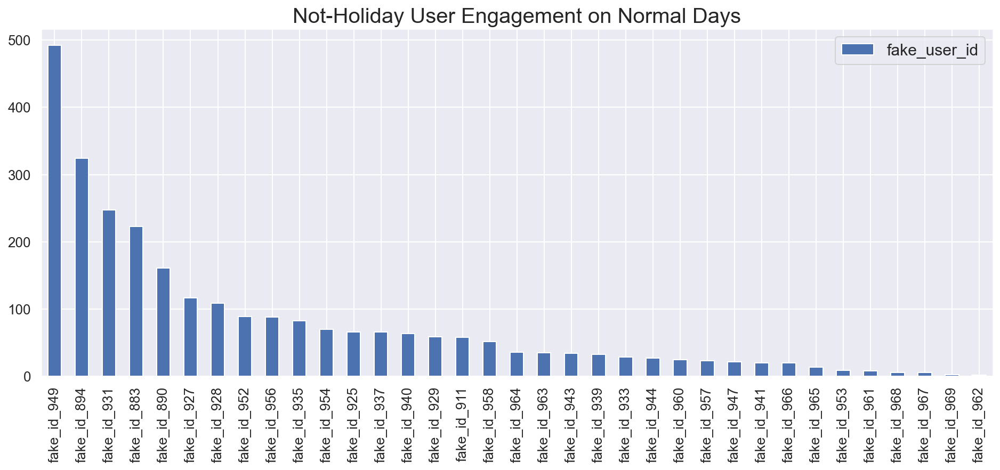

In [204]:
ax = not_holiday_user_df['fake_user_id'].value_counts().plot(kind = 'bar',figsize =(16,6),title = 'Usage Frequency for not-holiday users')
ax.set_title('Not-Holiday User Engagement on Normal Days',fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=13)
plt.legend(loc='upper right',prop={'size': 15})

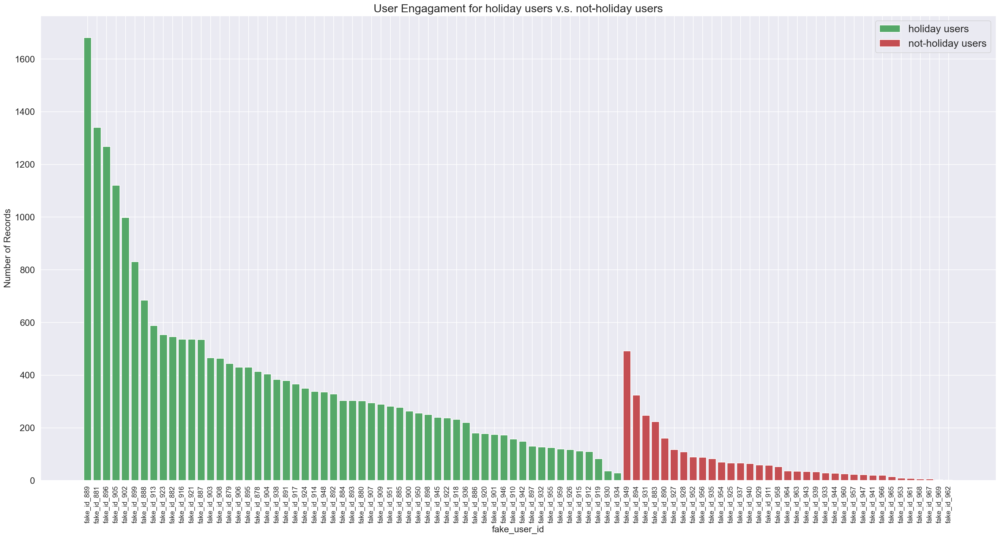

In [205]:
fig,ax = plt.subplots(figsize = (30,15))
plt.bar(holiday_user_df['fake_user_id'].value_counts().index,holiday_user_df['fake_user_id'].value_counts().values,color = 'g',label = 'holiday users')
plt.bar(not_holiday_user_df['fake_user_id'].value_counts().index,not_holiday_user_df['fake_user_id'].value_counts().values,color = 'r',label = 'not-holiday users')
ax.set_title('User Engagament for holiday users v.s. not-holiday users',fontsize= 20)
plt.xlabel('fake_user_id', fontsize=16)
plt.ylabel('Number of Records', fontsize=16)
ax.tick_params(axis='x', which='major', labelsize=12,labelrotation = 90)
ax.tick_params(axis='y', which='major', labelsize=16)
plt.legend(loc='upper right',prop={'size': 18})

# 4. Data Modeling —— Time Series Forecasting on Active Users

### 4.1 Preliminary Analysis and Visualization

In [452]:
plt.rcParams['font.size'] = 5

In part 3.1, I've gotten the DataFrame storing DAU on each day

In [440]:
user_count
user_count = pd.DataFrame(user_count)
user_count.columns = ['DAU']

Notice that the ending date for this dataset is 2020/08/07, and the number of recordings on this day is only 4, which is significantly smaller the numbers of recordings in the recent period. I assume that the observation of 2020/08/07 is not completed. So, here I drop this day.

In [441]:
user_count.drop([user_count.index[-1]])

,DAU
Date,
2017-06-27,7
2017-06-29,10
2017-07-02,5
2017-09-15,9
2017-09-18,2
...,...
2020-08-02,38
2020-08-03,25
2020-08-04,35


<Figure size 1440x1080 with 0 Axes>

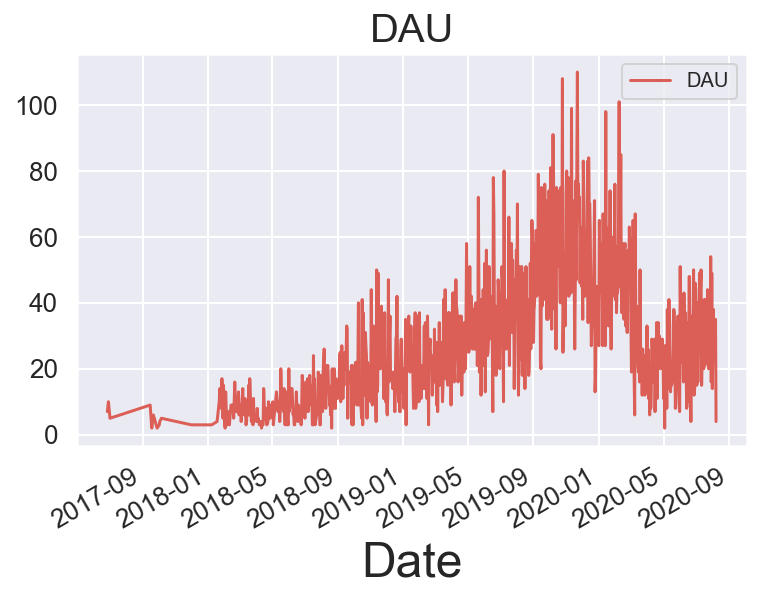

In [450]:
fig = plt.figure(figsize = (20,15))
ax = user_count.plot()
ax.set_title('DAU',fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=13)
plt.legend(loc='upper right',prop={'size': 10})

### 4.2 Resampling

<Figure size 2160x1080 with 0 Axes>

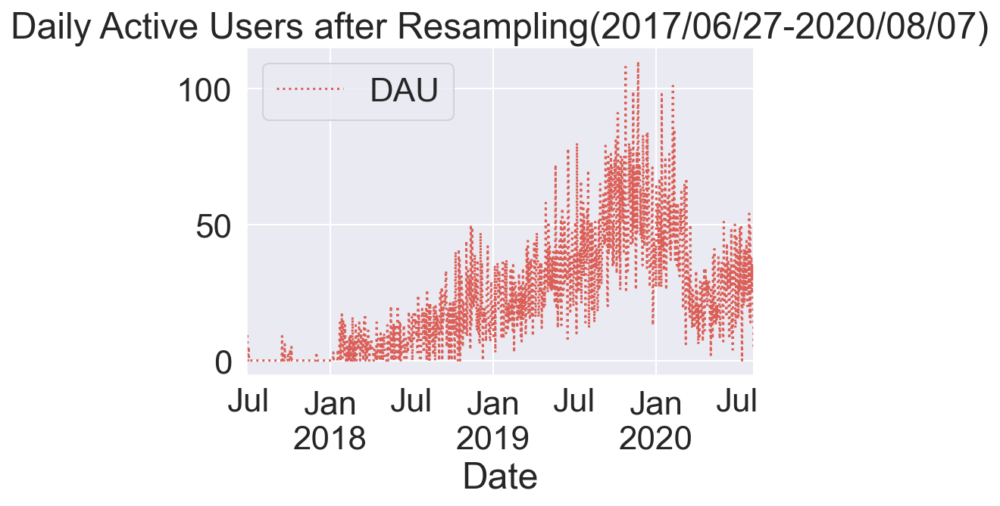

In [455]:
fig = plt.figure(figsize = (30,15))
dau = user_count.resample('D').sum()
ax = dau.plot(style = [':','--','-'], title = 'Daily Active Users after Resampling(2017/06/27-2020/08/07)')

### 4.3 Implement Baseline Time-Series Prediction Model using Prophet with Default Hyperparameter settings

In [456]:
dau2 = dau
dau2['ds'] = dau.index
dau2.columns = ['y','ds']
dau2.head()

,y,ds
Date,,
2017-06-27,7,2017-06-27
2017-06-28,0,2017-06-28
2017-06-29,10,2017-06-29
2017-06-30,0,2017-06-30
2017-07-01,0,2017-07-01


In [457]:
import fbprophet
from fbprophet.diagnostics import cross_validation

Search for the optimal hyperparameter: changepoint_prior_scale, which puts a sparse prior on the magnitudes of the rate changes (equivalent to L1 regularization).

In [458]:
def symmetric_mean_absolute_percentage_error(y_true,y_pred):
    y_true,y_pred = np.array(y_true),np.array(y_pred)
    smape = np.mean(np.abs((y_true-y_pred)/((y_true + y_pred)/2)))
    return smape

Here, we use SMAPE as the criterion to measure the performance of the model.

Another alternative is MAPE. But after resampling, some y_true values are 0, which would lead to error as denominator. 

In [459]:
prophet = fbprophet.Prophet(daily_seasonality=True,changepoint_range=0.95)
prophet.fit(dau2)
dau2_forecast = prophet.make_future_dataframe(periods = 30*3,freq = 'D')
dau2_forecast = prophet.predict(dau2_forecast)
cv_results = cross_validation(prophet,initial = '365 days', period = '30 days',horizon = '60 days')
print(cv_results)

INFO:fbprophet:Making 24 forecasts with cutoffs between 2018-07-19 00:00:00 and 2020-06-08 00:00:00


             ds       yhat  yhat_lower  yhat_upper   y     cutoff
0    2018-07-20   9.197427    5.047805   13.297227   3 2018-07-19
1    2018-07-21   9.624468    5.626180   13.613777   0 2018-07-19
2    2018-07-22   9.211698    4.761785   13.496178   0 2018-07-19
3    2018-07-23   8.759230    4.371970   13.212810   0 2018-07-19
4    2018-07-24  11.378778    6.842918   15.765702   7 2018-07-19
...         ...        ...         ...         ...  ..        ...
1435 2020-08-03  17.309431    3.151036   31.254948  25 2020-06-08
1436 2020-08-04  19.838355    5.935008   33.268443  35 2020-06-08
1437 2020-08-05  15.972289    2.775240   29.136016  30 2020-06-08
1438 2020-08-06  16.175723    2.213864   30.105257  35 2020-06-08
1439 2020-08-07  15.250487    0.167931   29.656126   4 2020-06-08

[1440 rows x 6 columns]


In [460]:
smape_baseline = symmetric_mean_absolute_percentage_error(cv_results.y,cv_results.yhat)
print('The SMAPE for the baseline model is:',smape_baseline)

The SMAPE for the baseline model is: 0.4522102266714175


### 4.4 Model Tuning and Optimization

#### Changepoints

(array([-40., -20.,   0.,  20.,  40.,  60.,  80., 100., 120.]),
 <a list of 9 Text major ticklabel objects>)

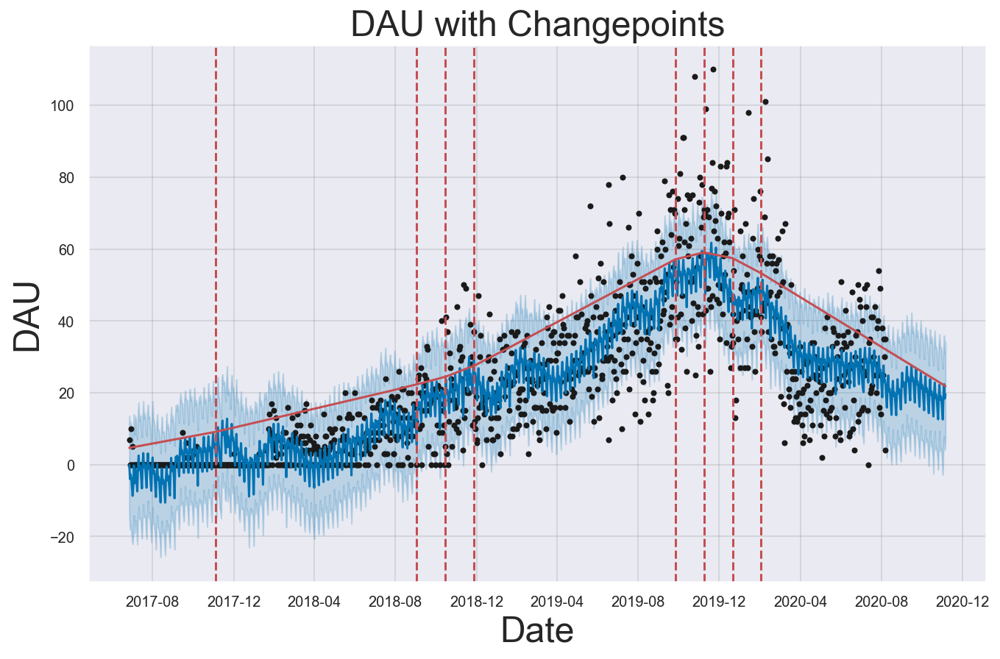

In [478]:
from fbprophet.plot import add_changepoints_to_plot
fig = prophet.plot(dau2_forecast,xlabel = 'Date',ylabel = 'DAU')
a = add_changepoints_to_plot(fig.gca(), prophet, dau2_forecast)
plt.title('DAU with Changepoints')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

Customized changepoints:

- Funding:
   
   - Round 1: 2018.01
   
   - Round 2: 2020.03

- Apple's App of the Day: 2019.08

- COVID-19 Quarantine & Free for Bodyweight Trainees: 2020.03

Seasonalities:

- Winter and Summer

- Holidays


In [466]:
from datetime import date 
import holidays 

In [467]:
holidays.US(years = [2017,2018,2019,2020])

{datetime.date(2017, 1, 1): "New Year's Day",
 datetime.date(2017, 1, 2): "New Year's Day (Observed)",
 datetime.date(2017, 1, 16): 'Martin Luther King Jr. Day',
 datetime.date(2017, 2, 20): "Washington's Birthday",
 datetime.date(2017, 5, 29): 'Memorial Day',
 datetime.date(2017, 7, 4): 'Independence Day',
 datetime.date(2017, 9, 4): 'Labor Day',
 datetime.date(2017, 10, 9): 'Columbus Day',
 datetime.date(2017, 11, 11): 'Veterans Day',
 datetime.date(2017, 11, 10): 'Veterans Day (Observed)',
 datetime.date(2017, 11, 23): 'Thanksgiving',
 datetime.date(2017, 12, 25): 'Christmas Day',
 datetime.date(2018, 1, 1): "New Year's Day",
 datetime.date(2018, 1, 15): 'Martin Luther King Jr. Day',
 datetime.date(2018, 2, 19): "Washington's Birthday",
 datetime.date(2018, 5, 28): 'Memorial Day',
 datetime.date(2018, 7, 4): 'Independence Day',
 datetime.date(2018, 9, 3): 'Labor Day',
 datetime.date(2018, 10, 8): 'Columbus Day',
 datetime.date(2018, 11, 11): 'Veterans Day',
 datetime.date(2018, 11, 

In [468]:
valid_dates = []
for date, holiday in holidays.US(years = [2017,2018,2019,2020]).items():
    if (date> datetime.date(2017,6,26)) and (date < datetime.date(2020,8,8)):
        valid_dates.append(date)
     

In [469]:
holidays_to_consider = pd.DataFrame({
    'holiday':'legal_holiday',
  'ds': pd.to_datetime(valid_dates),
  'lower_window': -1,
  'upper_window': 1,
})

In [501]:
prophet_holiday = fbprophet.Prophet(holidays = holidays_to_consider,daily_seasonality=True,changepoint_range=0.95)
prophet_holiday.fit(dau2)
dau2_forecast = prophet_holiday.make_future_dataframe(periods = 30*3,freq = 'D')
dau2_forecast = prophet_holiday.predict(dau2_forecast)
cv_results = cross_validation(prophet_holiday,initial = '365.25 days', period = '30 days',horizon = '60 days')
print(cv_results)

INFO:fbprophet:Making 24 forecasts with cutoffs between 2018-07-19 00:00:00 and 2020-06-08 00:00:00


             ds       yhat  yhat_lower  yhat_upper   y     cutoff
0    2018-07-20   9.236090    5.233379   13.440576   3 2018-07-19
1    2018-07-21   9.678412    5.441954   13.833599   0 2018-07-19
2    2018-07-22   9.070536    4.748083   13.262134   0 2018-07-19
3    2018-07-23   9.003775    4.632227   13.347204   0 2018-07-19
4    2018-07-24  11.493124    7.263403   15.920325   7 2018-07-19
...         ...        ...         ...         ...  ..        ...
1435 2020-08-03  17.063864    3.287418   30.527032  25 2020-06-08
1436 2020-08-04  19.683136    5.401366   33.076717  35 2020-06-08
1437 2020-08-05  15.570721    1.776682   29.147301  30 2020-06-08
1438 2020-08-06  15.709700    1.962086   30.917105  35 2020-06-08
1439 2020-08-07  14.766897    2.161710   28.820907   4 2020-06-08

[1440 rows x 6 columns]


In [502]:
smape_holiday = symmetric_mean_absolute_percentage_error(cv_results.y,cv_results.yhat)
print('The SMAPE for the model with consideration of holidays is:',smape_holiday)

The SMAPE for the model with consideration of holidays is: 0.4498144589979988


#### Extract the Impact from holidays (legal holidays in the US)

In [472]:
from fbprophet.plot import plot_forecast_component

(array([-6., -5., -4., -3., -2., -1.,  0.,  1.]),
 <a list of 8 Text major ticklabel objects>)

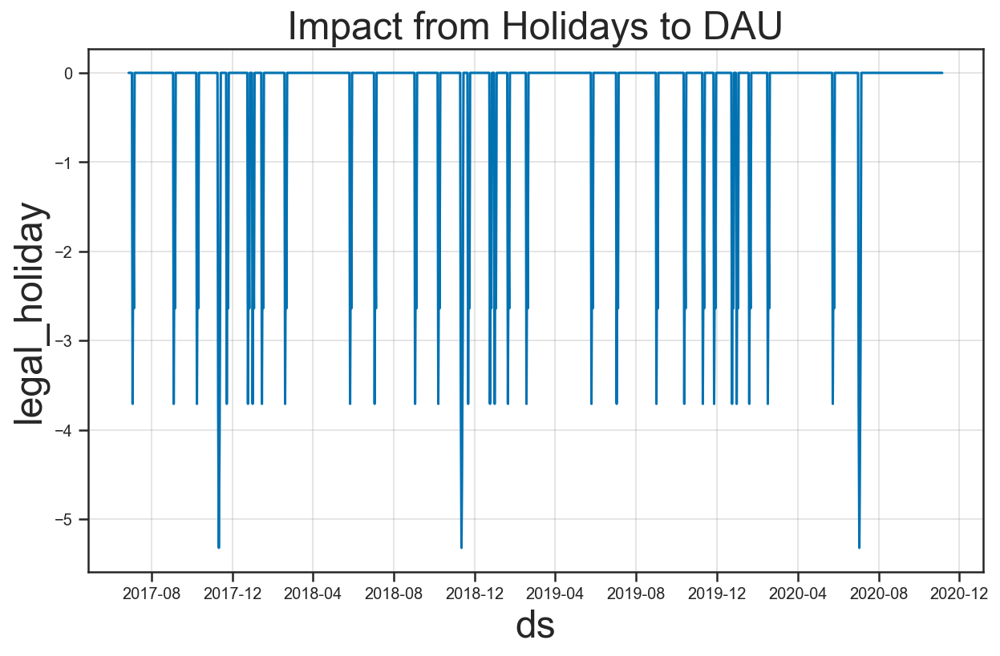

In [505]:
from fbprophet.plot import plot_forecast_component
plot_forecast_component(prophet_holiday,dau2_forecast, 'legal_holiday')
plt.title('Impact from Holidays to DAU')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

We could see that legal holidays have a negative impact on the number of DAU of Fitbod. This is because on holidays most people would have more spare time to go to gym, especially the strength trainees

In [517]:
holidays_prior_scale_list= [0.05,0.08,0.1,0.15,0.2,0.5]
for hps in holiday_prior_scale_list:
    prophet_holiday2 = fbprophet.Prophet(holidays = holidays_to_consider,daily_seasonality=True,changepoint_range=0.95,holidays_prior_scale=hps)
    prophet_holiday2.fit(dau2)
    dau2_forecast = prophet_holiday2.make_future_dataframe(periods = 30*3,freq = 'D')
    dau2_forecast = prophet_holiday2.predict(dau2_forecast)
    cv_results = cross_validation(prophet_holiday2,initial = '365.25 days', period = '30 days',horizon = '60 days')
    smape_holiday = symmetric_mean_absolute_percentage_error(cv_results.y,cv_results.yhat)
    print('holiday_prior_scale = ',hps)
    print('SMAPE = ',smape_holiday)

INFO:fbprophet:Making 24 forecasts with cutoffs between 2018-07-19 00:00:00 and 2020-06-08 00:00:00


holiday_prior_scale =  0.05
SMAPE =  0.4521731290858753


INFO:fbprophet:Making 24 forecasts with cutoffs between 2018-07-19 00:00:00 and 2020-06-08 00:00:00


holiday_prior_scale =  0.08
SMAPE =  0.4505255469287368


INFO:fbprophet:Making 24 forecasts with cutoffs between 2018-07-19 00:00:00 and 2020-06-08 00:00:00


holiday_prior_scale =  0.1
SMAPE =  0.45168075427095256


INFO:fbprophet:Making 24 forecasts with cutoffs between 2018-07-19 00:00:00 and 2020-06-08 00:00:00


holiday_prior_scale =  0.15
SMAPE =  0.4497463314797964


INFO:fbprophet:Making 24 forecasts with cutoffs between 2018-07-19 00:00:00 and 2020-06-08 00:00:00


holiday_prior_scale =  0.2
SMAPE =  0.45011845852368765


INFO:fbprophet:Making 24 forecasts with cutoffs between 2018-07-19 00:00:00 and 2020-06-08 00:00:00


holiday_prior_scale =  0.5
SMAPE =  0.45016161542800714


The settings for the best model is 
(holidays = holidays_to_consider, daily_seasonality=True,weekly_seasonality=False,changepoint_range=0.95,holidays_prior_scale=0.05).

SMAPE = 0.4497

# 5. Prediction Modeling —— Whether A User will Do Dumbbell Exercises in the following Week

## 5.1 Feature Engineering

In the previous EDA part, we notice that dumbbell exercises are most popular among all user segments and user level. So, we would like to do some prediction on this.

We use the same method as part 3 to create user-oriented new features. However, we would just use the data except for that of the recent week as input X,i.e. data till July 31th. We will use data of the recent week as input Y.

In other words, we pretend to stand at 'July 31th', making use of the data before this date in order to make prediction on 'whether the user would do dumbbell exercises in the following week as August 1st—— August 7th'.

In [138]:
data_df = data_df[data_df['Date']<='2020-07-31']

In [139]:
user_df = data_df[['fake_user_id','workoutId']].groupby(['fake_user_id']).count()
user_df.columns = ['# of Recordings']
user_df = user_df.sort_values(by='# of Recordings',ascending = False)
user_df

,# of Recordings
fake_user_id,
fake_id_889,1662
fake_id_881,1340
fake_id_896,1258
fake_id_905,1117
fake_id_902,985
fake_id_899,825
fake_id_888,684
fake_id_913,588
fake_id_882,546


In [140]:
user_engage_dict = {range(0,201):1,range(201,601):2}
user_df['Engagement'] = user_df['# of Recordings'].apply(lambda x: next((v for k, v in user_engage_dict.items() if x in k), 3))

In [141]:
for id in user_df.index:    
    user_df.loc[id,'first_workout_date'] = (data_df[['fake_user_id','Date']].groupby(['fake_user_id']).min()).loc[id,'Date']

In [142]:
current_date = datetime.datetime(2020,7,7)

In [143]:
for id in user_df.index:    
    user_df.loc[id,'time_span(days)'] = (current_date - user_df.loc[id,'first_workout_date']).days

In [144]:
interval=[7,30,90,365]
for i in interval:
    wk_recent = workouts_recent(i,current_date)
    user_df = user_df.join(wk_recent,on = 'fake_user_id').fillna(0)

In [145]:
interval1 = [7,30,90]
for i in interval1:
    wk_first = workouts_first(i)
    user_df = user_df.join(wk_first,on='fake_user_id').fillna(0)

In [146]:
for id in user_df.index:    
    user_df.loc[id,'most_recent_workout_date'] = (data_df[['fake_user_id','Date']].groupby(['fake_user_id']).max()).loc[id,'Date']

In [147]:
user_df['since_last_workout'] =user_df['most_recent_workout_date'].apply(lambda x:(current_date - x).days)

In [148]:
user_df

,# of Recordings,Engagement,first_workout_date,time_span(days),workouts_recent_7,workouts_recent_30,workouts_recent_90,workouts_recent_365,workouts_first_7,workouts_first_30,workouts_first_90,most_recent_workout_date,since_last_workout
fake_user_id,,,,,,,,,,,,,
fake_id_889,1662,3,2018-01-23,896.0,7.0,12.0,38.0,166.0,3,11,23,2020-07-30,-23
fake_id_881,1340,3,2018-01-26,893.0,0.0,0.0,0.0,119.0,4,9,33,2020-02-24,134
fake_id_896,1258,3,2019-03-28,467.0,15.0,26.0,56.0,194.0,4,16,52,2020-07-30,-23
fake_id_905,1117,3,2018-09-17,659.0,10.0,15.0,35.0,152.0,4,8,32,2020-07-27,-20
fake_id_902,985,3,2018-09-10,666.0,7.0,13.0,32.0,53.0,3,10,29,2020-07-23,-16
fake_id_899,825,3,2019-05-05,429.0,12.0,16.0,46.0,147.0,6,17,36,2020-07-30,-23
fake_id_888,684,3,2018-10-21,625.0,0.0,0.0,0.0,40.0,6,13,43,2020-03-08,121
fake_id_913,588,2,2017-09-15,1026.0,3.0,7.0,13.0,32.0,3,7,8,2020-07-25,-18
fake_id_882,546,2,2019-09-27,284.0,2.0,2.0,2.0,99.0,6,21,56,2020-07-16,-9


In [149]:
workouts_7,exer_counts_7 = exer_counts_first(7)
user_exer_7 = pd.DataFrame(workouts_7['fake_user_id'].value_counts())
user_exer_7.columns = ['# of Recordings in first 7 days']

In [150]:
for exercise in  list(exer_counts_7.index): 
    exer_df = workouts_7[workouts_7['exerciseName']==exercise]
    for id in user_exer_7.index:
        exer_df = workouts_7[workouts_7['exerciseName']==exercise]
        colname = exercise + str('0_7')
        user_exer_7.loc[id,colname] = exer_df[exer_df['fake_user_id']==id].shape[0]
        
user_exer_7=user_exer_7.astype(int)
user_exer_7

,# of Recordings in first 7 days,Dumbbell Row0_7,Dumbbell Bench Press0_7,Barbell Bench Press0_7,Dumbbell Lunge0_7,Back Squat0_7,Deadlift0_7,Dumbbell Shoulder Press0_7,Close-Grip Bench Press0_7,Dumbbell Bent Over Row0_7
fake_id_892,34,5,4,3,3,3,8,4,4,0
fake_id_899,32,3,4,3,0,15,7,0,0,0
fake_id_917,31,7,3,8,3,5,0,5,0,0
fake_id_882,31,7,0,8,0,8,0,0,8,0
fake_id_925,29,4,4,4,4,4,3,3,3,0
fake_id_939,28,3,5,6,3,4,4,0,3,0
fake_id_890,28,6,0,4,0,5,5,4,4,0
fake_id_907,27,3,3,4,3,6,4,0,4,0
fake_id_910,27,4,2,6,3,5,3,0,4,0
fake_id_881,27,4,4,4,3,4,8,0,0,0


In [151]:
workouts_7_30,exer_counts_7_30 = exer_counts_first(30)
exer_counts_7_30
user_exer_7_30 = pd.DataFrame(workouts_7_30['fake_user_id'].value_counts())
user_exer_7_30.columns = ['# of Recordings in 7-30 days']

In [152]:
for exercise in  list(exer_counts_7_30.index): 
    exer_df = workouts_7_30[workouts_7_30['exerciseName']==exercise]
    for id in user_exer_7_30.index:
        exer_df = workouts_7_30[workouts_7_30['exerciseName']==exercise]
        colname = exercise + str('7_30')
        user_exer_7_30.loc[id,colname] = exer_df[exer_df['fake_user_id']==id].shape[0]        
user_exer_7_30=user_exer_7_30.astype(int)
user_exer_7_30

,# of Recordings in 7-30 days,Dumbbell Bench Press7_30,Dumbbell Row7_30,Dumbbell Shoulder Press7_30,Barbell Bench Press7_30,Back Squat7_30,Dumbbell Lunge7_30,Deadlift7_30,Close-Grip Bench Press7_30,Dumbbell Bent Over Row7_30
fake_id_882,109,4,23,7,23,18,0,22,12,0
fake_id_902,75,3,4,22,21,9,3,9,0,4
fake_id_899,69,4,6,3,12,29,0,7,8,0
fake_id_896,69,2,11,3,7,17,4,16,9,0
fake_id_892,64,9,12,7,6,7,3,13,7,0
fake_id_893,64,9,9,3,4,12,3,16,8,0
fake_id_917,62,11,13,9,15,11,3,0,0,0
fake_id_928,58,4,7,5,0,19,0,10,13,0
fake_id_886,58,3,3,7,12,4,0,19,7,3
fake_id_888,56,14,3,9,8,9,3,7,3,0


In [153]:
def workouts_recent(interval):
    workouts = data_df[[(data_df.loc[index,'Date'] - current_date).days <= interval for index in data_df.index]]
    workouts_first= workouts[['fake_user_id','workoutId']].groupby(['fake_user_id']).workoutId.nunique()
    workouts_first= pd.DataFrame(workouts_first)
    colname = 'workouts_recent_'+str(interval)
    workouts_first.columns =[colname]
    return workouts_first

In [154]:
def exer_counts_recent(interval):
    workouts =  data_df[[(current_date-data_df.loc[index,'Date']).days <= interval for index in data_df.index]]
    exer_counts = workouts[['fake_user_id','exerciseName']].groupby(['exerciseName']).fake_user_id.nunique()
    exer_counts = pd.DataFrame(exer_counts)
    exer_counts.columns = ['count']
    exer_counts = exer_counts.sort_values(by = 'count',ascending = False)
    return workouts,exer_counts

In [155]:
workouts_recent_7,exer_counts_recent_7 = exer_counts_recent(7)
user_exer_recent_7 = pd.DataFrame(workouts_recent_7['fake_user_id'].value_counts())
user_exer_recent_7.columns = ['# of Recordings in recent 7 days']

In [156]:
for exercise in  list(exer_counts_recent_7.index): 
    exer_df = workouts_recent_7[workouts_recent_7['exerciseName']==exercise]
    for id in user_exer_recent_7.index:
        exer_df = workouts_recent_7[workouts_recent_7['exerciseName']==exercise]
        colname = exercise + str('_r7')
        user_exer_recent_7.loc[id,colname] = exer_df[exer_df['fake_user_id']==id].shape[0]
        
user_exer_recent_7=user_exer_recent_7.astype(int)
user_exer_recent_7

,# of Recordings in recent 7 days,Dumbbell Shoulder Press_r7,Dumbbell Row_r7,Barbell Bench Press_r7,Dumbbell Bench Press_r7,Back Squat_r7,Deadlift_r7,Close-Grip Bench Press_r7,Dumbbell Bent Over Row_r7,Dumbbell Lunge_r7
fake_id_896,67,0,14,3,28,3,0,2,0,17
fake_id_916,66,2,3,23,0,20,15,3,0,0
fake_id_899,58,6,0,19,0,20,7,6,0,0
fake_id_887,47,7,3,13,6,0,3,6,3,6
fake_id_900,47,0,5,13,5,13,3,4,0,4
fake_id_921,45,3,16,0,22,0,0,0,4,0
fake_id_895,45,4,4,3,0,9,8,11,0,6
fake_id_902,44,11,6,15,5,3,0,4,0,0
fake_id_942,42,13,4,5,4,4,0,0,12,0
fake_id_891,41,3,0,19,0,11,8,0,0,0


In [157]:
workouts_recent_7_30,exer_counts_recent_7_30 = exer_counts_recent(30)
user_exer_recent_7_30 = pd.DataFrame(workouts_recent_7_30['fake_user_id'].value_counts())
user_exer_recent_7_30.columns = ['# of Recordings in recent 7-30 days']

In [158]:
for exercise in  list(exer_counts_recent_7_30.index): 
    exer_df = workouts_recent_7_30[workouts_recent_7_30['exerciseName']==exercise]
    for id in user_exer_recent_7_30.index:
        exer_df = workouts_recent_7_30[workouts_recent_7_30['exerciseName']==exercise]
        colname = exercise + str('r7_r30')
        user_exer_recent_7_30.loc[id,colname] = exer_df[exer_df['fake_user_id']==id].shape[0]
        
user_exer_recent_7_30=user_exer_recent_7_30.astype(int)
user_exer_recent_7_30

,# of Recordings in recent 7-30 days,Dumbbell Shoulder Pressr7_r30,Dumbbell Bench Pressr7_r30,Dumbbell Rowr7_r30,Barbell Bench Pressr7_r30,Back Squatr7_r30,Dumbbell Bent Over Rowr7_r30,Dumbbell Lunger7_r30,Close-Grip Bench Pressr7_r30,Deadliftr7_r30
fake_id_891,109,16,7,2,30,25,0,4,0,25
fake_id_896,105,5,28,23,13,6,0,28,2,0
fake_id_916,93,2,0,3,32,25,3,0,3,25
fake_id_895,86,8,0,8,13,12,4,10,18,13
fake_id_899,77,10,3,0,25,22,0,0,10,7
fake_id_904,77,8,8,16,11,2,14,0,9,9
fake_id_902,74,11,5,6,26,19,0,3,4,0
fake_id_923,67,13,8,11,0,18,5,3,9,0
fake_id_921,63,3,33,23,0,0,4,0,0,0
fake_id_887,62,7,9,5,16,0,3,6,13,3


In [159]:
user_df = user_df.join(user_exer_7, on = 'fake_user_id')
user_df = user_df.join(user_exer_7_30, on = 'fake_user_id')
user_df = user_df.join(user_exer_recent_7, on = 'fake_user_id')
user_df = user_df.join(user_exer_recent_7_30, on = 'fake_user_id')

In [160]:
user_df = user_df.fillna(0)
user_df

,# of Recordings,Engagement,first_workout_date,time_span(days),workouts_recent_7,workouts_recent_30,workouts_recent_90,workouts_recent_365,workouts_first_7,workouts_first_30,workouts_first_90,most_recent_workout_date,since_last_workout,# of Recordings in first 7 days,Dumbbell Row0_7,Dumbbell Bench Press0_7,Barbell Bench Press0_7,Dumbbell Lunge0_7,Back Squat0_7,Deadlift0_7,Dumbbell Shoulder Press0_7,Close-Grip Bench Press0_7,Dumbbell Bent Over Row0_7,# of Recordings in 7-30 days,Dumbbell Bench Press7_30,Dumbbell Row7_30,Dumbbell Shoulder Press7_30,Barbell Bench Press7_30,Back Squat7_30,Dumbbell Lunge7_30,Deadlift7_30,Close-Grip Bench Press7_30,Dumbbell Bent Over Row7_30,# of Recordings in recent 7 days,Dumbbell Shoulder Press_r7,Dumbbell Row_r7,Barbell Bench Press_r7,Dumbbell Bench Press_r7,Back Squat_r7,Deadlift_r7,Close-Grip Bench Press_r7,Dumbbell Bent Over Row_r7,Dumbbell Lunge_r7,# of Recordings in recent 7-30 days,Dumbbell Shoulder Pressr7_r30,Dumbbell Bench Pressr7_r30,Dumbbell Rowr7_r30,Barbell Bench Pressr7_r30,Back Squatr7_r30,Dumbbell Bent Over Rowr7_r30,Dumbbell Lunger7_r30,Close-Grip Bench Pressr7_r30,Deadliftr7_r30
fake_user_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
fake_id_889,1662,3,2018-01-23,896.0,7.0,12.0,38.0,166.0,3,11,23,2020-07-30,-23,13,0,5,0,4,0,0,4,0,0,41,12,9,12,0,0,8,0,0,0,33.0,3.0,5.0,7.0,0.0,4.0,4.0,10.0,0.0,0.0,54.0,6.0,4.0,8.0,10.0,4.0,0.0,0.0,18.0,4.0
fake_id_881,1340,3,2018-01-26,893.0,0.0,0.0,0.0,119.0,4,9,33,2020-02-24,134,27,4,4,4,3,4,8,0,0,0,51,9,4,0,8,9,5,13,3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
fake_id_896,1258,3,2019-03-28,467.0,15.0,26.0,56.0,194.0,4,16,52,2020-07-30,-23,23,5,2,4,4,3,5,0,0,0,69,2,11,3,7,17,4,16,9,0,67.0,0.0,14.0,3.0,28.0,3.0,0.0,2.0,0.0,17.0,105.0,5.0,28.0,23.0,13.0,6.0,0.0,28.0,2.0,0.0
fake_id_905,1117,3,2018-09-17,659.0,10.0,15.0,35.0,152.0,4,8,32,2020-07-27,-20,16,3,3,0,3,0,0,3,0,4,37,3,8,3,3,3,3,3,3,8,40.0,6.0,3.0,0.0,13.0,11.0,4.0,3.0,0.0,0.0,60.0,6.0,13.0,3.0,4.0,16.0,0.0,3.0,3.0,12.0
fake_id_902,985,3,2018-09-10,666.0,7.0,13.0,32.0,53.0,3,10,29,2020-07-23,-16,16,0,0,7,0,4,0,5,0,0,75,3,4,22,21,9,3,9,0,4,44.0,11.0,6.0,15.0,5.0,3.0,0.0,4.0,0.0,0.0,74.0,11.0,5.0,6.0,26.0,19.0,0.0,3.0,4.0,0.0
fake_id_899,825,3,2019-05-05,429.0,12.0,16.0,46.0,147.0,6,17,36,2020-07-30,-23,32,3,4,3,0,15,7,0,0,0,69,4,6,3,12,29,0,7,8,0,58.0,6.0,0.0,19.0,0.0,20.0,7.0,6.0,0.0,0.0,77.0,10.0,3.0,0.0,25.0,22.0,0.0,0.0,10.0,7.0
fake_id_888,684,3,2018-10-21,625.0,0.0,0.0,0.0,40.0,6,13,43,2020-03-08,121,25,3,3,3,3,3,3,4,3,0,56,14,3,9,8,9,3,7,3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
fake_id_913,588,2,2017-09-15,1026.0,3.0,7.0,13.0,32.0,3,7,8,2020-07-25,-18,17,2,6,3,3,3,0,0,0,0,31,6,5,2,3,3,3,5,4,0,14.0,3.0,8.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,31.0,8.0,4.0,16.0,0.0,0.0,3.0,0.0,0.0,0.0
fake_id_882,546,2,2019-09-27,284.0,2.0,2.0,2.0,99.0,6,21,56,2020-07-16,-9,31,7,0,8,0,8,0,0,8,0,109,4,23,7,23,18,0,22,12,0,8.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [161]:
user_df.shape

(91, 53)

In [169]:
original_data_df = data_df

In [170]:
data_df_rw = original_data_df[original_data_df['Date']>'2020-07-31']
data_df_rw

,Date,workoutId,exerciseId,singleSetId,exerciseName,reps,weight,fake_user_id
437,2020-08-06,Y6h4q0ZDq9,mvkMgAdecH,JWjeK8BmPx,Dumbbell Shoulder Press,10,20.0,fake_id_923
442,2020-08-05,ofbwY19DHh,6REm9Tfqpa,i9rSHUUs8a,Dumbbell Row,6,30.0,fake_id_949
479,2020-08-04,aRBqJFws8S,6REm9Tfqpa,gTG0ZKUgYg,Dumbbell Row,12,40.0,fake_id_903
597,2020-08-01,eyIQBwIv6q,h85ZOw37Wc,jrG8caFMJ4,Dumbbell Bench Press,10,39.7,fake_id_951
660,2020-08-02,JpgxIQc3D7,6REm9Tfqpa,VwTDmGTvAY,Dumbbell Row,12,44.1,fake_id_904
833,2020-08-06,7Fej8ueI40,h85ZOw37Wc,0RXCOuIfNd,Dumbbell Bench Press,13,35.3,fake_id_951
852,2020-08-06,grUhbMGMIJ,mnwUcsbS9T,VAOOKkDXTs,Barbell Bench Press,6,143.7,fake_id_902
889,2020-08-06,grUhbMGMIJ,mvkMgAdecH,edE1pitR2a,Dumbbell Shoulder Press,15,24.9,fake_id_902
947,2020-08-04,FmyVMGCTvs,ZAIuKpHvue,wcFP0JFWt1,Dumbbell Lunge,7,25.0,fake_id_896
1016,2020-08-02,aaUhpZsmtC,h85ZOw37Wc,AElP6sBmK8,Dumbbell Bench Press,9,30.0,fake_id_949


In [171]:
import re
Dumbbell_exercises= []

for exer in data_df_rw['exerciseName'].unique():
    dbl = re.findall('.*Dumbbell.*',exer,re.IGNORECASE)
    if len(dbl) == 1:
        Dumbbell_exercises+=dbl

print(Dumbbell_exercises)

['Dumbbell Shoulder Press', 'Dumbbell Row', 'Dumbbell Bench Press', 'Dumbbell Lunge', 'Dumbbell Bent Over Row']


In [172]:
dumbbell_user = data_df_rw[data_df_rw['exerciseName'].isin(Dumbbell_exercises)]['fake_user_id'].unique().tolist()
dumbbell_user

['fake_id_923',
 'fake_id_949',
 'fake_id_903',
 'fake_id_951',
 'fake_id_904',
 'fake_id_902',
 'fake_id_896',
 'fake_id_960',
 'fake_id_889',
 'fake_id_937',
 'fake_id_899',
 'fake_id_945',
 'fake_id_910',
 'fake_id_905',
 'fake_id_962',
 'fake_id_891',
 'fake_id_938',
 'fake_id_921',
 'fake_id_900']

In [173]:
user_df['user_id'] = user_df.index
user_df

,# of Recordings,Engagement,first_workout_date,time_span(days),workouts_recent_7,workouts_recent_30,workouts_recent_90,workouts_recent_365,workouts_first_7,workouts_first_30,workouts_first_90,most_recent_workout_date,since_last_workout,# of Recordings in first 7 days,Dumbbell Row0_7,Dumbbell Bench Press0_7,Barbell Bench Press0_7,Dumbbell Lunge0_7,Back Squat0_7,Deadlift0_7,Dumbbell Shoulder Press0_7,Close-Grip Bench Press0_7,Dumbbell Bent Over Row0_7,# of Recordings in 7-30 days,Dumbbell Bench Press7_30,Dumbbell Row7_30,Dumbbell Shoulder Press7_30,Barbell Bench Press7_30,Back Squat7_30,Dumbbell Lunge7_30,Deadlift7_30,Close-Grip Bench Press7_30,Dumbbell Bent Over Row7_30,# of Recordings in recent 7 days,Dumbbell Shoulder Press_r7,Dumbbell Row_r7,Barbell Bench Press_r7,Dumbbell Bench Press_r7,Back Squat_r7,Deadlift_r7,Close-Grip Bench Press_r7,Dumbbell Bent Over Row_r7,Dumbbell Lunge_r7,# of Recordings in recent 7-30 days,Dumbbell Shoulder Pressr7_r30,Dumbbell Bench Pressr7_r30,Dumbbell Rowr7_r30,Barbell Bench Pressr7_r30,Back Squatr7_r30,Dumbbell Bent Over Rowr7_r30,Dumbbell Lunger7_r30,Close-Grip Bench Pressr7_r30,Deadliftr7_r30,user_id
fake_user_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
fake_id_889,1662,3,2018-01-23,896.0,7.0,12.0,38.0,166.0,3,11,23,2020-07-30,-23,13,0,5,0,4,0,0,4,0,0,41,12,9,12,0,0,8,0,0,0,33.0,3.0,5.0,7.0,0.0,4.0,4.0,10.0,0.0,0.0,54.0,6.0,4.0,8.0,10.0,4.0,0.0,0.0,18.0,4.0,fake_id_889
fake_id_881,1340,3,2018-01-26,893.0,0.0,0.0,0.0,119.0,4,9,33,2020-02-24,134,27,4,4,4,3,4,8,0,0,0,51,9,4,0,8,9,5,13,3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,fake_id_881
fake_id_896,1258,3,2019-03-28,467.0,15.0,26.0,56.0,194.0,4,16,52,2020-07-30,-23,23,5,2,4,4,3,5,0,0,0,69,2,11,3,7,17,4,16,9,0,67.0,0.0,14.0,3.0,28.0,3.0,0.0,2.0,0.0,17.0,105.0,5.0,28.0,23.0,13.0,6.0,0.0,28.0,2.0,0.0,fake_id_896
fake_id_905,1117,3,2018-09-17,659.0,10.0,15.0,35.0,152.0,4,8,32,2020-07-27,-20,16,3,3,0,3,0,0,3,0,4,37,3,8,3,3,3,3,3,3,8,40.0,6.0,3.0,0.0,13.0,11.0,4.0,3.0,0.0,0.0,60.0,6.0,13.0,3.0,4.0,16.0,0.0,3.0,3.0,12.0,fake_id_905
fake_id_902,985,3,2018-09-10,666.0,7.0,13.0,32.0,53.0,3,10,29,2020-07-23,-16,16,0,0,7,0,4,0,5,0,0,75,3,4,22,21,9,3,9,0,4,44.0,11.0,6.0,15.0,5.0,3.0,0.0,4.0,0.0,0.0,74.0,11.0,5.0,6.0,26.0,19.0,0.0,3.0,4.0,0.0,fake_id_902
fake_id_899,825,3,2019-05-05,429.0,12.0,16.0,46.0,147.0,6,17,36,2020-07-30,-23,32,3,4,3,0,15,7,0,0,0,69,4,6,3,12,29,0,7,8,0,58.0,6.0,0.0,19.0,0.0,20.0,7.0,6.0,0.0,0.0,77.0,10.0,3.0,0.0,25.0,22.0,0.0,0.0,10.0,7.0,fake_id_899
fake_id_888,684,3,2018-10-21,625.0,0.0,0.0,0.0,40.0,6,13,43,2020-03-08,121,25,3,3,3,3,3,3,4,3,0,56,14,3,9,8,9,3,7,3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,fake_id_888
fake_id_913,588,2,2017-09-15,1026.0,3.0,7.0,13.0,32.0,3,7,8,2020-07-25,-18,17,2,6,3,3,3,0,0,0,0,31,6,5,2,3,3,3,5,4,0,14.0,3.0,8.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,31.0,8.0,4.0,16.0,0.0,0.0,3.0,0.0,0.0,0.0,fake_id_913
fake_id_882,546,2,2019-09-27,284.0,2.0,2.0,2.0,99.0,6,21,56,2020-07-16,-9,31,7,0,8,0,8,0,0,8,0,109,4,23,7,23,18,0,22,12,0,8.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,fake_id_882


In [174]:
user_df['Dumbbell Or Not'] = user_df['user_id'].apply(lambda x: x in dumbbell_user)

In [175]:
user_df

,# of Recordings,Engagement,first_workout_date,time_span(days),workouts_recent_7,workouts_recent_30,workouts_recent_90,workouts_recent_365,workouts_first_7,workouts_first_30,workouts_first_90,most_recent_workout_date,since_last_workout,# of Recordings in first 7 days,Dumbbell Row0_7,Dumbbell Bench Press0_7,Barbell Bench Press0_7,Dumbbell Lunge0_7,Back Squat0_7,Deadlift0_7,Dumbbell Shoulder Press0_7,Close-Grip Bench Press0_7,Dumbbell Bent Over Row0_7,# of Recordings in 7-30 days,Dumbbell Bench Press7_30,Dumbbell Row7_30,Dumbbell Shoulder Press7_30,Barbell Bench Press7_30,Back Squat7_30,Dumbbell Lunge7_30,Deadlift7_30,Close-Grip Bench Press7_30,Dumbbell Bent Over Row7_30,# of Recordings in recent 7 days,Dumbbell Shoulder Press_r7,Dumbbell Row_r7,Barbell Bench Press_r7,Dumbbell Bench Press_r7,Back Squat_r7,Deadlift_r7,Close-Grip Bench Press_r7,Dumbbell Bent Over Row_r7,Dumbbell Lunge_r7,# of Recordings in recent 7-30 days,Dumbbell Shoulder Pressr7_r30,Dumbbell Bench Pressr7_r30,Dumbbell Rowr7_r30,Barbell Bench Pressr7_r30,Back Squatr7_r30,Dumbbell Bent Over Rowr7_r30,Dumbbell Lunger7_r30,Close-Grip Bench Pressr7_r30,Deadliftr7_r30,user_id,Dumbbell Or Not
fake_user_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
fake_id_889,1662,3,2018-01-23,896.0,7.0,12.0,38.0,166.0,3,11,23,2020-07-30,-23,13,0,5,0,4,0,0,4,0,0,41,12,9,12,0,0,8,0,0,0,33.0,3.0,5.0,7.0,0.0,4.0,4.0,10.0,0.0,0.0,54.0,6.0,4.0,8.0,10.0,4.0,0.0,0.0,18.0,4.0,fake_id_889,True
fake_id_881,1340,3,2018-01-26,893.0,0.0,0.0,0.0,119.0,4,9,33,2020-02-24,134,27,4,4,4,3,4,8,0,0,0,51,9,4,0,8,9,5,13,3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,fake_id_881,False
fake_id_896,1258,3,2019-03-28,467.0,15.0,26.0,56.0,194.0,4,16,52,2020-07-30,-23,23,5,2,4,4,3,5,0,0,0,69,2,11,3,7,17,4,16,9,0,67.0,0.0,14.0,3.0,28.0,3.0,0.0,2.0,0.0,17.0,105.0,5.0,28.0,23.0,13.0,6.0,0.0,28.0,2.0,0.0,fake_id_896,True
fake_id_905,1117,3,2018-09-17,659.0,10.0,15.0,35.0,152.0,4,8,32,2020-07-27,-20,16,3,3,0,3,0,0,3,0,4,37,3,8,3,3,3,3,3,3,8,40.0,6.0,3.0,0.0,13.0,11.0,4.0,3.0,0.0,0.0,60.0,6.0,13.0,3.0,4.0,16.0,0.0,3.0,3.0,12.0,fake_id_905,True
fake_id_902,985,3,2018-09-10,666.0,7.0,13.0,32.0,53.0,3,10,29,2020-07-23,-16,16,0,0,7,0,4,0,5,0,0,75,3,4,22,21,9,3,9,0,4,44.0,11.0,6.0,15.0,5.0,3.0,0.0,4.0,0.0,0.0,74.0,11.0,5.0,6.0,26.0,19.0,0.0,3.0,4.0,0.0,fake_id_902,True
fake_id_899,825,3,2019-05-05,429.0,12.0,16.0,46.0,147.0,6,17,36,2020-07-30,-23,32,3,4,3,0,15,7,0,0,0,69,4,6,3,12,29,0,7,8,0,58.0,6.0,0.0,19.0,0.0,20.0,7.0,6.0,0.0,0.0,77.0,10.0,3.0,0.0,25.0,22.0,0.0,0.0,10.0,7.0,fake_id_899,True
fake_id_888,684,3,2018-10-21,625.0,0.0,0.0,0.0,40.0,6,13,43,2020-03-08,121,25,3,3,3,3,3,3,4,3,0,56,14,3,9,8,9,3,7,3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,fake_id_888,False
fake_id_913,588,2,2017-09-15,1026.0,3.0,7.0,13.0,32.0,3,7,8,2020-07-25,-18,17,2,6,3,3,3,0,0,0,0,31,6,5,2,3,3,3,5,4,0,14.0,3.0,8.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,31.0,8.0,4.0,16.0,0.0,0.0,3.0,0.0,0.0,0.0,fake_id_913,False
fake_id_882,546,2,2019-09-27,284.0,2.0,2.0,2.0,99.0,6,21,56,2020-07-16,-9,31,7,0,8,0,8,0,0,8,0,109,4,23,7,23,18,0,22,12,0,8.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,fake_id_882,False


In [176]:
user_df['Dumbbell Or Not']  = user_df['Dumbbell Or Not'] .astype(int)
user_df

,# of Recordings,Engagement,first_workout_date,time_span(days),workouts_recent_7,workouts_recent_30,workouts_recent_90,workouts_recent_365,workouts_first_7,workouts_first_30,workouts_first_90,most_recent_workout_date,since_last_workout,# of Recordings in first 7 days,Dumbbell Row0_7,Dumbbell Bench Press0_7,Barbell Bench Press0_7,Dumbbell Lunge0_7,Back Squat0_7,Deadlift0_7,Dumbbell Shoulder Press0_7,Close-Grip Bench Press0_7,Dumbbell Bent Over Row0_7,# of Recordings in 7-30 days,Dumbbell Bench Press7_30,Dumbbell Row7_30,Dumbbell Shoulder Press7_30,Barbell Bench Press7_30,Back Squat7_30,Dumbbell Lunge7_30,Deadlift7_30,Close-Grip Bench Press7_30,Dumbbell Bent Over Row7_30,# of Recordings in recent 7 days,Dumbbell Shoulder Press_r7,Dumbbell Row_r7,Barbell Bench Press_r7,Dumbbell Bench Press_r7,Back Squat_r7,Deadlift_r7,Close-Grip Bench Press_r7,Dumbbell Bent Over Row_r7,Dumbbell Lunge_r7,# of Recordings in recent 7-30 days,Dumbbell Shoulder Pressr7_r30,Dumbbell Bench Pressr7_r30,Dumbbell Rowr7_r30,Barbell Bench Pressr7_r30,Back Squatr7_r30,Dumbbell Bent Over Rowr7_r30,Dumbbell Lunger7_r30,Close-Grip Bench Pressr7_r30,Deadliftr7_r30,user_id,Dumbbell Or Not
fake_user_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
fake_id_889,1662,3,2018-01-23,896.0,7.0,12.0,38.0,166.0,3,11,23,2020-07-30,-23,13,0,5,0,4,0,0,4,0,0,41,12,9,12,0,0,8,0,0,0,33.0,3.0,5.0,7.0,0.0,4.0,4.0,10.0,0.0,0.0,54.0,6.0,4.0,8.0,10.0,4.0,0.0,0.0,18.0,4.0,fake_id_889,1
fake_id_881,1340,3,2018-01-26,893.0,0.0,0.0,0.0,119.0,4,9,33,2020-02-24,134,27,4,4,4,3,4,8,0,0,0,51,9,4,0,8,9,5,13,3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,fake_id_881,0
fake_id_896,1258,3,2019-03-28,467.0,15.0,26.0,56.0,194.0,4,16,52,2020-07-30,-23,23,5,2,4,4,3,5,0,0,0,69,2,11,3,7,17,4,16,9,0,67.0,0.0,14.0,3.0,28.0,3.0,0.0,2.0,0.0,17.0,105.0,5.0,28.0,23.0,13.0,6.0,0.0,28.0,2.0,0.0,fake_id_896,1
fake_id_905,1117,3,2018-09-17,659.0,10.0,15.0,35.0,152.0,4,8,32,2020-07-27,-20,16,3,3,0,3,0,0,3,0,4,37,3,8,3,3,3,3,3,3,8,40.0,6.0,3.0,0.0,13.0,11.0,4.0,3.0,0.0,0.0,60.0,6.0,13.0,3.0,4.0,16.0,0.0,3.0,3.0,12.0,fake_id_905,1
fake_id_902,985,3,2018-09-10,666.0,7.0,13.0,32.0,53.0,3,10,29,2020-07-23,-16,16,0,0,7,0,4,0,5,0,0,75,3,4,22,21,9,3,9,0,4,44.0,11.0,6.0,15.0,5.0,3.0,0.0,4.0,0.0,0.0,74.0,11.0,5.0,6.0,26.0,19.0,0.0,3.0,4.0,0.0,fake_id_902,1
fake_id_899,825,3,2019-05-05,429.0,12.0,16.0,46.0,147.0,6,17,36,2020-07-30,-23,32,3,4,3,0,15,7,0,0,0,69,4,6,3,12,29,0,7,8,0,58.0,6.0,0.0,19.0,0.0,20.0,7.0,6.0,0.0,0.0,77.0,10.0,3.0,0.0,25.0,22.0,0.0,0.0,10.0,7.0,fake_id_899,1
fake_id_888,684,3,2018-10-21,625.0,0.0,0.0,0.0,40.0,6,13,43,2020-03-08,121,25,3,3,3,3,3,3,4,3,0,56,14,3,9,8,9,3,7,3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,fake_id_888,0
fake_id_913,588,2,2017-09-15,1026.0,3.0,7.0,13.0,32.0,3,7,8,2020-07-25,-18,17,2,6,3,3,3,0,0,0,0,31,6,5,2,3,3,3,5,4,0,14.0,3.0,8.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,31.0,8.0,4.0,16.0,0.0,0.0,3.0,0.0,0.0,0.0,fake_id_913,0
fake_id_882,546,2,2019-09-27,284.0,2.0,2.0,2.0,99.0,6,21,56,2020-07-16,-9,31,7,0,8,0,8,0,0,8,0,109,4,23,7,23,18,0,22,12,0,8.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,fake_id_882,0


In [177]:
user_df.shape

(91, 55)

## 5.2 Distribution of Y (Dumbbell Or Not) and Class Imbalance

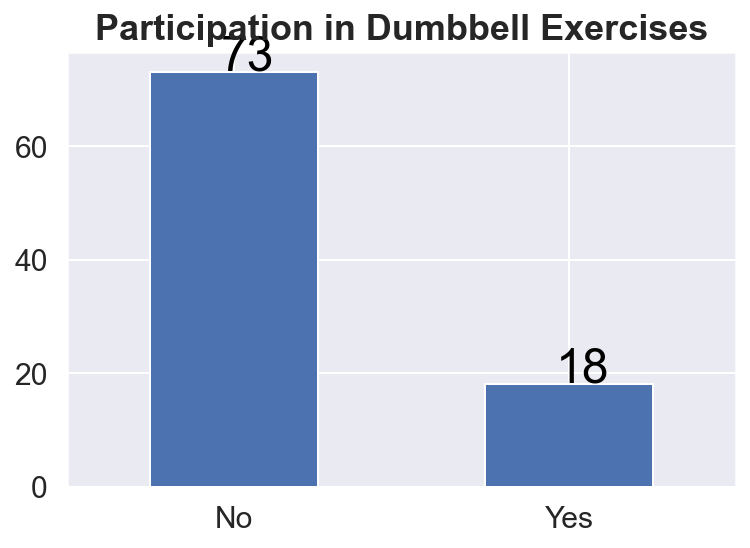

In [178]:
ax=user_df['Dumbbell Or Not'].value_counts().plot(kind = 'bar')
plt.title('Participation in Dumbbell Exercises',fontsize = 18,fontweight='bold')
plt.xticks([0,1],['No','Yes'],rotation = 0,fontsize = 15)
plt.yticks(fontsize = 15)

for i, v in enumerate(user_df['Dumbbell Or Not'].value_counts().values):
    ax.text(i-0.04, v+0.5, str(v), color='black')

In [179]:
user_df['Dumbbell Or Not'][user_df['Dumbbell Or Not']==1].count()/user_df['Dumbbell Or Not'][user_df['Dumbbell Or Not']==0].count()

0.2465753424657534

The ratio of Yes/No on our output variable is 0.25, which acceptable and not so imbalanced.

## 5.3 Data Splitting and Normalization

In [181]:
from sklearn.model_selection import train_test_split

In [182]:
features = set(user_df.columns)-set(['first_workout_date','user_id','Dumbbell Or Not','most_recent_workout_date'])

In [183]:
X = user_df[features]
y = user_df['Dumbbell Or Not']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

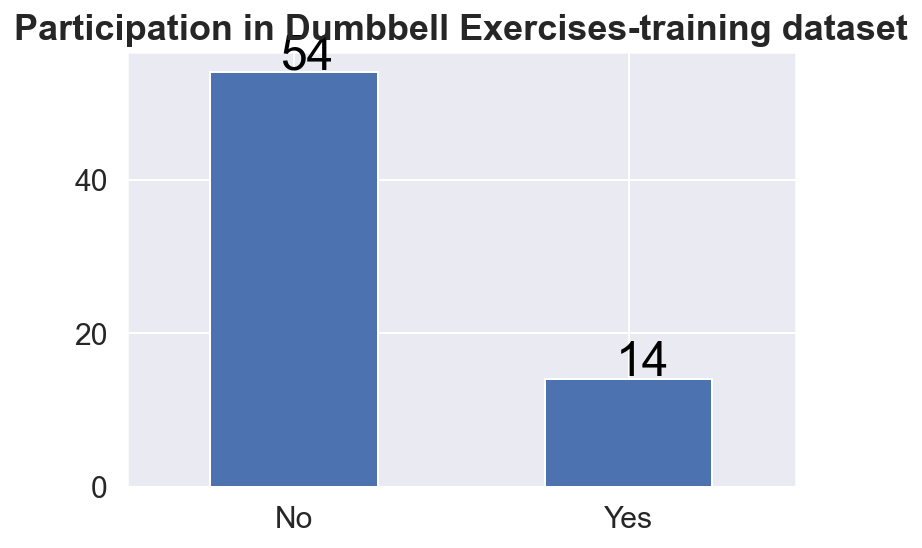

In [184]:
ax=y_train.value_counts().plot(kind = 'bar')
plt.title('Participation in Dumbbell Exercises-training dataset',fontsize = 18,fontweight='bold')
plt.xticks([0,1],['No','Yes'],rotation = 0,fontsize = 15)
plt.yticks(fontsize = 15)

for i, v in enumerate(y_train.value_counts().values):
    ax.text(i-0.04, v+0.5, str(v), color='black')

In [185]:
y_train[y_train == 1].count()/y_train[y_train == 0].count()

0.25925925925925924

The ratio of Yes/No in our training dataset is 0.2593, and there is no need to do the resampling.

In [186]:
X_train.dtypes

Dumbbell Bench Press0_7                  int32
Deadlift_r7                            float64
Close-Grip Bench Press7_30               int32
Dumbbell Shoulder Press7_30              int32
workouts_first_90                        int64
Dumbbell Shoulder Press_r7             float64
Dumbbell Shoulder Press0_7               int32
Dumbbell Shoulder Pressr7_r30          float64
Dumbbell Row0_7                          int32
Dumbbell Row_r7                        float64
Dumbbell Bench Press_r7                float64
Barbell Bench Press0_7                   int32
# of Recordings in first 7 days          int32
# of Recordings in recent 7-30 days    float64
Deadliftr7_r30                         float64
workouts_recent_7                      float64
since_last_workout                       int64
Dumbbell Lunger7_r30                   float64
Dumbbell Lunge7_30                       int32
Back Squat7_30                           int32
Deadlift7_30                             int32
Close-Grip Be

In [187]:
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()
scaler = min_max_scaler.fit(X_train)

In [188]:
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
X_train

array([[0.57142857, 0.        , 0.        , ..., 0.22222222, 0.        ,
        0.        ],
       [0.71428571, 0.        , 0.        , ..., 1.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.61111111, 0.        ,
        0.        ],
       ...,
       [0.57142857, 0.        , 0.        , ..., 0.22222222, 0.        ,
        0.        ],
       [0.42857143, 0.        , 0.23076923, ..., 0.16666667, 0.        ,
        0.        ],
       [0.57142857, 0.        , 0.23076923, ..., 0.22222222, 0.        ,
        0.        ]])

## 5.4 Feature Selection

In [191]:
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectFromModel

In [192]:
logreg_lasso = LogisticRegression(max_iter = 10000,penalty = 'l1',solver = 'liblinear')
logreg_lasso.fit(X_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=10000,
                   multi_class='auto', n_jobs=None, penalty='l1',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

In [194]:
sfm_logreg = SelectFromModel(logreg_lasso)
sfm_logreg.fit_transform(X_train,y_train)

array([[0.57142857, 0.        , 0.625     , 0.3556338 , 0.        ,
        0.        , 0.67381174],
       [0.71428571, 0.        , 0.        , 0.33098592, 0.        ,
        0.        , 0.26188257],
       [0.        , 0.        , 0.        , 0.16549296, 0.        ,
        0.        , 0.24697111],
       [0.        , 0.        , 0.        , 0.02464789, 0.05      ,
        0.08695652, 0.13420317],
       [0.        , 0.        , 0.5       , 0.16549296, 0.        ,
        0.        , 0.09040075],
       [0.        , 0.        , 0.        , 0.01877934, 0.1       ,
        0.08695652, 0.        ],
       [0.42857143, 0.59090909, 0.        , 0.00469484, 0.75      ,
        0.76086957, 0.583411  ],
       [0.        , 0.        , 0.        , 0.16549296, 0.        ,
        0.        , 0.27679404],
       [0.71428571, 0.        , 0.75      , 0.342723  , 0.        ,
        0.        , 0.22833178],
       [0.57142857, 0.        , 0.375     , 0.20539906, 0.        ,
        0.        , 0.6

In [195]:
selected_features = X.columns[sfm_logreg.get_support(indices = True)]
for i, feature in enumerate(selected_features):
    print(i+1,' ',feature)

1   Dumbbell Bench Press0_7
2   Dumbbell Bench Press_r7
3   Barbell Bench Press0_7
4   since_last_workout
5   workouts_recent_30
6   workouts_recent_90
7   time_span(days)


In [196]:
coef_list = (sfm_logreg.estimator_.coef_).T.tolist()
feature_importance = pd.Series(coef_list,index = X.columns)
order = feature_importance.map(lambda x:x[0]).abs().sort_values(ascending = False)
order_dict = order.to_dict()
for i,(key,value) in enumerate(order_dict.items()):
    print(i+1,' ',key,' ',value)

1   workouts_recent_90   3.441839919818916
2   since_last_workout   1.7611722941766448
3   Dumbbell Bench Press_r7   0.41217954420980624
4   workouts_recent_30   0.36709656854393613
5   time_span(days)   0.08581546184765726
6   Barbell Bench Press0_7   0.07075523811715949
7   Dumbbell Bench Press0_7   0.06731293955464995
8   workouts_first_90   0.0
9   Dumbbell Shoulder Press_r7   0.0
10   Close-Grip Bench Press0_7   0.0
11   Deadlift7_30   0.0
12   Back Squat7_30   0.0
13   Dumbbell Lunge7_30   0.0
14   Deadlift_r7   0.0
15   Dumbbell Lunger7_r30   0.0
16   Close-Grip Bench Press7_30   0.0
17   workouts_recent_7   0.0
18   Deadliftr7_r30   0.0
19   # of Recordings in recent 7-30 days   0.0
20   # of Recordings in first 7 days   0.0
21   Dumbbell Shoulder Press7_30   0.0
22   # of Recordings in recent 7 days   0.0
23   Dumbbell Row_r7   0.0
24   Dumbbell Row0_7   0.0
25   Dumbbell Shoulder Pressr7_r30   0.0
26   Dumbbell Shoulder Press0_7   0.0
27   Back Squat0_7   0.0
28   Dumbbell Be

## 5.4 Model Implementation

In [197]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score,confusion_matrix,f1_score, recall_score,precision_score, roc_auc_score,roc_curve
from sklearn.linear_model import LogisticRegression
import seaborn as sns
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_recall_curve
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.model_selection import RandomizedSearchCV

C:\Users\Yunge Li\Anaconda3\lib\site-packages\dask\dataframe\utils.py:15: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


### Model Tuning

In [206]:
def rfclassifier(X_train,X_test,y_train,y_test):
    rfc= RandomForestClassifier()
    param_grid = {
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}
    
    scores = ['accuracy','f1']

    fig, ax = plt.subplots(4, 3,figsize = (40,30))
    fig.subplots_adjust(left=0.0625, right=0.95, wspace=0.1)

    count = 1
    for sc in scores:
        rf_random = RandomizedSearchCV(estimator = rfc, param_distributions = param_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1,scoring = sc)
        print("# Tuning hyper-parameters for %s" % sc)
        rf_random.fit(X_train,y_train)
        print(rf_random.best_params_)
        rfc = rf_random.best_estimator_   
        y_pred = rfc.predict(X_test)
        y_pred_rfc_pos_proba = rfc.predict_proba(X_test)[:,1]
        

        print('accuracy = ',accuracy_score(y_test,y_pred))
        print('f1_score = ',f1_score(y_test,y_pred))
    

        precision, recall, thresholds = precision_recall_curve(y_test, y_pred_rfc_pos_proba, pos_label=1)
        auc1 = np.trapz(recall,precision)
        fpr, tpr, thresholds = roc_curve(y_test, y_pred, pos_label=1)
        auc2 = np.trapz(tpr, fpr)
        plt.subplot(2, 3, count)
        plt.plot(fpr, tpr, linestyle='-', alpha=0.5, color= "C1", label = 'ROC AUC='+"%.2f"%auc2)
        plt.title("ROC Curve")
        plt.legend(title = 'ROC Curve for RF') 
        plt.xlabel("FPR")
        plt.ylabel("TPR")
        plt.subplot(2, 3, count+1)
        plt.plot(precision, recall, linestyle='-', alpha=0.5, color= "C0", label = 'PR AUC='+"%.2f"%auc1)
        plt.legend(title = 'PR Curve for RF') 
        plt.title("PR Curve")
        plt.xlabel("precision")
        plt.ylabel("recall")
        plt.subplot(2, 3, count+2)
        mat = confusion_matrix(y_test,y_pred)
        sns.heatmap(mat.T, square=True, annot=True, cbar=False,
                xticklabels=[0,1],
                yticklabels=[0,1])
        plt.xlabel('true label')
        plt.ylabel('predicted label')
        plt.title(sc)
        count+=3

# Tuning hyper-parameters for accuracy
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   47.8s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.6min finished


{'n_estimators': 1800, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 80}
accuracy =  0.8695652173913043
f1_score =  0.7272727272727273
# Tuning hyper-parameters for f1
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   47.4s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.6min finished


{'n_estimators': 1800, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 80}
accuracy =  0.8695652173913043
f1_score =  0.7272727272727273


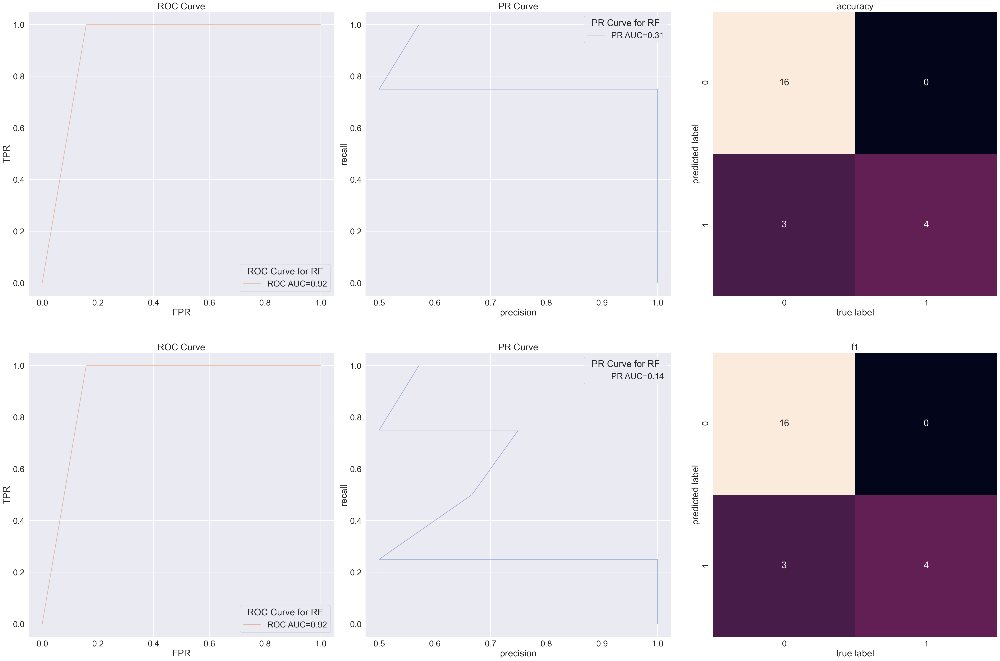

In [207]:
rfclassifier(X_train,X_test,y_train,y_test)